# Main

In [1]:
!pip install dmba
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip;

     |████████████████████████████████| 11.8 MB 5.3 MB/s 


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from termcolor import colored
import missingno as ms
from pathlib import Path
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from copy import deepcopy
import dmba
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from dmba import regressionSummary, exhaustive_search,backward_elimination
#from dmba.metric import classificationSummary
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.naive_bayes import MultinomialNB
from dmba import classificationSummary, gainsChart
from sklearn.naive_bayes import GaussianNB, CategoricalNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import plot_confusion_matrix
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, LassoCV,BayesianRidge
import statsmodels.formula.api as sm
from dmba import adjusted_r2_score, AIC_score, BIC_score
from sklearn.model_selection import cross_val_score, GridSearchCV
from dmba import plotDecisionTree
from sklearn import tree
from pandas_profiling import ProfileReport
from plotly.subplots import make_subplots
import plotly.graph_objects as go

no display found. Using non-interactive Agg backend


In [3]:
from google.colab import files
file = files.upload() 
df = pd.read_csv("heart.csv") 
df.head()

Saving heart.csv to heart.csv


,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [4]:
print(df.info())
print('\n*Re-check* The number of missing value of each column is:\n', end ='')
print(df.isnull().sum())
print('\nThe dataset shape is', df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB
None

*Re-check* The number of missing value of each column is:
Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        

In [5]:
#ProfileReport(df)
#profile = ProfileReport(df)
#profile.to_notebook_iframe()

In [6]:

print(colored("Heart Disease - where 1 referes to positive and 0 to negative\n", 'blue', attrs=['bold']) , end ='',)
print(df["HeartDisease"].value_counts(), "\n")
print(colored("Sex - where 0 refers to female and 1 to male\n", 'blue', attrs=['bold']), end ='')
print(df["Sex"].value_counts(),"\n")
print(colored("Chest Pain Type - where 0 refers to TA, 1 to ATA, 2 to NAP and 3 to ASY\n", 'blue', attrs=['bold']), end ='')
print(df["ChestPainType"].value_counts(),"\n")
print(colored("RestingECG - where 0 referes to Normal, 1 to ST and 2 to LVH\n", 'blue', attrs=['bold']), end ='')
print(df["RestingECG"].value_counts(),"\n")
print(colored("Exercise Angina - where 0 referes No and 1 to Yes\n", 'blue', attrs=['bold']), end ='')
print(df["ExerciseAngina"].value_counts(),"\n")
print(colored("ST_Slope - where 0 referes to Up, 1 to Flate and 2 to Down\n", 'blue', attrs=['bold']), end ='')
print(df["ST_Slope"].value_counts(),"\n")
Gmean = ['Age', 'RestingBP', 'Cholesterol']
print(colored("Mean\n", 'blue', attrs=['bold']), df.groupby('HeartDisease')[Gmean].mean(),"\n")
print(colored("Sex\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease', 'Sex'])['HeartDisease'].count(),"\n")
print(colored("Chest Pain Type\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease','ChestPainType'])['HeartDisease'].count(),"\n")
print(colored("FastingBS\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease','FastingBS'])['HeartDisease'].count(),"\n")
print(colored("RestingECG\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease','RestingECG'])['HeartDisease'].count(),"\n")
print(colored("MaxHR\n", 'blue', attrs=['bold']), df.groupby('HeartDisease')['MaxHR'].mean(),"\n")
print(colored("Exercise Angina\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease','ExerciseAngina'])['HeartDisease'].count(),"\n")
print(colored("Old Peak - Mean\n", 'blue', attrs=['bold']), df.groupby('HeartDisease')['Oldpeak'].mean(),"\n")
print(colored("ST_Slope\n", 'blue', attrs=['bold']), df.groupby(['HeartDisease','ST_Slope'])['HeartDisease'].count(),"\n")

Heart Disease - where 1 referes to positive and 0 to negative
1    508
0    410
Name: HeartDisease, dtype: int64 

Sex - where 0 refers to female and 1 to male
M    725
F    193
Name: Sex, dtype: int64 

Chest Pain Type - where 0 refers to TA, 1 to ATA, 2 to NAP and 3 to ASY
ASY    496
NAP    203
ATA    173
TA      46
Name: ChestPainType, dtype: int64 

RestingECG - where 0 referes to Normal, 1 to ST and 2 to LVH
Normal    552
LVH       188
ST        178
Name: RestingECG, dtype: int64 

Exercise Angina - where 0 referes No and 1 to Yes
N    547
Y    371
Name: ExerciseAngina, dtype: int64 

ST_Slope - where 0 referes to Up, 1 to Flate and 2 to Down
Flat    460
Up      395
Down     63
Name: ST_Slope, dtype: int64 

Mean
                     Age   RestingBP  Cholesterol
HeartDisease                                    
0             50.551220  130.180488   227.121951
1             55.899606  134.185039   175.940945 

Sex
 HeartDisease  Sex
0             F      143
              M      267


In [7]:
df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [8]:
print('zero values in Cholesterol col =', df["Cholesterol"].value_counts()[0],'which equal', round(df["Cholesterol"].value_counts()[0]/len(df) * 100,2) ,'% of the total data', "\n")
print('zero values in RestingBP col =',df["RestingBP"].value_counts()[0], "\n")

zero values in Cholesterol col = 172 which equal 18.74 % of the total data 

zero values in RestingBP col = 1 



In [9]:
df.drop(df.index[df['RestingBP'] == 0], inplace=True)

In [10]:
#Showing the dataset as histograms
fig = make_subplots(rows=4, cols=3,
                   subplot_titles=df.columns[:-1])
fig.add_trace(go.Histogram(x=df.Age,name='Age'), row=1, col=1)
fig.add_trace(go.Histogram(x=df.Sex, name='Sex'),row=1, col=2)
fig.add_trace(go.Histogram(x=df.ChestPainType, name='CheatPainType'),row=1, col=3)
fig.add_trace(go.Histogram(x=df.RestingBP, name='RestingBP'),row=2, col=1)
fig.add_trace(go.Histogram(x=df.Cholesterol, name='Cholesterol'),row=2, col=2)
fig.add_trace(go.Histogram(x=df.FastingBS, name='FastingBS'), row=2, col=3)
fig.add_trace(go.Histogram(x=df.RestingECG, name='RestingECG'),row=3, col=1)
fig.add_trace(go.Histogram(x=df.MaxHR, name='MaxHR'),row=3, col=2)
fig.add_trace(go.Histogram(x=df.ExerciseAngina, name='ExerciseAngina'), row=3, col=3)
fig.add_trace(go.Histogram(x=df['Oldpeak'], name='Oldpeak'), row=4, col=1)
fig.add_trace(go.Histogram(x=df.ST_Slope, name='ST_Slope'),row=4, col=2)
fig.add_trace(go.Histogram(x=df.HeartDisease, name='HeartDisease'), row=4, col=3)
fig.update_layout(title='Histograms of All Variables', title_x=0.5)

In [11]:
#Investigating the object type
print(df['Sex'].unique())
print(df.ChestPainType.unique())
print(df['ExerciseAngina'].unique())
print(df['RestingECG'].unique())
print(df['ST_Slope'].unique())


['M' 'F']
['ATA' 'NAP' 'ASY' 'TA']
['N' 'Y']
['Normal' 'ST' 'LVH']
['Up' 'Flat' 'Down']


In [12]:
#Converting categorical data to numeric 
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
print('\nThe dataset shape is', df.shape)
df.head()


The dataset shape is (917, 12)


,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,0,172,0,0.0,0,0
1,49,0,2,160,180,0,0,156,0,1.0,1,1
2,37,1,1,130,283,0,1,98,0,0.0,0,0
3,48,0,3,138,214,0,0,108,1,1.5,1,1
4,54,1,2,150,195,0,0,122,0,0.0,0,0


Total count of positive and negative results of Heart Diseases is
1    507
0    410
Name: HeartDisease, dtype: int64


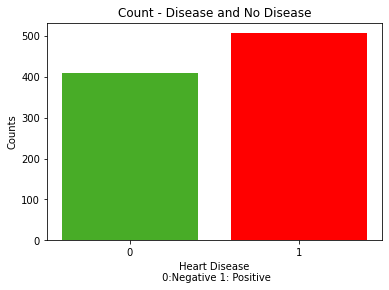

In [13]:
%matplotlib inline
Hd = df['HeartDisease'].value_counts()
print('Total count of positive and negative results of Heart Diseases is')
print(Hd);
fig, ax = plt.subplots()
ax.bar(Hd.index, Hd, color=['red', '#48ac27'])
ax.set_xticks([0, 1])
ax.set_xlabel('Heart Disease\n 0:Negative 1: Positive')
ax.set_ylabel('Counts')
ax.set_yticks(np.arange(0,600,100))
plt.title("Count - Disease and No Disease")
plt.show()

                    Age   RestingBP  Cholesterol       MaxHR
HeartDisease                                                
0             50.551220  130.180488   227.121951  148.151220
1             55.901381  134.449704   176.287968  127.601578
The mean of each categories for the Heart Disease


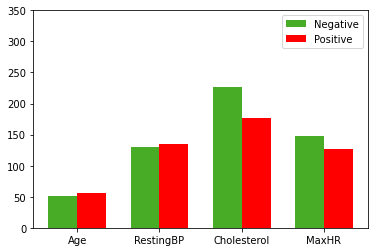

In [14]:
%matplotlib inline
Gmean = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR']
Gm = df.groupby('HeartDisease')[Gmean].mean()
print(Gm)
label = np.arange(0,400,50)
indx = np.arange(len(Gmean))
n_mean = list(Gm.T[0])
p_mean = list(Gm.T[1])

bar_width = 0.35
fig, ax = plt.subplots()
barN = ax.bar(indx - bar_width/2, n_mean, bar_width, label = 'Negative', color = '#48ac27')
barP = ax.bar(indx + bar_width/2, p_mean, bar_width, label = 'Positive', color = 'red')
ax.set_xticks(indx)
ax.set_xticklabels(Gmean)
ax.set_yticks(label)
ax.set_yticklabels(label)
ax.legend()


print('The mean of each categories for the Heart Disease')
plt.show()

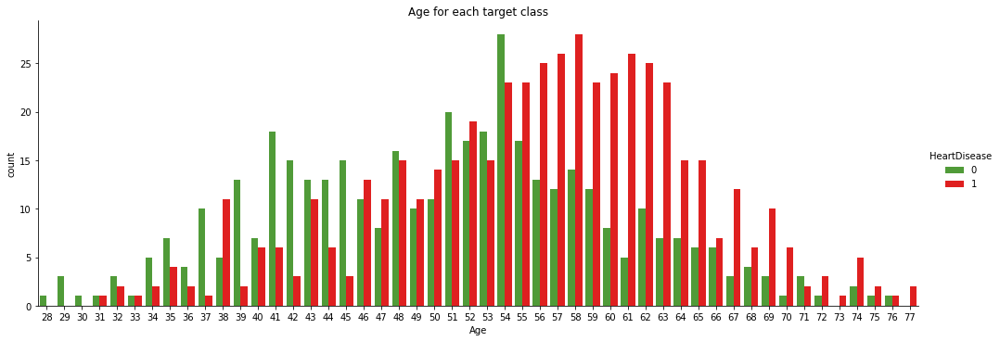

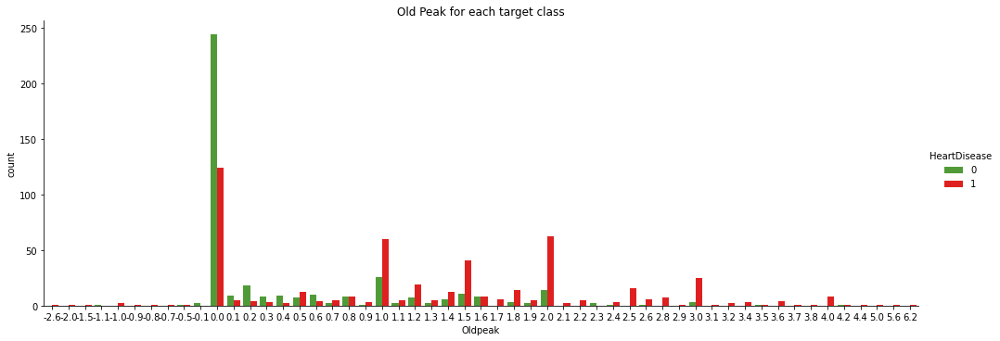

In [15]:
sns.catplot(kind = 'count', data = df, x = 'Age', hue = 'HeartDisease', aspect = 2.8, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('Age for each target class')
sns.catplot(kind = 'count', data = df, x = 'Oldpeak', hue = 'HeartDisease', aspect = 2.8, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('Old Peak for each target class')
plt.show()

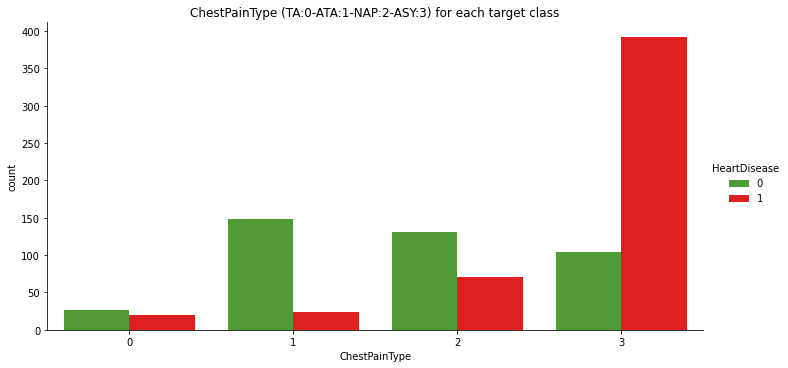

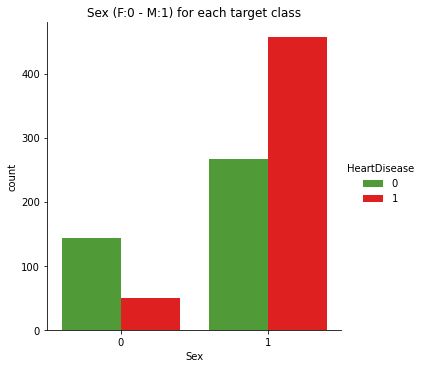

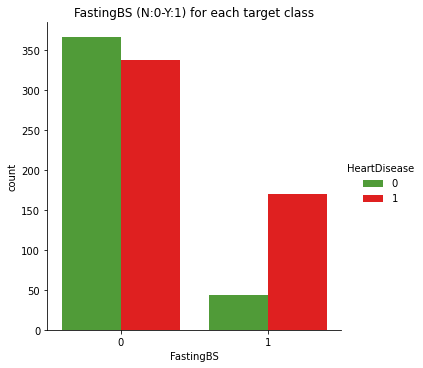

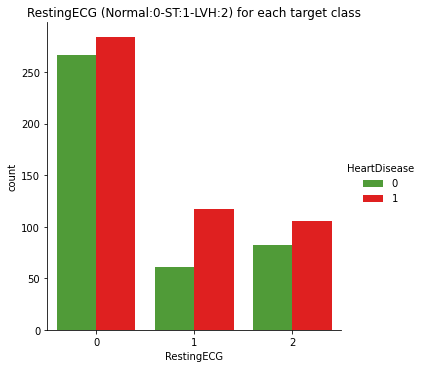

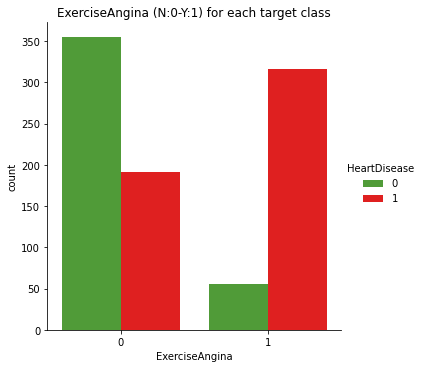

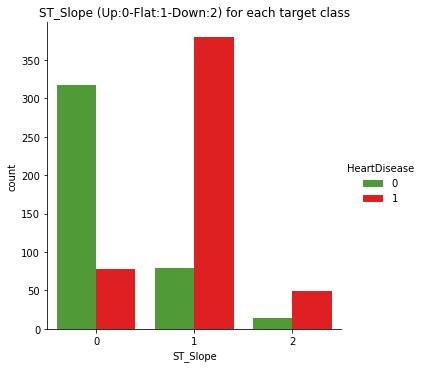

In [16]:
sns.catplot(kind = 'count', data = df, x = 'ChestPainType', hue = 'HeartDisease', aspect = 2, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('ChestPainType (TA:0-ATA:1-NAP:2-ASY:3) for each target class')

sns.catplot(kind = 'count', data = df, x = 'Sex', hue = 'HeartDisease', aspect = 1, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('Sex (F:0 - M:1) for each target class')

sns.catplot(kind = 'count', data = df, x = 'FastingBS', hue = 'HeartDisease', aspect = 1, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('FastingBS (N:0-Y:1) for each target class')

sns.catplot(kind = 'count', data = df, x = 'RestingECG', hue = 'HeartDisease', aspect = 1, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('RestingECG (Normal:0-ST:1-LVH:2) for each target class')

sns.catplot(kind = 'count', data = df, x = 'ExerciseAngina', hue = 'HeartDisease', aspect = 1, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('ExerciseAngina (N:0-Y:1) for each target class')

sns.catplot(kind = 'count', data = df, x = 'ST_Slope', hue = 'HeartDisease', aspect = 1, palette=sns.color_palette(['#48ac27', 'red']))
plt.title('ST_Slope (Up:0-Flat:1-Down:2) for each target class')

plt.show()


Text(0.5, 1.0, 'Boxplot 1')

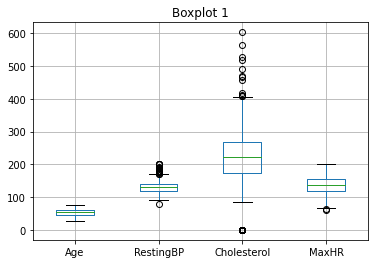

In [17]:
boxplot = df.boxplot(column=['Age','RestingBP','Cholesterol', 'MaxHR']) 
plt.title("Boxplot 1")

Text(0.5, 1.0, 'Boxplot 2')

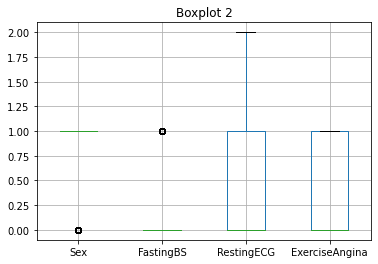

In [18]:
boxplot = df.boxplot(column=['Sex','FastingBS', 'RestingECG', 'ExerciseAngina']) 
plt.title("Boxplot 2")

Text(0.5, 1.0, 'Boxplot 3')

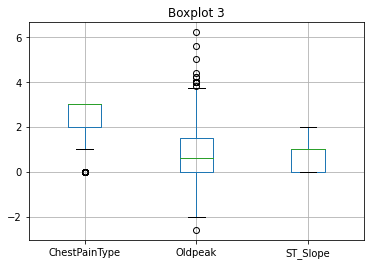

In [19]:
boxplot = df.boxplot(column=['ChestPainType','Oldpeak', 'ST_Slope']) 
plt.title("Boxplot 3")

# Scenario 1 - Keeping All outliers except for RestingBP(0)

RandomForestClassifier(n_estimators=88, random_state=50)

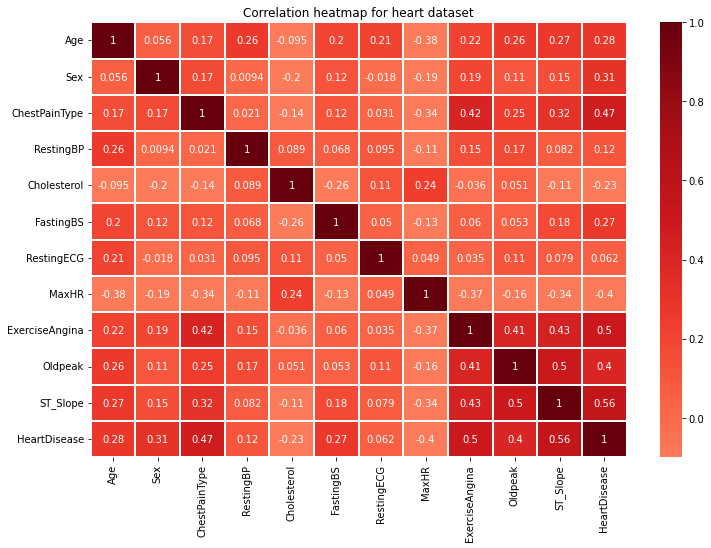

In [20]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 50)
rfa.fit(trainData, trainTarget)

In [21]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 15) (230, 15) (687,) (230,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
853 -0.668303    1   0.323177     0.535778          0  0.748105   
110  0.600872    0  -0.121981    -0.095984          0 -0.497830   
137 -1.514420    1  -0.678429     0.389282          0  0.358750   
325 -1.197126    1  -1.513101    -1.817308          1 -0.342088   
891  1.341225    0   0.768336     0.728053          0  0.592363   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
853               0 -0.850788                0                1   
110               0  0.071123                1                0   
137               0  0.993034                1                0   
325               1 -2.233655                0                0   
891               0 -0.850788                0                1   

     ChestPainType_3  RestingECG_1  RestingECG_2  ST_Slope_1  ST_Slope_2  
853                0             0             1           0           0  
110       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
428,0.847974,1,-1.309724,-1.839149,0,-0.678717,1,-0.278161,0,0,1,0,0,1,0
424,0.633886,1,-0.754347,-1.839149,1,0.169679,1,1.218960,0,1,0,0,0,0,0
765,-1.399949,1,-1.198648,0.452812,0,1.704872,0,-0.777201,0,1,0,0,0,0,0
173,-0.543597,1,0.356407,-0.124762,0,1.422074,0,-0.777201,0,1,0,0,0,0,0
391,1.704326,1,-1.032035,-1.839149,0,-1.809912,1,-0.777201,0,0,1,1,0,1,0


In [22]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.800000,0.200000
1,2,0.769565,0.230435
2,3,0.852174,0.147826
3,4,0.830435,0.169565
4,5,0.865217,0.134783
5,6,0.878261,0.121739
6,7,0.891304,0.108696
7,8,0.886957,0.113043
8,9,0.895652,0.104348


KNN - StandardScaler

   Confusion Matrix - Validation Data


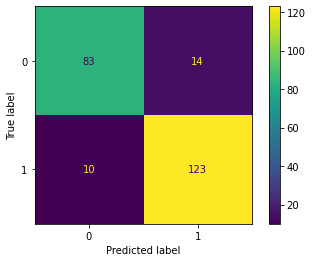

Training Accuracy: 0.87
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.69


In [23]:
knn1 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [24]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 15) (230, 15) (687,) (230,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
853  0.395833    1   0.483333     0.485822          0  0.676056   
110  0.645833    0   0.416667     0.355388          0  0.450704   
137  0.229167    1   0.333333     0.455577          0  0.605634   
325  0.291667    1   0.208333     0.000000          1  0.478873   
891  0.791667    0   0.550000     0.525520          0  0.647887   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
853               0  0.317073                0                1   
110               0  0.439024                1                0   
137               0  0.560976                1                0   
325               1  0.134146                0                0   
891               0  0.317073                0                1   

     ChestPainType_3  ST_Slope_1  ST_Slope_2  RestingECG_1  RestingECG_2  
853                0           0           0             0             1  
110       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
428,0.687500,1,0.18,0.000000,0,0.431818,1,0.197183,0,0,1,1,0,0,0
424,0.645833,1,0.28,0.000000,1,0.590909,1,0.408451,0,1,0,0,0,0,0
765,0.250000,1,0.20,0.414594,0,0.878788,0,0.126761,0,1,0,0,0,0,0
173,0.416667,1,0.48,0.310116,0,0.825758,0,0.126761,0,1,0,0,0,0,0
391,0.854167,1,0.23,0.000000,0,0.219697,1,0.126761,0,0,1,1,0,1,0


In [25]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.817391,0.182609
1,2,0.756522,0.243478
2,3,0.856522,0.143478
3,4,0.839130,0.160870
4,5,0.865217,0.134783
5,6,0.847826,0.152174
6,7,0.878261,0.121739
7,8,0.865217,0.134783
8,9,0.869565,0.130435


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


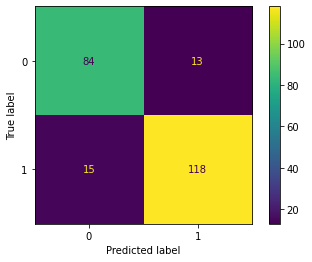

Training Accuracy: 0.87
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.68


In [26]:
knn2 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

In [27]:
#with droping less (below 0.1) corrolated value 
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['RestingBP','MaxHR','Oldpeak', 'Cholesterol']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()

(687, 13) (230, 13) (687,) (230,)
     Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  ExerciseAngina  \
853   47    1   0.323177     0.535778          0  0.748105               0   
110   59    0  -0.121981    -0.095984          0 -0.497830               0   
137   39    1  -0.678429     0.389282          0  0.358750               0   
325   42    1  -1.513101    -1.817308          1 -0.342088               1   
891   66    0   0.768336     0.728053          0  0.592363               0   

      Oldpeak  ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  \
853 -0.850788                0                1                0           0   
110  0.071123                1                0                0           1   
137  0.993034                1                0                0           0   
325 -2.233655                0                0                1           0   
891 -0.850788                0                1                0           1   

     ST_Slope_2 

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
428,62,1,-1.309724,-1.839149,0,-0.678717,1,-0.278161,0,0,1,1,0
424,60,1,-0.754347,-1.839149,1,0.169679,1,1.218960,0,1,0,0,0
765,41,1,-1.198648,0.452812,0,1.704872,0,-0.777201,0,1,0,0,0
173,49,1,0.356407,-0.124762,0,1.422074,0,-0.777201,0,1,0,0,0
391,70,1,-1.032035,-1.839149,0,-1.809912,1,-0.777201,0,0,1,1,0


In [28]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.808696,0.191304
1,2,0.752174,0.247826
2,3,0.834783,0.165217
3,4,0.813043,0.186957
4,5,0.843478,0.156522
5,6,0.830435,0.169565
6,7,0.839130,0.160870
7,8,0.826087,0.173913
8,9,0.834783,0.165217


KNN - StandardScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


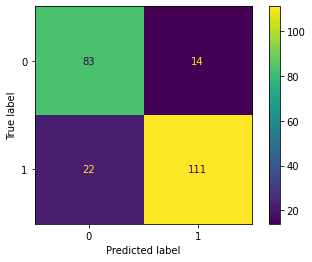

Training Accuracy: 0.87
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 36

Cross Validation - 7 Fold: 0.68


In [29]:
knn3 = KNeighborsClassifier(n_neighbors=5).fit(trainData, trainTarget)

#Model Performance

predicted = knn3.predict(validData)
misclassified = (validTarget != predicted).sum()
knn3_result_ssc = accuracy_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn3_cross_ssc = np.mean(cross_val_score(knn3, x,y, cv=7))
predictedp = knn3.predict_proba(validData)
predictedp = predictedp[:, 1]
knn3_auc = roc_auc_score(validTarget, predictedp)
knn3_false, knn3_true, _ = roc_curve(validTarget, predictedp)
print('KNN - StandardScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn3, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn3.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn3_result_ssc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn3_cross_ssc,2))

In [30]:
#with droping less (below 0.1) corrolated value and different scalling method
predictors = ['ChestPainType','ST_Slope' ]
x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = MinMaxScaler()
Norms = [['RestingBP','MaxHR','Oldpeak', 'Cholesterol']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 13) (230, 13) (687,) (230,)
     Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  ExerciseAngina  \
853   47    1   0.483333     0.485822          0  0.676056               0   
110   59    0   0.416667     0.355388          0  0.450704               0   
137   39    1   0.333333     0.455577          0  0.605634               0   
325   42    1   0.208333     0.000000          1  0.478873               1   
891   66    0   0.550000     0.525520          0  0.647887               0   

      Oldpeak  ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  \
853  0.317073                0                1                0           0   
110  0.439024                1                0                0           1   
137  0.560976                1                0                0           0   
325  0.134146                0                0                1           0   
891  0.317073                0                1                0           1   

     ST_Slope_2 

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
428,62,1,0.18,0.000000,0,0.431818,1,0.197183,0,0,1,1,0
424,60,1,0.28,0.000000,1,0.590909,1,0.408451,0,1,0,0,0
765,41,1,0.20,0.414594,0,0.878788,0,0.126761,0,1,0,0,0
173,49,1,0.48,0.310116,0,0.825758,0,0.126761,0,1,0,0,0
391,70,1,0.23,0.000000,0,0.219697,1,0.126761,0,0,1,1,0


In [31]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.821739,0.178261
1,2,0.739130,0.260870
2,3,0.791304,0.208696
3,4,0.786957,0.213043
4,5,0.804348,0.195652
5,6,0.800000,0.200000
6,7,0.791304,0.208696
7,8,0.791304,0.208696
8,9,0.826087,0.173913


KNN - MinMaxScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


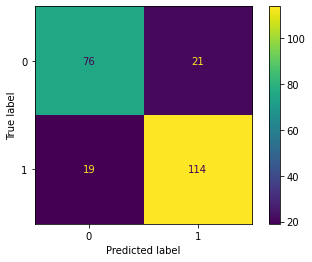

Training Accuracy: 0.87
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 40

Cross Validation - 7 Fold: 0.69


In [32]:
knn4 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)
predicted = knn4.predict(validData)

#Model Performance

predicted = knn4.predict(validData)
misclassified = (validTarget != predicted).sum()
knn4_result_mmc = accuracy_score(validTarget, predicted)
knn4_roc_mmc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn4_cross_mmc = np.mean(cross_val_score(knn4, x,y, cv=7))
predictedp = knn4.predict_proba(validData)
predictedp = predictedp[:, 1]
knn4_auc = roc_auc_score(validTarget, predictedp)
knn4_false, knn4_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn4, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn4.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn4_result_mmc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn4_cross_mmc,2))

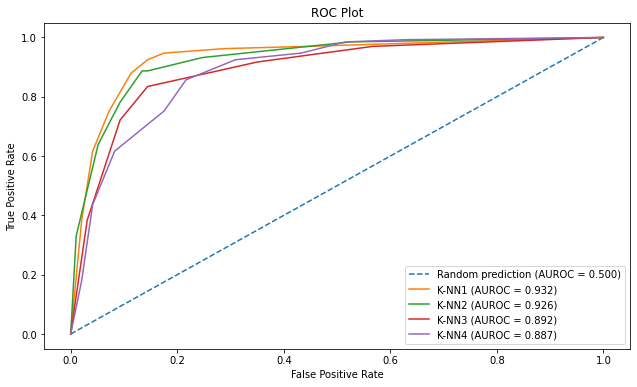

In [33]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN1 (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN2 (AUROC = %0.3f)' % knn2_auc)
plt.plot(knn3_false, knn3_true, label='K-NN3 (AUROC = %0.3f)' % knn3_auc)
plt.plot(knn4_false, knn4_true, label='K-NN4 (AUROC = %0.3f)' % knn4_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn1_result_ss,2)
bestknn_auc1 = knn1_auc
bestknn_cross1 = round(knn1_cross_ss,2)
bestknn_sen1 = knn1_sensetivity



RandomForest

   Confusion Matrix - ValidationData


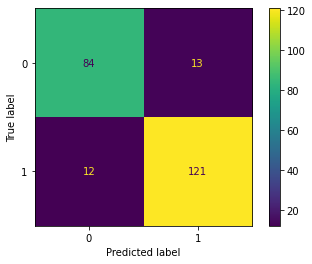

Training Accuracy: 1.00
Validation Accuracy: 0.89
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 25

Cross Validation - 7 Fold: 0.85


In [34]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

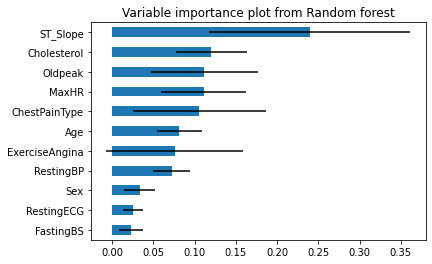

In [35]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest - Dropping Lowest

   Confusion Matrix - ValidationData


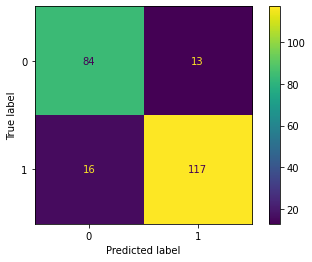

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 29

Cross Validation - 7 Fold: 0.85


In [36]:
#Random Forest

x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest - Dropping Lowest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


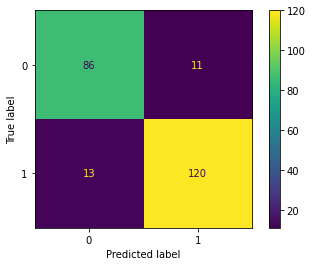

Training Accuracy: 1.00
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.86


In [37]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_auc_best1 = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
rfd_false_best1, rfd_true_best1, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest - Dummies + Dropping lowest

   Confusion Matrix - ValidationData


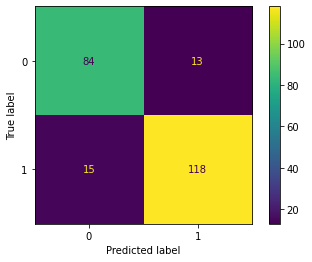

Training Accuracy: 1.00
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.85


In [38]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest - Dummies + Dropping lowest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



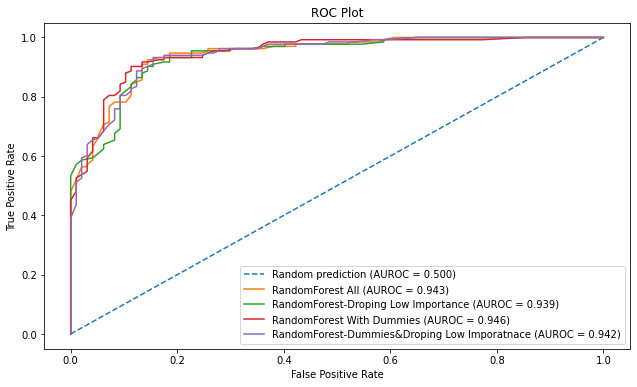

<Figure size 864x720 with 0 Axes>

In [39]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rfd_results,2)
best_rf_auc1 = round(rfd_auc,2)
best_rf_sen1 = rfd_sen
best_rf_cross1 = round(rfd_cross,2)


In [40]:
#Fine: tune.

## cutoff = 0.5
predicted = [ 1 if p > 0.54 else 0 for p in predictedp]
classificationSummary(validTarget, predicted, class_names=['0', '1'])

Confusion Matrix (Accuracy 0.8609)

       Prediction
Actual   0   1
     0  85  12
     1  20 113


Decision Tree - Gini

   Confusion Matrix - ValidationData


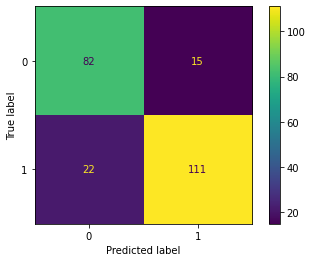

Training Accuracy: 0.97
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.88
Validation Misclassified samples: 37

Cross Validation - 7 Fold: 0.79


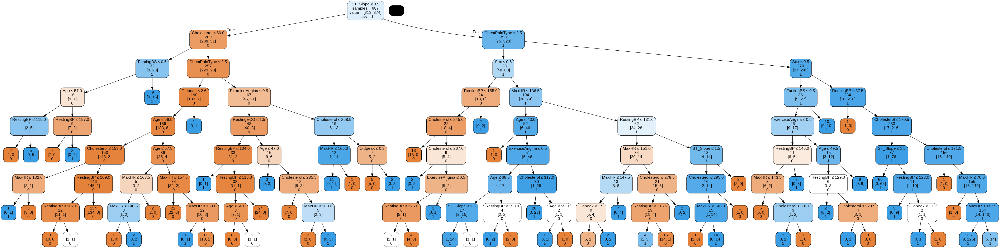

In [41]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


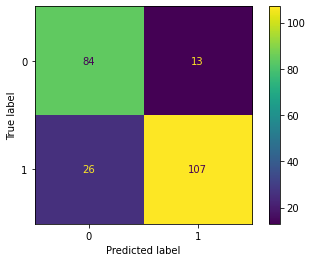

Training Accuracy: 0.97
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 39

Cross Validation - 7 Fold: 0.79


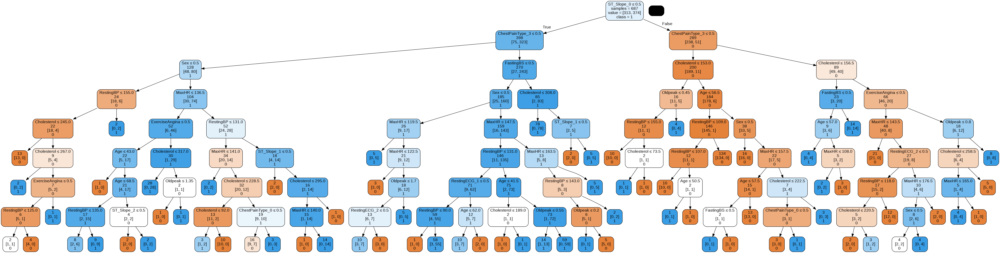

In [42]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

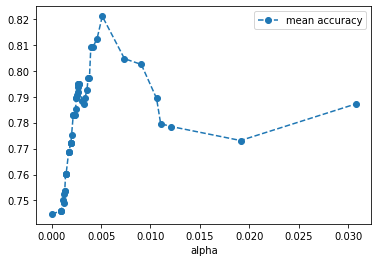

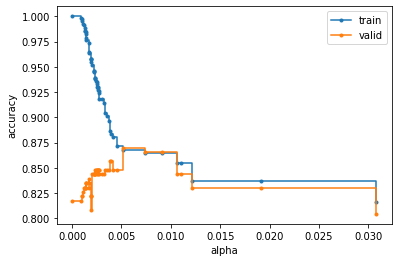

In [43]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])

#The best value is 
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


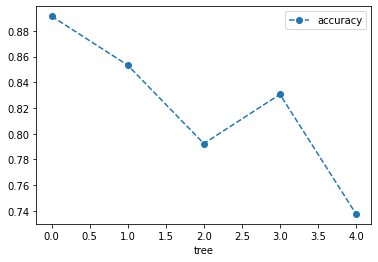

In [44]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =  0.005124)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


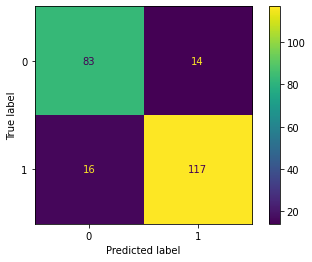

Training Accuracy: 0.87
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 30

Cross Validation - 7 Fold: 0.81


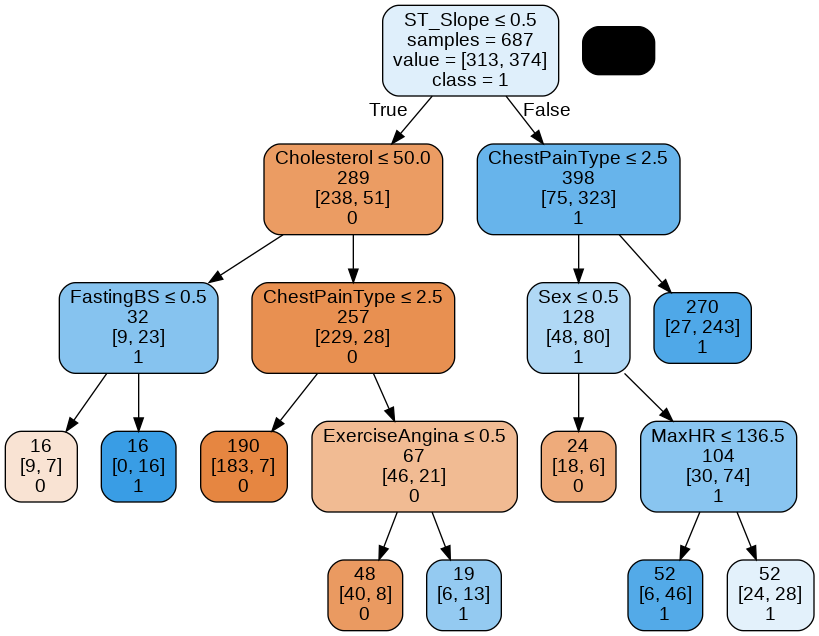

In [45]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



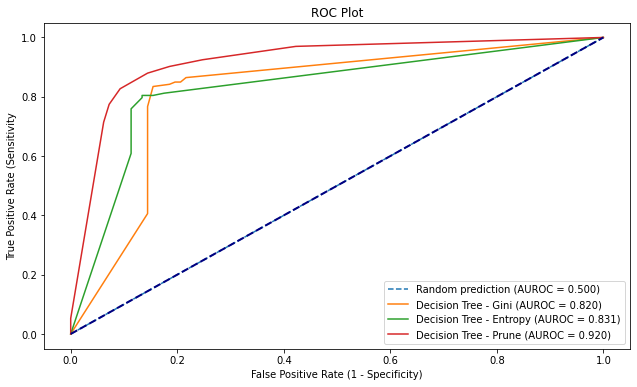

In [46]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

In [47]:
#Fine: tune.

## cutoff = 0.5
predicted = [ 1 if p > 0.38 else 0 for p in predictedp]
classificationSummary(validTarget, predicted, class_names=['0', '1'])
print(classification_report(validTarget, predicted))

Confusion Matrix (Accuracy 0.8652)

       Prediction
Actual   0   1
     0  79  18
     1  13 120
              precision    recall  f1-score   support

           0       0.86      0.81      0.84        97
           1       0.87      0.90      0.89       133

    accuracy                           0.87       230
   macro avg       0.86      0.86      0.86       230
weighted avg       0.86      0.87      0.86       230



GaussianNB

   Confusion Matrix - ValidationData


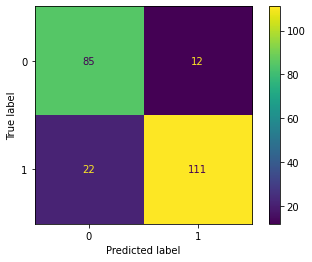

Training Accuracy: 0.85
Validation Accuracy: 0.85
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 34

Cross Validation - 7 Fold: 0.84


In [48]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [49]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['Cholesterol'] = pd.qcut(df['Cholesterol'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


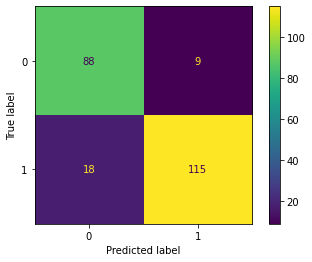

Training Accuracy: 0.85
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 27

Cross Validation - 7 Fold: 0.85


In [50]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','Cholesterol','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'Cholesterol': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
#x = pd.get_dummies(x, columns = predictors) better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

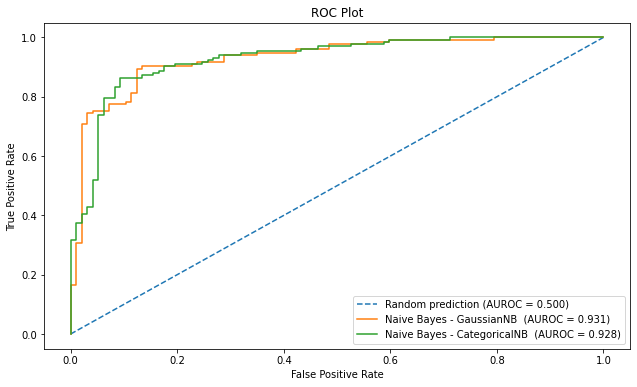

In [51]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim[(0,1)]
#plt.ylim[(0,1.05)]
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(clsnaive_results,2)
best_nv_auc1 = round(cls_auc,2)
best_nv_sen1 = clsnaive_sen
best_nv_cross1 = round(clsnaive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


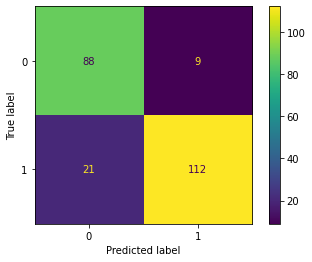

Training Accuracy: 0.84
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 30

              precision    recall  f1-score   support

           0       0.81      0.91      0.85        97
           1       0.93      0.84      0.88       133

    accuracy                           0.87       230
   macro avg       0.87      0.87      0.87       230
weighted avg       0.88      0.87      0.87       230

Cross Validation - 7 Fold: 0.86


In [52]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

In [53]:
print(lr_roc)
print(lr_auc)

0.8746608790016278
0.9281451050306178


In [54]:
## cutoff = 0.5
predicted = [ 1 if p > 0.5 else 0 for p in predictedp]
print(roc_auc_score(validTarget,predicted))
classificationSummary(validTarget, predicted, class_names=['0', '1'])


0.8746608790016278
Confusion Matrix (Accuracy 0.8696)

       Prediction
Actual   0   1
     0  88   9
     1  21 112


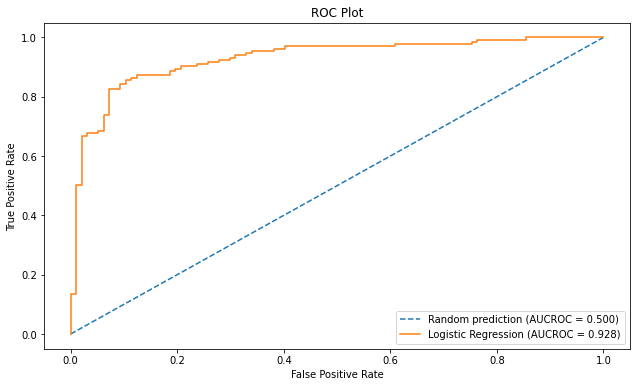

In [55]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [56]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.90,0.93,0.90,0.69
1,Best RandomForest,0.90,0.95,0.92,0.86
2,Best Decision Tree,0.87,0.92,0.89,0.81
3,Best Naive Bayes,0.88,0.93,0.93,0.85
4,Best Logistic Regression,0.87,0.93,0.93,0.86


# Scenario 2 - Removing Cholestrol zero rows

In [57]:
#Droping the zero values with refered rows which does not make sense as part of the reading - Case #
df = pd.read_csv("heart.csv") 
df.drop(df.index[df['RestingBP'] == 0], inplace=True)
df.drop(df.index[df['Cholesterol'] == 0], inplace=True)
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
#print('\nThe dataset shape is', df.shape)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,746.0,52.882038,9.505888,28.0,46.00,54.0,59.0,77.0
Sex,746.0,0.756032,0.429762,0.0,1.00,1.0,1.0,1.0
ChestPainType,746.0,2.163539,0.955414,0.0,1.00,2.0,3.0,3.0
RestingBP,746.0,133.022788,17.282750,92.0,120.00,130.0,140.0,200.0
Cholesterol,746.0,244.635389,59.153524,85.0,207.25,237.0,275.0,603.0
FastingBS,746.0,0.167560,0.373726,0.0,0.00,0.0,0.0,1.0
RestingECG,746.0,0.639410,0.838664,0.0,0.00,0.0,1.0,2.0
MaxHR,746.0,140.226542,24.524107,69.0,122.00,140.0,160.0,202.0
ExerciseAngina,746.0,0.384718,0.486855,0.0,0.00,0.0,1.0,1.0
Oldpeak,746.0,0.901609,1.072861,-0.1,0.00,0.5,1.5,6.2


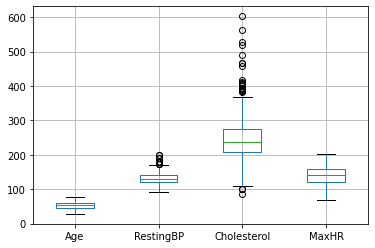

In [58]:
%matplotlib inline
boxplot = df.boxplot(column=['Age','RestingBP','Cholesterol', 'MaxHR']) 

Heart Disease - where 1 referes to positive and 0 to negative
0    390
1    356
Name: HeartDisease, dtype: int64 

Total count of positive and negative results of Heart Diseases


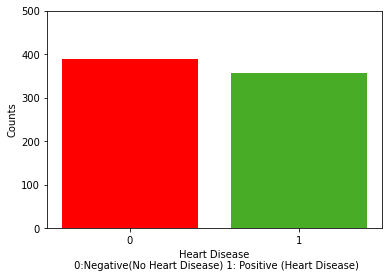

In [59]:
HeartDisease = df['HeartDisease'].value_counts()
print(colored("Heart Disease - where 1 referes to positive and 0 to negative\n", 'blue', attrs=['bold']) , end ='')
print(HeartDisease, "\n");
print(colored('Total count of positive and negative results of Heart Diseases','blue', attrs=['bold']))


fig, ax = plt.subplots()
ax.bar(HeartDisease.index, HeartDisease, color=['red', '#48ac27'])
ax.set_xticks([0, 1])
ax.set_xlabel('Heart Disease\n 0:Negative(No Heart Disease) 1: Positive (Heart Disease)')
ax.set_ylabel('Counts')
ax.set_yticks(np.arange(0,600,100))
plt.show()

In [60]:
fig = make_subplots(rows=4, cols=3,
                   subplot_titles=df.columns[:-1])
fig.add_trace(go.Histogram(x=df.Age, name='Age'), row=1, col=1)
fig.add_trace(go.Histogram(x=df.Sex, name='Sex'),row=1, col=2)
fig.add_trace(go.Histogram(x=df.ChestPainType, name='CheatPainType'),row=1, col=3)
fig.add_trace(go.Histogram(x=df.RestingBP, name='RestingBP'),row=2, col=1)
fig.add_trace(go.Histogram(x=df.Cholesterol, name='Cholesterol'),row=2, col=2)
fig.add_trace(go.Histogram(x=df.FastingBS, name='FastingBS'), row=2, col=3)
fig.add_trace(go.Histogram(x=df.RestingECG, name='RestingECG'),row=3, col=1)
fig.add_trace(go.Histogram(x=df.MaxHR, name='MaxHR'),row=3, col=2)
fig.add_trace(go.Histogram(x=df.ExerciseAngina, name='ExerciseAngina'), row=3, col=3)
fig.add_trace(go.Histogram(x=df['Oldpeak'], name='Oldpeak'), row=4, col=1)
fig.add_trace(go.Histogram(x=df.ST_Slope, name='ST_Slope'),row=4, col=2)
fig.add_trace(go.Histogram(x=df.HeartDisease, name='HeartDisease'), row=4, col=3)
fig.update_layout(title='Histograms of AllVariables', title_x=0.5)

RandomForestClassifier(n_estimators=88, random_state=100)

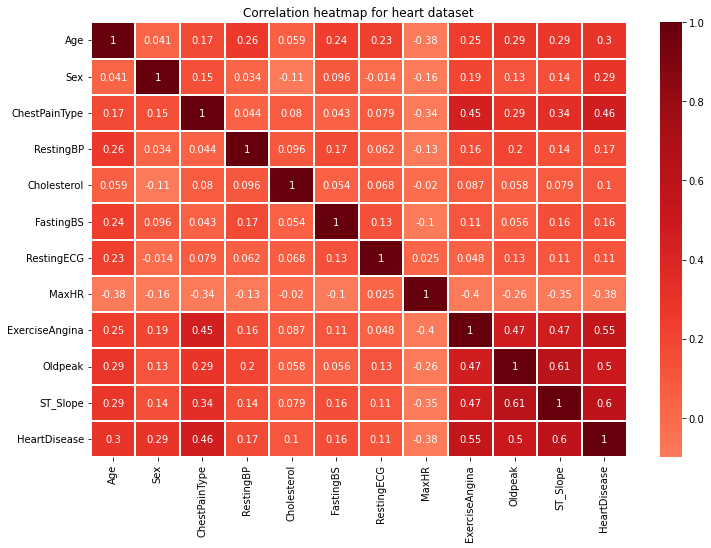

In [61]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(x, y)

In [62]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(559, 15) (187, 15) (559,) (187,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
675  0.414436    1   0.987086    -2.024847          1  1.344469   
900  0.519645    1  -1.106298     1.234001          0 -0.017274   
768  1.150897    0  -0.175905     0.979403          0 -0.760042   
225 -0.322025    1   0.696338     0.317450          0  0.395376   
99  -1.268904    1  -0.466653     0.402316          0  0.147786   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
675               0 -0.657207                0                1   
900               0  3.163969                0                0   
768               0  0.980440                0                0   
225               0 -0.839168                0                0   
99                0 -0.839168                1                0   

     ChestPainType_3  RestingECG_1  RestingECG_2  ST_Slope_1  ST_Slope_2  
675                0             0             0           0           0  
900       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
738,1.337005,0,1.542746,1.966977,0,0.448515,0,-0.040198,0,1,0,0,1,0,0
109,-1.410467,1,3.257927,-0.027788,0,-1.330115,0,-0.852839,1,0,0,0,0,0,0
612,0.280285,1,-0.629817,-0.329518,1,-1.567265,0,-0.852839,0,0,1,1,0,1,0
19,-1.727483,1,-0.744162,0.408043,0,0.804241,0,2.194567,1,0,0,0,0,1,0
823,1.231333,1,-0.458299,1.112077,0,-0.341987,1,0.975605,0,1,0,0,0,1,0


In [63]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.780749,0.219251
1,2,0.780749,0.219251
2,3,0.828877,0.171123
3,4,0.860963,0.139037
4,5,0.882353,0.117647
5,6,0.877005,0.122995
6,7,0.898396,0.101604
7,8,0.877005,0.122995
8,9,0.877005,0.122995


KNN - StandardScaler

   Confusion Matrix - Validation Data


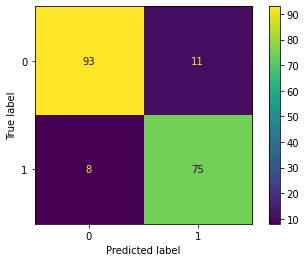

Training Accuracy: 0.85
Validation Accuracy: 0.90
Validation ROC_AUC Score: 0.90
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 19

Cross Validation - 7 Fold: 0.66


In [64]:
knn1 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Validation ROC_AUC Score: %.2f' % round(knn1_roc_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [65]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(559, 15) (187, 15) (559,) (187,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
675  0.591837    1   0.537037     0.056034          1  0.845528   
900  0.612245    1   0.203704     0.469828          0  0.577236   
768  0.734694    0   0.351852     0.437500          0  0.430894   
225  0.448980    1   0.490741     0.353448          0  0.658537   
99   0.265306    1   0.305556     0.364224          0  0.609756   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
675               0  0.047619                0                1   
900               0  0.714286                0                0   
768               0  0.333333                0                0   
225               0  0.015873                0                0   
99                0  0.015873                1                0   

     ChestPainType_3  ST_Slope_1  ST_Slope_2  RestingECG_1  RestingECG_2  
675                0           0           0             0             0  
900       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
738,0.750000,0,0.607843,0.530888,0,0.581967,0,0.20,0,1,0,0,0,0,1
109,0.208333,1,0.901961,0.301158,0,0.213115,0,0.00,1,0,0,0,0,0,0
612,0.541667,1,0.235294,0.266409,1,0.163934,0,0.00,0,0,1,1,0,1,0
19,0.145833,1,0.215686,0.351351,0,0.655738,0,0.75,1,0,0,1,0,0,0
823,0.729167,1,0.264706,0.432432,0,0.418033,1,0.45,0,1,0,1,0,0,0


In [66]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.860963,0.139037
1,2,0.855615,0.144385
2,3,0.855615,0.144385
3,4,0.866310,0.133690
4,5,0.871658,0.128342
5,6,0.887701,0.112299
6,7,0.903743,0.096257
7,8,0.903743,0.096257
8,9,0.893048,0.106952


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


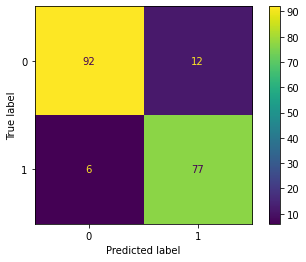

Training Accuracy: 0.86
Validation Accuracy: 0.90
Validation ROC_AUC Score: 0.66
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 18

Cross Validation - 7 Fold: 0.66


In [67]:
knn2 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Validation ROC_AUC Score: %.2f' % round(knn2_cross_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

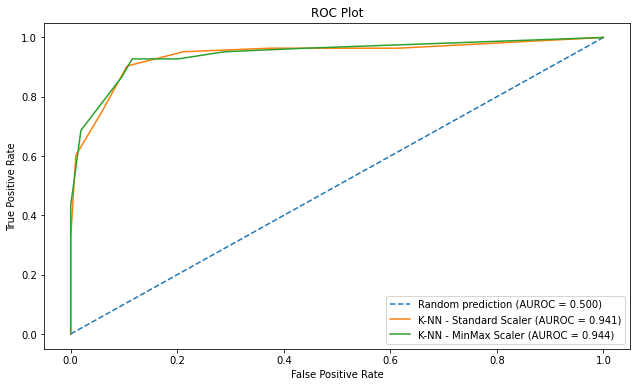

In [68]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN - Standard Scaler (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN - MinMax Scaler (AUROC = %0.3f)' % knn2_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn1_result_ss,2)
bestknn_auc1 = knn1_auc
bestknn_cross1 = round(knn1_cross_ss,2)
bestknn_sen1 = knn1_sensetivity



RandomForest

   Confusion Matrix - ValidationData


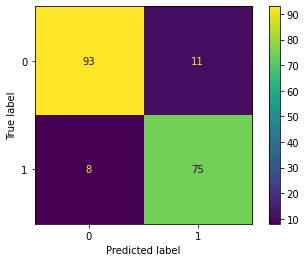

Training Accuracy: 1.00
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 19

Cross Validation - 7 Fold: 0.87


In [69]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

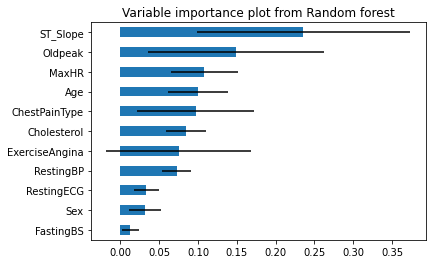

In [70]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest

   Confusion Matrix - ValidationData


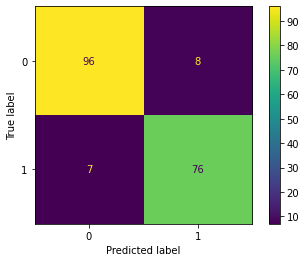

Training Accuracy: 1.00
Validation Accuracy: 0.92
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 15

Cross Validation - 7 Fold: 0.87


In [71]:
#Random Forest

x = df.drop(['HeartDisease', 'FastingBS'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
rf_auc_best2 = roc_auc_score(validTarget, predictedp)
rf_false_best2, rf_true_best2, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


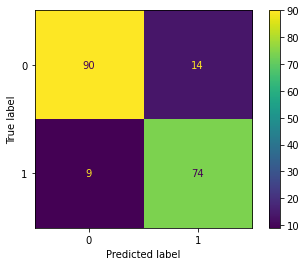

Training Accuracy: 1.00
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 23

Cross Validation - 7 Fold: 0.87


In [72]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest

   Confusion Matrix - ValidationData


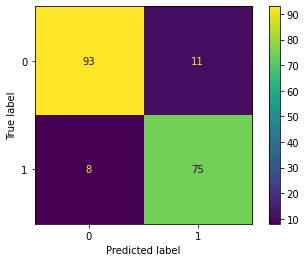

Training Accuracy: 1.00
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 19

Cross Validation - 7 Fold: 0.88


In [73]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'FastingBS'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



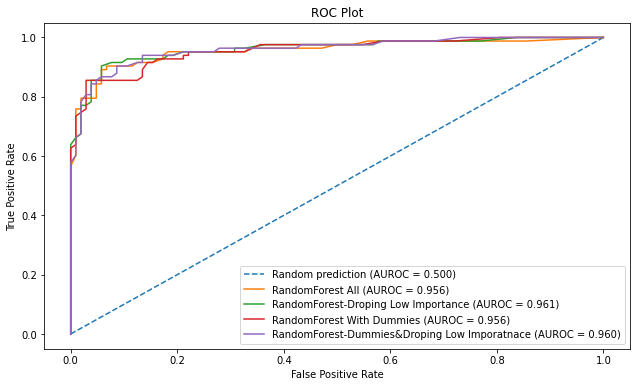

<Figure size 864x720 with 0 Axes>

In [74]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rf_results,2)
best_rf_auc1 = round(rf_auc,2)
best_rf_sen1 = rf_sen
best_rf_cross1 = round(rf_cross,2)


In [75]:
#Fine: tune.

## cutoff = 0.5
predicted = [ 1 if p > 0.54 else 0 for p in predictedp]
classificationSummary(validTarget, predicted, class_names=['0', '1'])

Confusion Matrix (Accuracy 0.9091)

       Prediction
Actual  0  1
     0 95  9
     1  8 75


Decision Tree - Gini

   Confusion Matrix - ValidationData


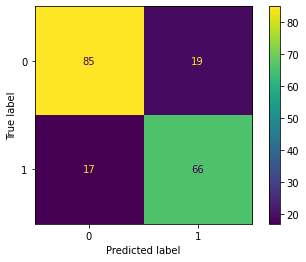

Training Accuracy: 0.97
Validation Accuracy: 0.81
Sensetivity(Class:1): 0.78
Validation Misclassified samples: 36

Cross Validation - 7 Fold: 0.81


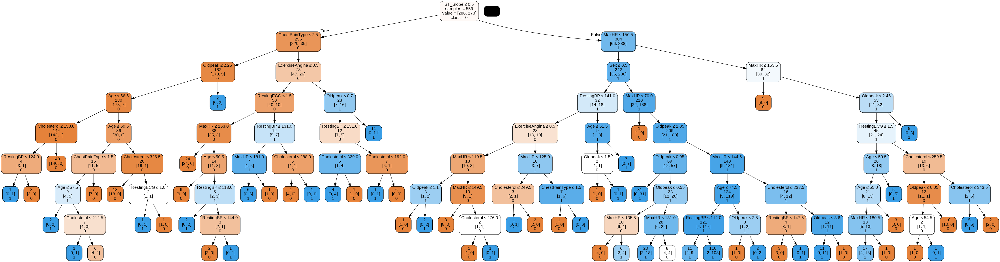

In [76]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


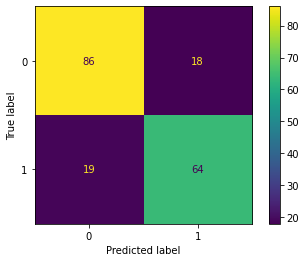

Training Accuracy: 0.97
Validation Accuracy: 0.80
Sensetivity(Class:1): 0.78
Validation Misclassified samples: 37

Cross Validation - 7 Fold: 0.79


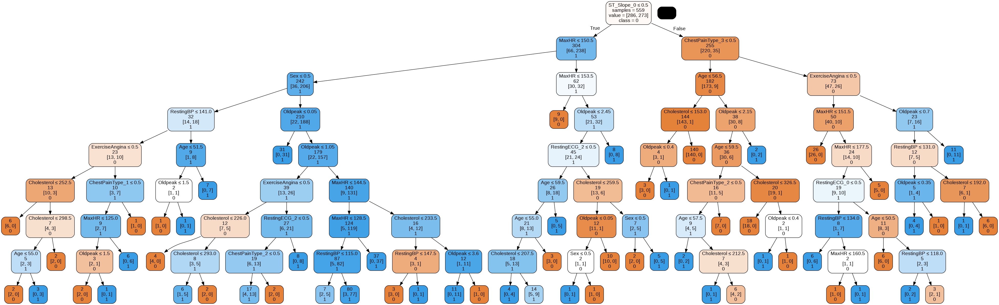

In [77]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

       alpha  mean accuracy
0   0.000000       0.781459
1   0.001181       0.784143
2   0.001590       0.797575
3   0.001610       0.797593
4   0.001610       0.797593
5   0.001610       0.797593
6   0.001640       0.802962
7   0.001699       0.804295
8   0.001734       0.804295
9   0.001776       0.805638
10  0.001988       0.806980
11  0.002147       0.812331
12  0.002385       0.808304
13  0.002385       0.808304
14  0.002385       0.808304
15  0.002564       0.804268
16  0.002584       0.804268
17  0.002651       0.802926
18  0.002683       0.801584
19  0.002796       0.804260
20  0.002862       0.804260
21  0.002862       0.804260
22  0.003056       0.790837
23  0.003067       0.790837
24  0.003067       0.790837
25  0.003271       0.798890
26  0.003280       0.798890
27  0.003448       0.798890
28  0.003500       0.798890
29  0.003911       0.798899
30  0.004453       0.809611
31  0.004506       0.805584
32  0.004506       0.805584
33  0.004773       0.793512
34  0.005111       0

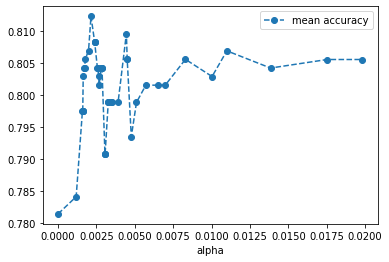

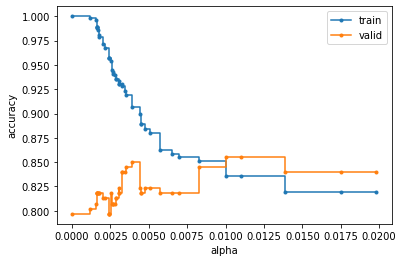

In [78]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])
print(results)
#The best value is 0.021429
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


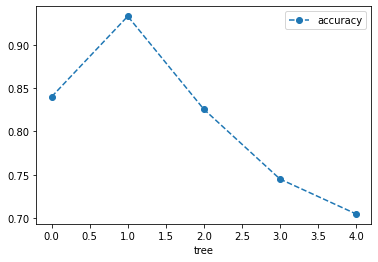

In [79]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =   0.004453)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


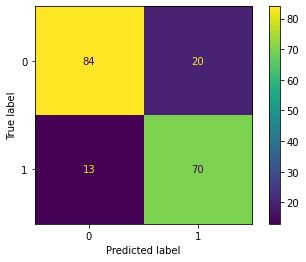

Training Accuracy: 0.90
Validation Accuracy: 0.82
Sensetivity(Class:1): 0.78
Validation Misclassified samples: 33

Cross Validation - 7 Fold: 0.82


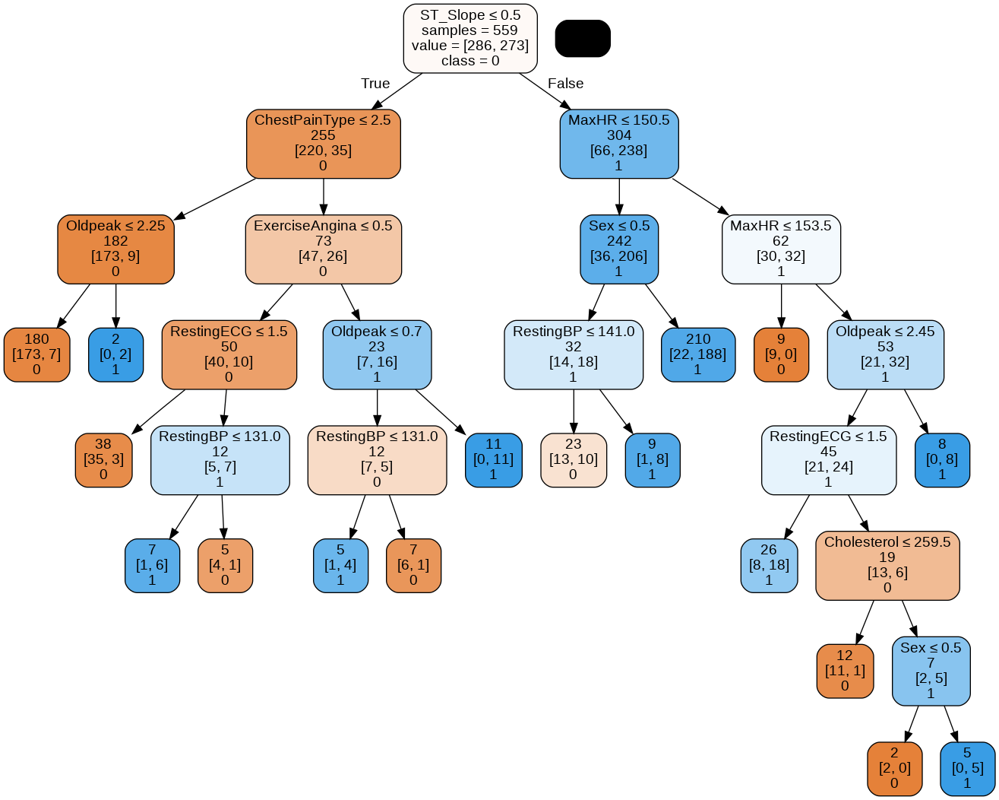

In [80]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



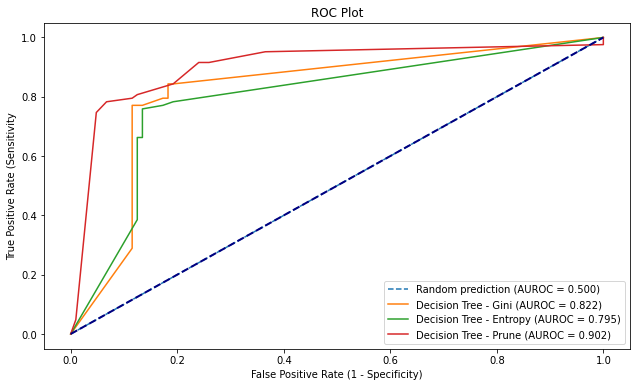

In [81]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

In [82]:
#Fine: tune.

## cutoff = 0.5
predicted = [ 1 if p > 0.38 else 0 for p in predictedp]
classificationSummary(validTarget, predicted, class_names=['0', '1'])
print(classification_report(validTarget, predicted))

Confusion Matrix (Accuracy 0.8289)

       Prediction
Actual  0  1
     0 79 25
     1  7 76
              precision    recall  f1-score   support

           0       0.92      0.76      0.83       104
           1       0.75      0.92      0.83        83

    accuracy                           0.83       187
   macro avg       0.84      0.84      0.83       187
weighted avg       0.84      0.83      0.83       187



GaussianNB

   Confusion Matrix - ValidationData


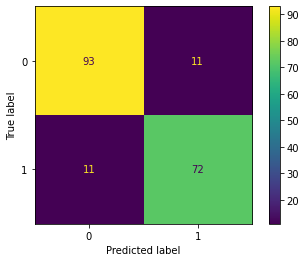

Training Accuracy: 0.84
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 22

Cross Validation - 7 Fold: 0.84


In [83]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [84]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['Cholesterol'] = pd.qcut(df['Cholesterol'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


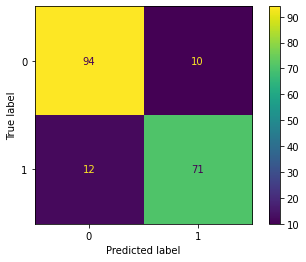

Training Accuracy: 0.83
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.88
Validation Misclassified samples: 22

Cross Validation - 7 Fold: 0.84


In [85]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','Cholesterol','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'Cholesterol': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
#x = pd.get_dummies(x, columns = predictors) #better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

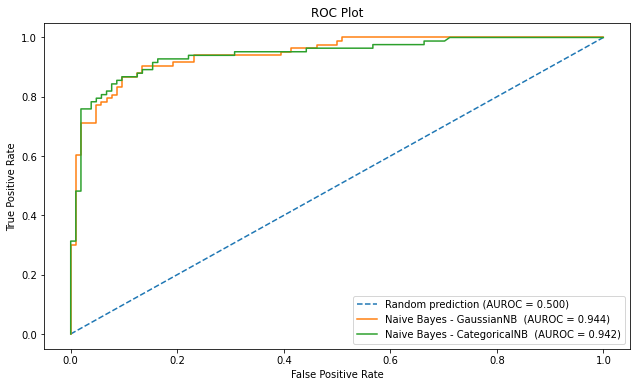

In [86]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0,1])
#plt.ylim([0,1.05])
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(naive_results,2)
best_nv_auc1 = round(gnb_auc,2)
best_nv_sen1 = naive_sen
best_nv_cross1 = round(naive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


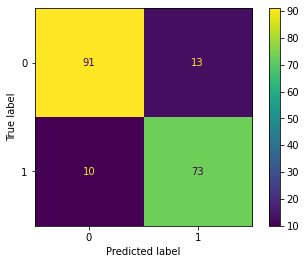

Training Accuracy: 0.84
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.85
Validation Misclassified samples: 23

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       104
           1       0.85      0.88      0.86        83

    accuracy                           0.88       187
   macro avg       0.87      0.88      0.88       187
weighted avg       0.88      0.88      0.88       187

Cross Validation - 7 Fold: 0.85


In [87]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

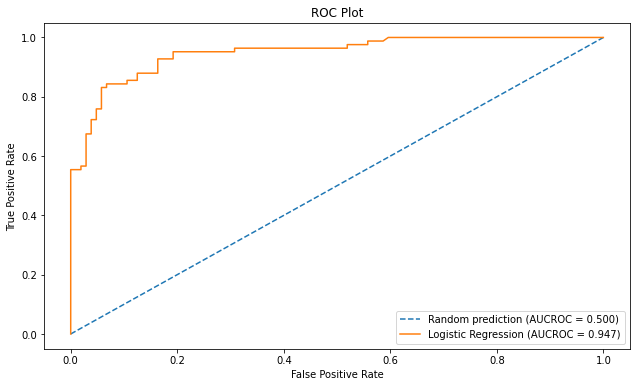

In [88]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [89]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.90,0.94,0.87,0.66
1,Best RandomForest,0.92,0.96,0.90,0.87
2,Best Decision Tree,0.82,0.90,0.78,0.82
3,Best Naive Bayes,0.88,0.94,0.87,0.84
4,Best Logistic Regression,0.88,0.95,0.85,0.85


# Scenario 3 - Deleting Cholesterol Column

In [90]:
#Droping the cholesterol coloumn and removing the zero value in RestingBP - Case #
df = pd.read_csv("heart.csv") 
df.drop(df.index[df['RestingBP'] == 0], inplace=True)
df.drop(['Cholesterol'], axis=1, inplace =True )
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
#print('\nThe dataset shape is', df.shape)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,917.0,53.509269,9.437636,28.0,47.0,54.0,60.0,77.0
Sex,917.0,0.789531,0.407864,0.0,1.0,1.0,1.0,1.0
ChestPainType,917.0,2.251908,0.931502,0.0,2.0,3.0,3.0,3.0
RestingBP,917.0,132.540894,17.999749,80.0,120.0,130.0,140.0,200.0
FastingBS,917.0,0.233370,0.423206,0.0,0.0,0.0,0.0,1.0
RestingECG,917.0,0.604144,0.806161,0.0,0.0,0.0,1.0,2.0
MaxHR,917.0,136.789531,25.467129,60.0,120.0,138.0,156.0,202.0
ExerciseAngina,917.0,0.404580,0.491078,0.0,0.0,0.0,1.0,1.0
Oldpeak,917.0,0.886696,1.066960,-2.6,0.0,0.6,1.5,6.2
ST_Slope,917.0,0.637950,0.607270,0.0,0.0,1.0,1.0,2.0


RandomForestClassifier(n_estimators=88, random_state=50)

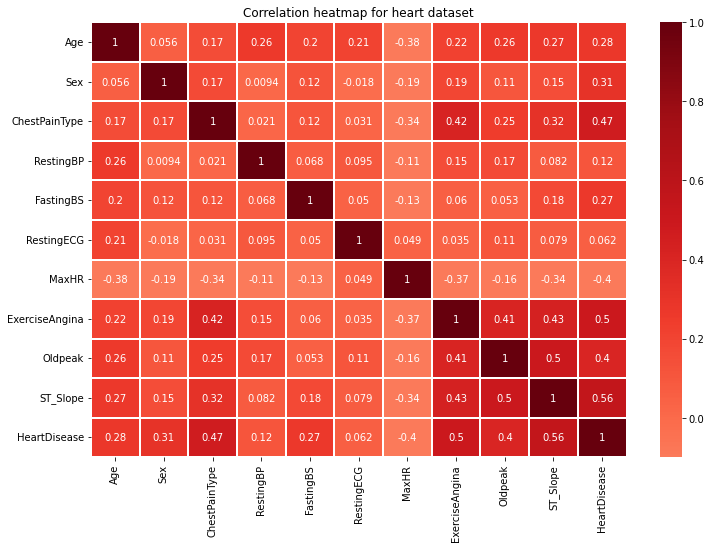

In [91]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 50)
rfa.fit(trainData, trainTarget)

In [92]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 14) (230, 14) (687,) (230,)
          Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853 -0.668303    1   0.323177          0  0.748105               0 -0.850788   
110  0.600872    0  -0.121981          0 -0.497830               0  0.071123   
137 -1.514420    1  -0.678429          0  0.358750               0  0.993034   
325 -1.197126    1  -1.513101          1 -0.342088               1 -2.233655   
891  1.341225    0   0.768336          0  0.592363               0 -0.850788   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  RestingECG_1  \
853                0                1                0             0   
110                1                0                0             0   
137                1                0                0             1   
325                0                0                1             0   
891                0                1                0             0   

     RestingECG_2  ST_Slope_1  ST_Slope_2  
853     

,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
428,0.847974,1,-1.309724,0,-0.678717,1,-0.278161,0,0,1,0,0,1,0
424,0.633886,1,-0.754347,1,0.169679,1,1.218960,0,1,0,0,0,0,0
765,-1.399949,1,-1.198648,0,1.704872,0,-0.777201,0,1,0,0,0,0,0
173,-0.543597,1,0.356407,0,1.422074,0,-0.777201,0,1,0,0,0,0,0
391,1.704326,1,-1.032035,0,-1.809912,1,-0.777201,0,0,1,1,0,1,0


In [93]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.800000,0.200000
1,2,0.747826,0.252174
2,3,0.830435,0.169565
3,4,0.839130,0.160870
4,5,0.847826,0.152174
5,6,0.821739,0.178261
6,7,0.860870,0.139130
7,8,0.852174,0.147826
8,9,0.869565,0.130435


KNN - StandardScaler

   Confusion Matrix - Validation Data


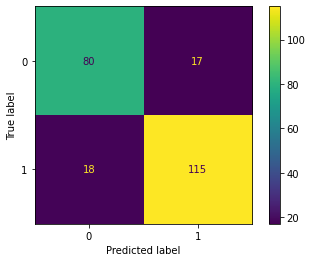

Training Accuracy: 0.87
Validation Accuracy: 0.85
Validation ROC_AUC Score: 0.84
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 35

Cross Validation - 7 Fold: 0.68


In [94]:
knn1 = KNeighborsClassifier(n_neighbors=5).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Validation ROC_AUC Score: %.2f' % round(knn1_roc_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [95]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 14) (230, 14) (687,) (230,)
          Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853  0.395833    1   0.483333          0  0.676056               0  0.317073   
110  0.645833    0   0.416667          0  0.450704               0  0.439024   
137  0.229167    1   0.333333          0  0.605634               0  0.560976   
325  0.291667    1   0.208333          1  0.478873               1  0.134146   
891  0.791667    0   0.550000          0  0.647887               0  0.317073   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  \
853                0                1                0           0   
110                1                0                0           1   
137                1                0                0           0   
325                0                0                1           0   
891                0                1                0           1   

     ST_Slope_2  RestingECG_1  RestingECG_2  
853           0   

,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
428,0.687500,1,0.18,0,0.431818,1,0.197183,0,0,1,1,0,0,0
424,0.645833,1,0.28,1,0.590909,1,0.408451,0,1,0,0,0,0,0
765,0.250000,1,0.20,0,0.878788,0,0.126761,0,1,0,0,0,0,0
173,0.416667,1,0.48,0,0.825758,0,0.126761,0,1,0,0,0,0,0
391,0.854167,1,0.23,0,0.219697,1,0.126761,0,0,1,1,0,1,0


In [96]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.804348,0.195652
1,2,0.756522,0.243478
2,3,0.869565,0.130435
3,4,0.839130,0.160870
4,5,0.860870,0.139130
5,6,0.843478,0.156522
6,7,0.878261,0.121739
7,8,0.865217,0.134783
8,9,0.869565,0.130435


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


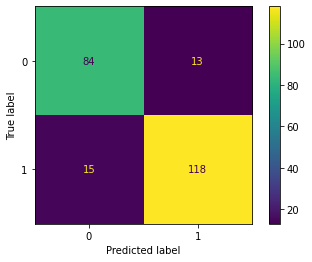

Training Accuracy: 0.87
Validation Accuracy: 0.88
Validation ROC_AUC Score: 0.68
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.68


In [97]:
knn2 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
knn2_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Validation ROC_AUC Score: %.2f' % round(knn2_cross_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

In [98]:
#with droping less (below 0.1) corrolated value 
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()

(687, 12) (230, 12) (687,) (230,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853   47    1   0.323177          0  0.748105               0 -0.850788   
110   59    0  -0.121981          0 -0.497830               0  0.071123   
137   39    1  -0.678429          0  0.358750               0  0.993034   
325   42    1  -1.513101          1 -0.342088               1 -2.233655   
891   66    0   0.768336          0  0.592363               0 -0.850788   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  ST_Slope_2  
853                0                1                0           0           0  
110                1                0                0           1           0  
137                1                0                0           0           0  
325                0                0                1           0           1  
891                0                1                0           1           0  


,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
428,62,1,-1.309724,0,-0.678717,1,-0.278161,0,0,1,1,0
424,60,1,-0.754347,1,0.169679,1,1.218960,0,1,0,0,0
765,41,1,-1.198648,0,1.704872,0,-0.777201,0,1,0,0,0
173,49,1,0.356407,0,1.422074,0,-0.777201,0,1,0,0,0
391,70,1,-1.032035,0,-1.809912,1,-0.777201,0,0,1,1,0


In [99]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.769565,0.230435
1,2,0.743478,0.256522
2,3,0.826087,0.173913
3,4,0.800000,0.200000
4,5,0.830435,0.169565
5,6,0.813043,0.186957
6,7,0.826087,0.173913
7,8,0.804348,0.195652
8,9,0.830435,0.169565


KNN - StandardScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


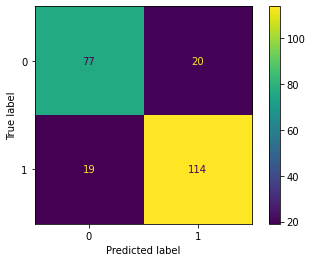

Training Accuracy: 0.84
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.85
Validation Misclassified samples: 39

Cross Validation - 7 Fold: 0.69


In [100]:
knn3 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)

#Model Performance

predicted = knn3.predict(validData)
misclassified = (validTarget != predicted).sum()
knn3_result_ssc = accuracy_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn3_cross_ssc = np.mean(cross_val_score(knn3, x,y, cv=7))
predictedp = knn3.predict_proba(validData)
predictedp = predictedp[:, 1]
knn3_auc = roc_auc_score(validTarget, predictedp)
knn3_false, knn3_true, _ = roc_curve(validTarget, predictedp)
print('KNN - StandardScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn3, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn3.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn3_result_ssc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn3_cross_ssc,2))

In [101]:
#with droping less (below 0.1) corrolated value and different scalling method
predictors = ['ChestPainType','ST_Slope' ]
x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = MinMaxScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 12) (230, 12) (687,) (230,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853   47    1   0.483333          0  0.676056               0  0.317073   
110   59    0   0.416667          0  0.450704               0  0.439024   
137   39    1   0.333333          0  0.605634               0  0.560976   
325   42    1   0.208333          1  0.478873               1  0.134146   
891   66    0   0.550000          0  0.647887               0  0.317073   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  ST_Slope_2  
853                0                1                0           0           0  
110                1                0                0           1           0  
137                1                0                0           0           0  
325                0                0                1           0           1  
891                0                1                0           1           0  


,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
428,62,1,0.18,0,0.431818,1,0.197183,0,0,1,1,0
424,60,1,0.28,1,0.590909,1,0.408451,0,1,0,0,0
765,41,1,0.20,0,0.878788,0,0.126761,0,1,0,0,0
173,49,1,0.48,0,0.825758,0,0.126761,0,1,0,0,0
391,70,1,0.23,0,0.219697,1,0.126761,0,0,1,1,0


In [102]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.826087,0.173913
1,2,0.743478,0.256522
2,3,0.791304,0.208696
3,4,0.765217,0.234783
4,5,0.804348,0.195652
5,6,0.795652,0.204348
6,7,0.786957,0.213043
7,8,0.795652,0.204348
8,9,0.826087,0.173913


KNN - MinMaxScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


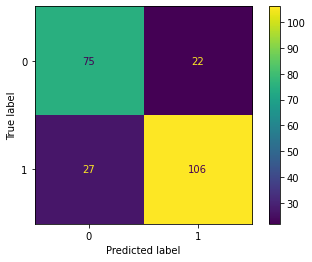

Training Accuracy: 0.87
Validation Accuracy: 0.79
Sensetivity(Class:1): 0.83
Validation Misclassified samples: 49

Cross Validation - 7 Fold: 0.69


In [103]:
knn4 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)
predicted = knn4.predict(validData)

#Model Performance

predicted = knn4.predict(validData)
misclassified = (validTarget != predicted).sum()
knn4_result_mmc = accuracy_score(validTarget, predicted)
knn4_roc_mmc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn4_cross_mmc = np.mean(cross_val_score(knn4, x,y, cv=7))
predictedp = knn4.predict_proba(validData)
predictedp = predictedp[:, 1]
knn4_auc = roc_auc_score(validTarget, predictedp)
knn4_false, knn4_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn4, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn4.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn4_result_mmc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn4_cross_mmc,2))

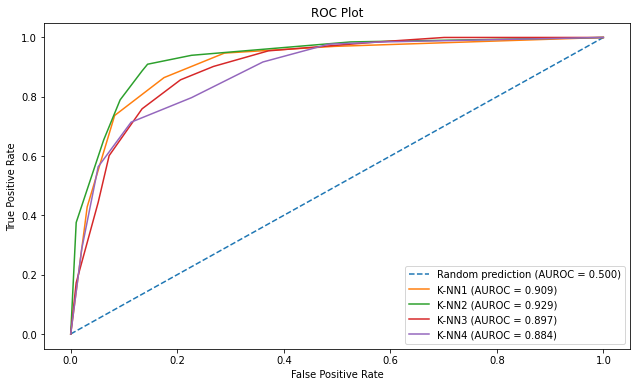

In [104]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN1 (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN2 (AUROC = %0.3f)' % knn2_auc)
plt.plot(knn3_false, knn3_true, label='K-NN3 (AUROC = %0.3f)' % knn3_auc)
plt.plot(knn4_false, knn4_true, label='K-NN4 (AUROC = %0.3f)' % knn4_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn2_result_mm,2)
bestknn_auc1 = knn2_auc
bestknn_cross1 = round(knn2_cross_mm,2)
bestknn_sen1 = knn2_sensetivity



RandomForest

   Confusion Matrix - ValidationData


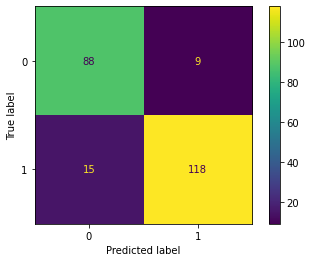

Training Accuracy: 1.00
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.85


In [105]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
rfa_auc_best3 = roc_auc_score(validTarget, predictedp)
rfa_false_best3, rfa_true_best3, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

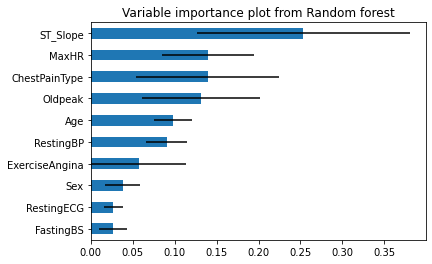

In [106]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest

   Confusion Matrix - ValidationData


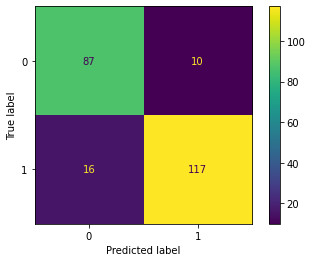

Training Accuracy: 1.00
Validation Accuracy: 0.89
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 26

Cross Validation - 7 Fold: 0.85


In [107]:
#Random Forest

x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


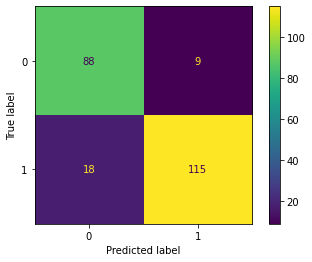

Training Accuracy: 1.00
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 27

Cross Validation - 7 Fold: 0.85


In [108]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest

   Confusion Matrix - ValidationData


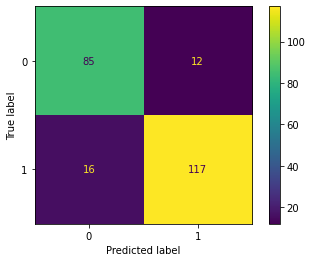

Training Accuracy: 1.00
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.91
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.85


In [109]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



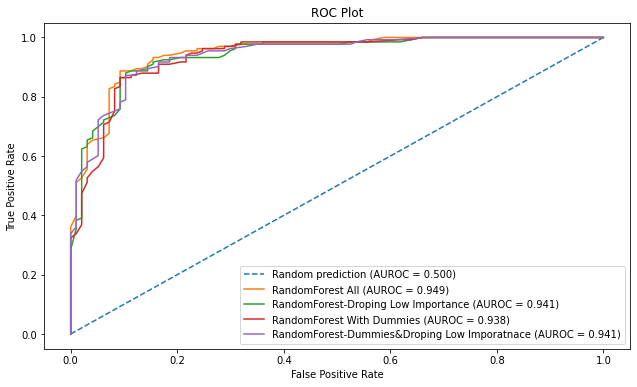

<Figure size 864x720 with 0 Axes>

In [110]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rfa_results,2)
best_rf_auc1 = round(rfa_auc,2)
best_rf_sen1 = rfa_sen
best_rf_cross1 = round(rfa_cross,2)


Decision Tree - Gini

   Confusion Matrix - ValidationData


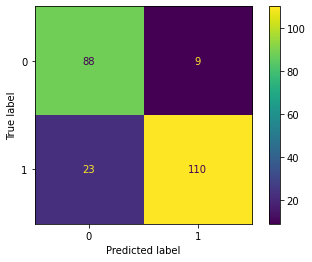

Training Accuracy: 0.96
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 32

Cross Validation - 7 Fold: 0.81


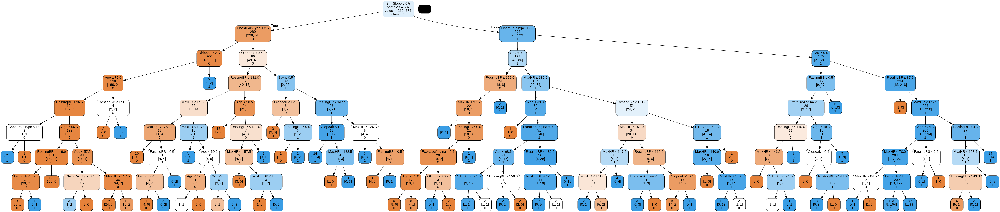

In [111]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


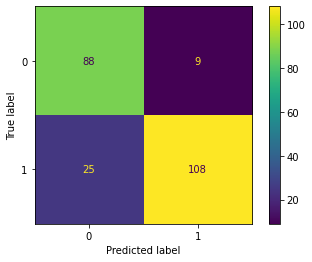

Training Accuracy: 0.95
Validation Accuracy: 0.85
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 34

Cross Validation - 7 Fold: 0.80


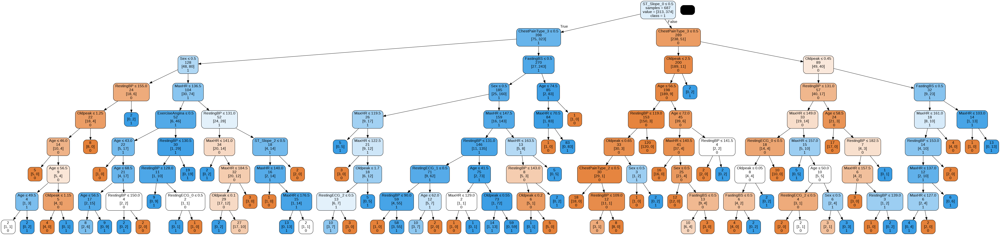

In [112]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

       alpha  mean accuracy
0   0.000000       0.775297
1   0.000913       0.777483
2   0.000938       0.777483
3   0.000938       0.777483
4   0.000959       0.777483
5   0.000970       0.777483
6   0.001092       0.781837
7   0.001250       0.782894
8   0.001284       0.785080
9   0.001294       0.786167
10  0.001323       0.788364
11  0.001359       0.790550
12  0.001375       0.789463
13  0.001418       0.789463
14  0.001423       0.789463
15  0.001456       0.789463
16  0.001456       0.789463
17  0.001664       0.793835
18  0.001698       0.793835
19  0.001698       0.793835
20  0.001726       0.801449
21  0.001941       0.803641
22  0.001971       0.804734
23  0.002098       0.801461
24  0.002144       0.799275
25  0.002183       0.798177
26  0.002183       0.798177
27  0.002183       0.798177
28  0.002218       0.799269
29  0.002275       0.798177
30  0.002310       0.797084
31  0.002323       0.797084
32  0.002377       0.793811
33  0.002426       0.795985
34  0.002426       0

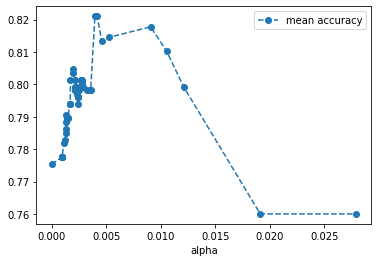

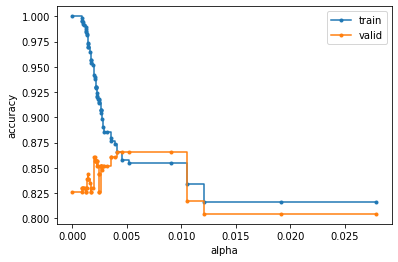

In [113]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])
print(results)
#The best value is 0.021429
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


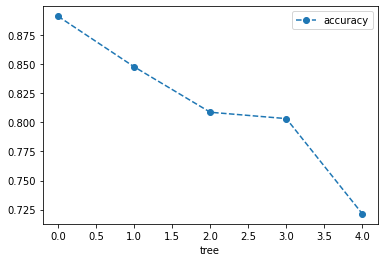

In [114]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =  0.005261)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


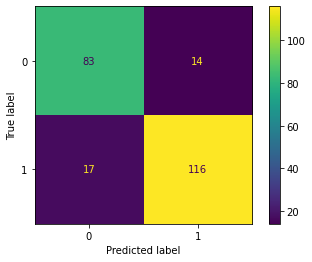

Training Accuracy: 0.85
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.82


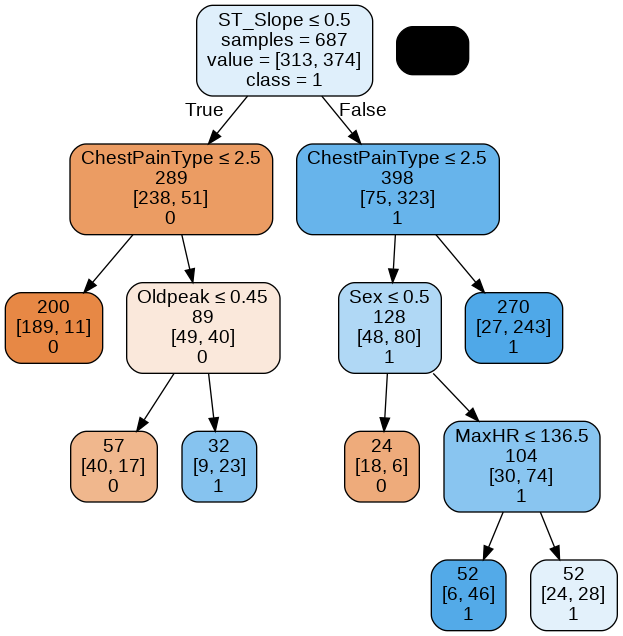

In [115]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



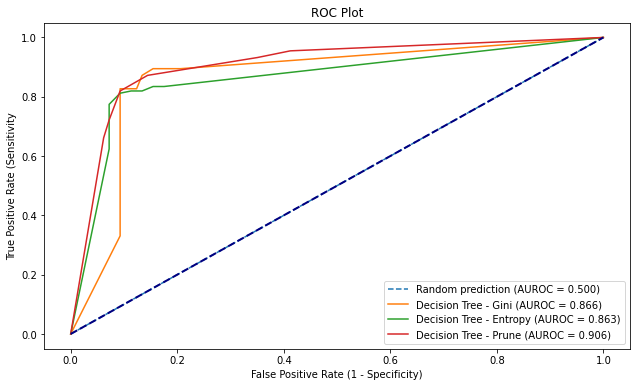

In [116]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

GaussianNB

   Confusion Matrix - ValidationData


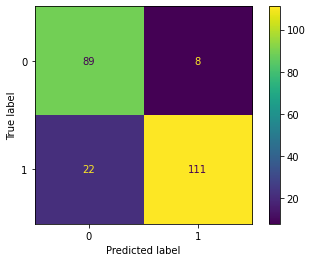

Training Accuracy: 0.84
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 30

Cross Validation - 7 Fold: 0.83


In [117]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
naive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [118]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


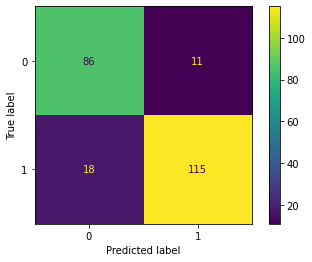

Training Accuracy: 0.84
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.91
Validation Misclassified samples: 29

Cross Validation - 7 Fold: 0.84


In [119]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors)#better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

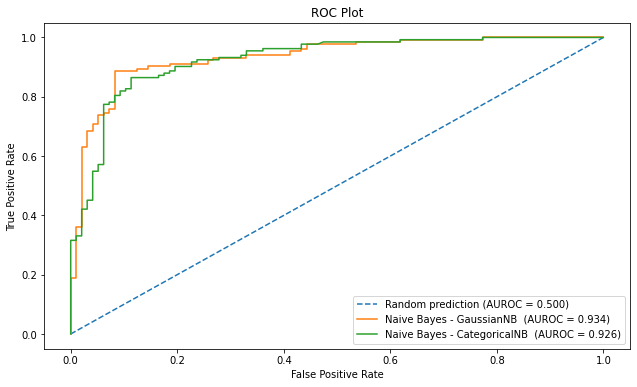

In [120]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim[(0,1)]
#plt.ylim[(0,1.05)]
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(clsnaive_results,2)
best_nv_auc1 = round(cls_auc,2)
best_nv_sen1 = clsnaive_sen
best_nv_cross1 = round(clsnaive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


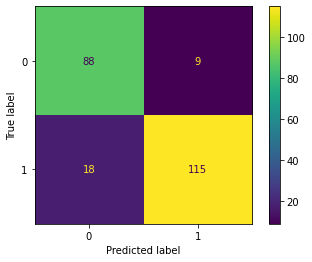

Training Accuracy: 0.87
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 27

              precision    recall  f1-score   support

           0       0.83      0.91      0.87        97
           1       0.93      0.86      0.89       133

    accuracy                           0.88       230
   macro avg       0.88      0.89      0.88       230
weighted avg       0.89      0.88      0.88       230

Cross Validation - 7 Fold: 0.85


In [121]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

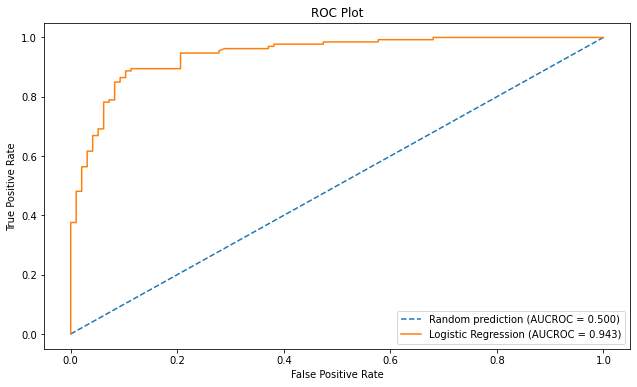

In [122]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [123]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.88,0.93,0.90,0.68
1,Best RandomForest,0.90,0.95,0.93,0.85
2,Best Decision Tree,0.87,0.91,0.89,0.82
3,Best Naive Bayes,0.87,0.93,0.91,0.84
4,Best Logistic Regression,0.88,0.94,0.93,0.85


# Scenario 4 - Replacing Zero Values of Chl with mean

In [124]:
df = pd.read_csv("heart.csv") 
df.drop(df.index[df['RestingBP'] == 0], inplace=True)
df['Cholesterol'].replace(0, df['Cholesterol'].mean (axis = 0), inplace =True )
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
#print('\nThe dataset shape is', df.shape)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,917.0,53.509269,9.437636,28.0,47.000000,54.0,60.0,77.0
Sex,917.0,0.789531,0.407864,0.0,1.000000,1.0,1.0,1.0
ChestPainType,917.0,2.251908,0.931502,0.0,2.000000,3.0,3.0,3.0
RestingBP,917.0,132.540894,17.999749,80.0,120.000000,130.0,140.0,200.0
Cholesterol,917.0,236.128459,56.231401,85.0,199.016358,223.0,267.0,603.0
FastingBS,917.0,0.233370,0.423206,0.0,0.000000,0.0,0.0,1.0
RestingECG,917.0,0.604144,0.806161,0.0,0.000000,0.0,1.0,2.0
MaxHR,917.0,136.789531,25.467129,60.0,120.000000,138.0,156.0,202.0
ExerciseAngina,917.0,0.404580,0.491078,0.0,0.000000,0.0,1.0,1.0
Oldpeak,917.0,0.886696,1.066960,-2.6,0.000000,0.6,1.5,6.2


RandomForestClassifier(n_estimators=88, random_state=50)

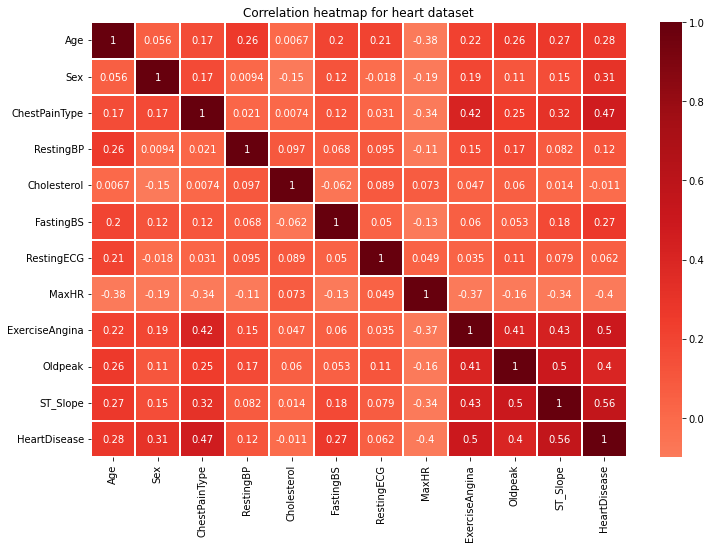

In [125]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 50)
rfa.fit(trainData, trainTarget)

In [126]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 15) (230, 15) (687,) (230,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
853 -0.668303    1   0.323177     0.377313          0  0.748105   
110  0.600872    0  -0.121981    -0.870920          0 -0.497830   
137 -1.514420    1  -0.678429     0.087868          0  0.358750   
325 -1.197126    1  -1.513101    -0.671630          1 -0.342088   
891  1.341225    0   0.768336     0.757210          0  0.592363   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
853               0 -0.850788                0                1   
110               0  0.071123                1                0   
137               0  0.993034                1                0   
325               1 -2.233655                0                0   
891               0 -0.850788                0                1   

     ChestPainType_3  RestingECG_1  RestingECG_2  ST_Slope_1  ST_Slope_2  
853                0             0             1           0           0  
110       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
428,0.847974,1,-1.309724,-0.629674,0,-0.678717,1,-0.278161,0,0,1,0,0,1,0
424,0.633886,1,-0.754347,-0.629674,1,0.169679,1,1.218960,0,1,0,0,0,0,0
765,-1.399949,1,-1.198648,0.236358,0,1.704872,0,-0.777201,0,1,0,0,0,0,0
173,-0.543597,1,0.356407,-0.833790,0,1.422074,0,-0.777201,0,1,0,0,0,0,0
391,1.704326,1,-1.032035,-0.629674,0,-1.809912,1,-0.777201,0,0,1,1,0,1,0


In [127]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.773913,0.226087
1,2,0.760870,0.239130
2,3,0.821739,0.178261
3,4,0.817391,0.182609
4,5,0.839130,0.160870
5,6,0.843478,0.156522
6,7,0.878261,0.121739
7,8,0.839130,0.160870
8,9,0.860870,0.139130


KNN - StandardScaler

   Confusion Matrix - Validation Data


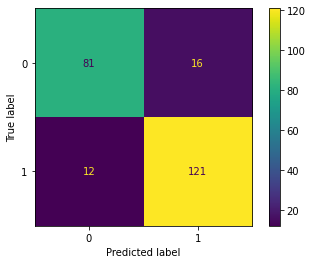

Training Accuracy: 0.87
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.88
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.65


In [128]:
knn1 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [129]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 15) (230, 15) (687,) (230,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
853  0.395833    1   0.483333     0.365967          0  0.676056   
110  0.645833    0   0.416667     0.205128          0  0.450704   
137  0.229167    1   0.333333     0.328671          0  0.605634   
325  0.291667    1   0.208333     0.230807          1  0.478873   
891  0.791667    0   0.550000     0.414918          0  0.647887   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
853               0  0.317073                0                1   
110               0  0.439024                1                0   
137               0  0.560976                1                0   
325               1  0.134146                0                0   
891               0  0.317073                0                1   

     ChestPainType_3  ST_Slope_1  ST_Slope_2  RestingECG_1  RestingECG_2  
853                0           0           0             0             1  
110       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
428,0.687500,1,0.18,0.220109,0,0.431818,1,0.197183,0,0,1,1,0,0,0
424,0.645833,1,0.28,0.220109,1,0.590909,1,0.408451,0,1,0,0,0,0,0
765,0.250000,1,0.20,0.318533,0,0.878788,0,0.126761,0,1,0,0,0,0,0
173,0.416667,1,0.48,0.196911,0,0.825758,0,0.126761,0,1,0,0,0,0,0
391,0.854167,1,0.23,0.220109,0,0.219697,1,0.126761,0,0,1,1,0,1,0


In [130]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.813043,0.186957
1,2,0.743478,0.256522
2,3,0.852174,0.147826
3,4,0.834783,0.165217
4,5,0.878261,0.121739
5,6,0.852174,0.147826
6,7,0.882609,0.117391
7,8,0.860870,0.139130
8,9,0.869565,0.130435


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


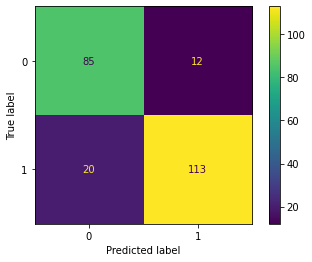

Training Accuracy: 0.87
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 32

Cross Validation - 7 Fold: 0.64


In [131]:
knn2 = KNeighborsClassifier(n_neighbors=8).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

In [132]:
#with droping less (below 0.1) corrolated value 
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'RestingECG', 'Cholesterol'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()

(687, 12) (230, 12) (687,) (230,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853   47    1   0.323177          0  0.748105               0 -0.850788   
110   59    0  -0.121981          0 -0.497830               0  0.071123   
137   39    1  -0.678429          0  0.358750               0  0.993034   
325   42    1  -1.513101          1 -0.342088               1 -2.233655   
891   66    0   0.768336          0  0.592363               0 -0.850788   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  ST_Slope_2  
853                0                1                0           0           0  
110                1                0                0           1           0  
137                1                0                0           0           0  
325                0                0                1           0           1  
891                0                1                0           1           0  


,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
428,62,1,-1.309724,0,-0.678717,1,-0.278161,0,0,1,1,0
424,60,1,-0.754347,1,0.169679,1,1.218960,0,1,0,0,0
765,41,1,-1.198648,0,1.704872,0,-0.777201,0,1,0,0,0
173,49,1,0.356407,0,1.422074,0,-0.777201,0,1,0,0,0
391,70,1,-1.032035,0,-1.809912,1,-0.777201,0,0,1,1,0


In [133]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.769565,0.230435
1,2,0.743478,0.256522
2,3,0.826087,0.173913
3,4,0.800000,0.200000
4,5,0.830435,0.169565
5,6,0.813043,0.186957
6,7,0.826087,0.173913
7,8,0.804348,0.195652
8,9,0.830435,0.169565


KNN - StandardScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


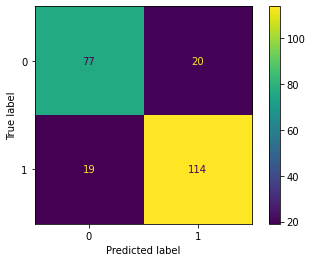

Training Accuracy: 0.84
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.85
Validation Misclassified samples: 39

Cross Validation - 7 Fold: 0.69


In [134]:
knn3 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)

#Model Performance

predicted = knn3.predict(validData)
misclassified = (validTarget != predicted).sum()
knn3_result_ssc = accuracy_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn3_cross_ssc = np.mean(cross_val_score(knn3, x,y, cv=7))
predictedp = knn3.predict_proba(validData)
predictedp = predictedp[:, 1]
knn3_auc = roc_auc_score(validTarget, predictedp)
knn3_false, knn3_true, _ = roc_curve(validTarget, predictedp)
print('KNN - StandardScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn3, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn3.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn3_result_ssc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn3_cross_ssc,2))

In [135]:
#with droping less (below 0.1) corrolated value and different scalling method
predictors = ['ChestPainType','ST_Slope', 'Cholesterol' ]
x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = MinMaxScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(687, 233) (230, 233) (687,) (230,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
853   47    1   0.483333          0  0.676056               0  0.317073   
110   59    0   0.416667          0  0.450704               0  0.439024   
137   39    1   0.333333          0  0.605634               0  0.560976   
325   42    1   0.208333          1  0.478873               1  0.134146   
891   66    0   0.550000          0  0.647887               0  0.317073   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ...  \
853                0                1                0  ...   
110                1                0                0  ...   
137                1                0                0  ...   
325                0                0                1  ...   
891                0                1                0  ...   

     Cholesterol_412.0  Cholesterol_417.0  Cholesterol_458.0  \
853                  0                  0                  0   
110   

,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,...,Cholesterol_412.0,Cholesterol_417.0,Cholesterol_458.0,Cholesterol_466.0,Cholesterol_468.0,Cholesterol_491.0,Cholesterol_518.0,Cholesterol_529.0,Cholesterol_564.0,Cholesterol_603.0
428,62,1,0.18,0,0.431818,1,0.197183,0,0,1,...,0,0,0,0,0,0,0,0,0,0
424,60,1,0.28,1,0.590909,1,0.408451,0,1,0,...,0,0,0,0,0,0,0,0,0,0
765,41,1,0.20,0,0.878788,0,0.126761,0,1,0,...,0,0,0,0,0,0,0,0,0,0
173,49,1,0.48,0,0.825758,0,0.126761,0,1,0,...,0,0,0,0,0,0,0,0,0,0
391,70,1,0.23,0,0.219697,1,0.126761,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [136]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.804348,0.195652
1,2,0.747826,0.252174
2,3,0.800000,0.200000
3,4,0.791304,0.208696
4,5,0.808696,0.191304
5,6,0.800000,0.200000
6,7,0.813043,0.186957
7,8,0.813043,0.186957
8,9,0.834783,0.165217


KNN - MinMaxScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


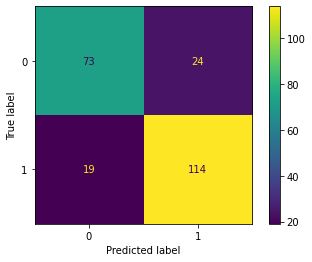

Training Accuracy: 0.87
Validation Accuracy: 0.81
Sensetivity(Class:1): 0.83
Validation Misclassified samples: 43

Cross Validation - 7 Fold: 0.69


In [137]:
knn4 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)
predicted = knn4.predict(validData)

#Model Performance

predicted = knn4.predict(validData)
misclassified = (validTarget != predicted).sum()
knn4_result_mmc = accuracy_score(validTarget, predicted)
knn4_roc_mmc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn4_cross_mmc = np.mean(cross_val_score(knn4, x,y, cv=7))
predictedp = knn4.predict_proba(validData)
predictedp = predictedp[:, 1]
knn4_auc = roc_auc_score(validTarget, predictedp)
knn4_false, knn4_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn4, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn4.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn4_result_mmc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn4_cross_mmc,2))

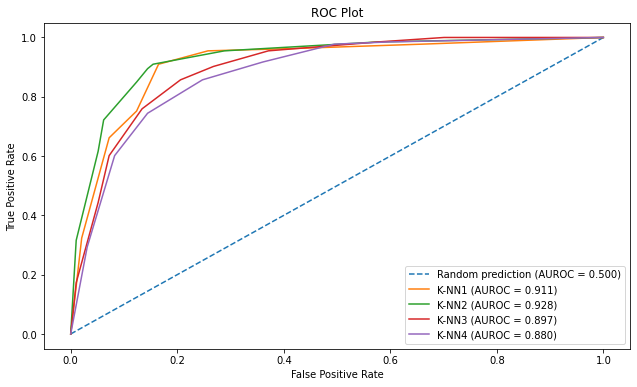

In [138]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN1 (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN2 (AUROC = %0.3f)' % knn2_auc)
plt.plot(knn3_false, knn3_true, label='K-NN3 (AUROC = %0.3f)' % knn3_auc)
plt.plot(knn4_false, knn4_true, label='K-NN4 (AUROC = %0.3f)' % knn4_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn1_result_ss,2)
bestknn_auc1 = knn1_auc
bestknn_cross1 = round(knn1_cross_ss,2)
bestknn_sen1 = knn1_sensetivity



RandomForest

   Confusion Matrix - ValidationData


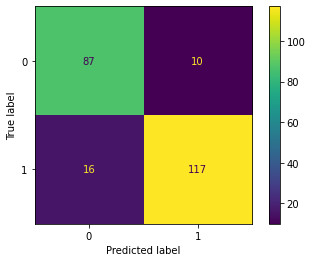

Training Accuracy: 1.00
Validation Accuracy: 0.89
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 26

Cross Validation - 7 Fold: 0.85


In [139]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

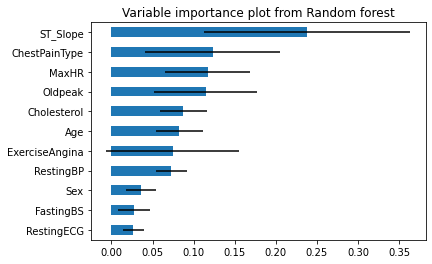

In [140]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest

   Confusion Matrix - ValidationData


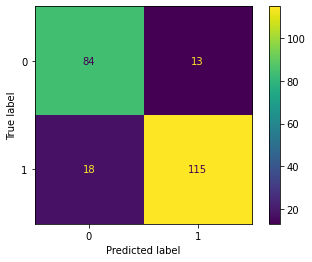

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.85


In [141]:
#Random Forest

x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


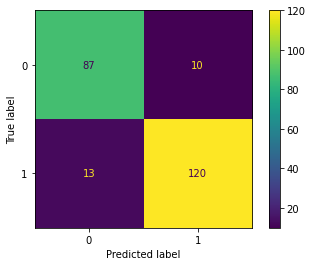

Training Accuracy: 1.00
Validation Accuracy: 0.90
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 23

Cross Validation - 7 Fold: 0.86


In [142]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
rfd_auc_best4 = roc_auc_score(validTarget, predictedp)
rfd_false_best4, rfd_true_best4, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest

   Confusion Matrix - ValidationData


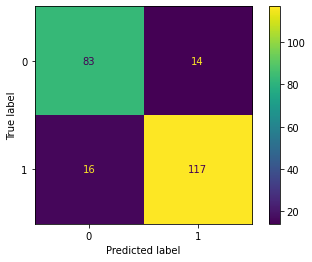

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 30

Cross Validation - 7 Fold: 0.85


In [143]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease','RestingECG', 'FastingBS'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



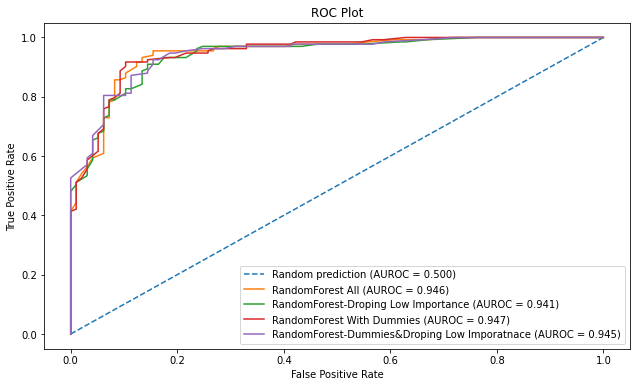

<Figure size 864x720 with 0 Axes>

In [144]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rfa_results,2)
best_rf_auc1 = round(rfa_auc,2)
best_rf_sen1 = rfa_sen
best_rf_cross1 = round(rfa_cross,2)


Decision Tree - Gini

   Confusion Matrix - ValidationData


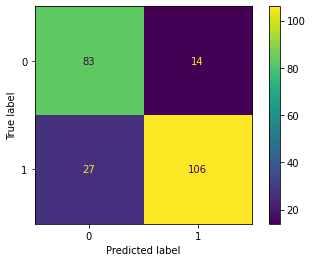

Training Accuracy: 0.97
Validation Accuracy: 0.82
Sensetivity(Class:1): 0.88
Validation Misclassified samples: 41

Cross Validation - 7 Fold: 0.79


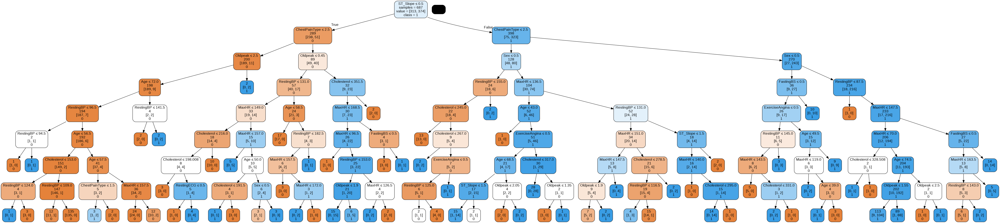

In [145]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


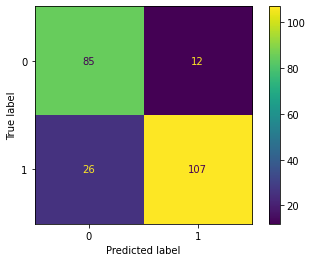

Training Accuracy: 0.96
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.90
Validation Misclassified samples: 38

Cross Validation - 7 Fold: 0.79


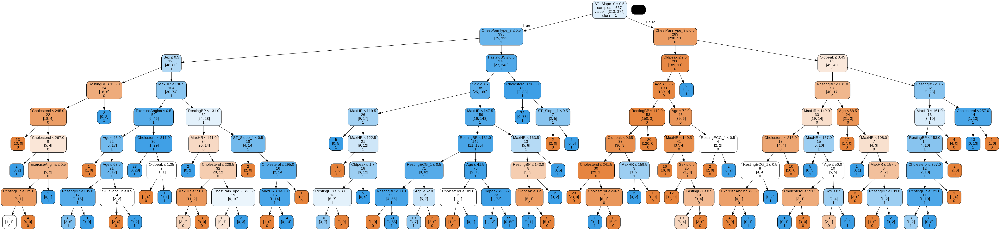

In [146]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

       alpha  mean accuracy
0   0.000000       0.755708
1   0.000959       0.756801
2   0.000964       0.756801
3   0.001213       0.756801
4   0.001284       0.760086
5   0.001294       0.762265
6   0.001323       0.761172
7   0.001386       0.764451
8   0.001407       0.764451
9   0.001411       0.764451
10  0.001423       0.764451
11  0.001456       0.765544
12  0.001456       0.765544
13  0.001664       0.774281
14  0.001726       0.779716
15  0.001733       0.779716
16  0.001941       0.786226
17  0.001941       0.786226
18  0.001971       0.786226
19  0.002183       0.787313
20  0.002183       0.787313
21  0.002183       0.787313
22  0.002183       0.787313
23  0.002218       0.788406
24  0.002310       0.787307
25  0.002310       0.787307
26  0.002323       0.787307
27  0.002329       0.787307
28  0.002360       0.789475
29  0.002426       0.797078
30  0.002426       0.797078
31  0.002488       0.800339
32  0.002507       0.798153
33  0.002547       0.798153
34  0.002609       0

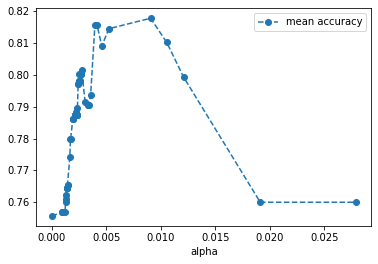

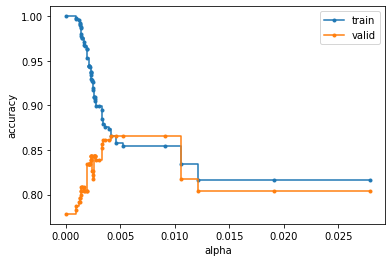

In [147]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])
print(results)
#The best value is 0.021429
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


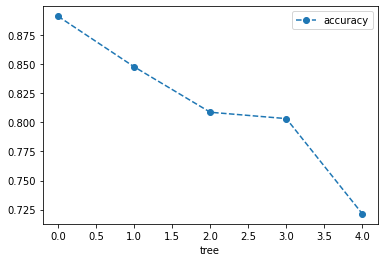

In [148]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =  0.005261)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


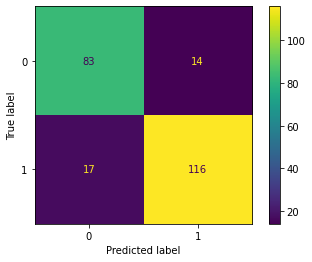

Training Accuracy: 0.85
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.89
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.81


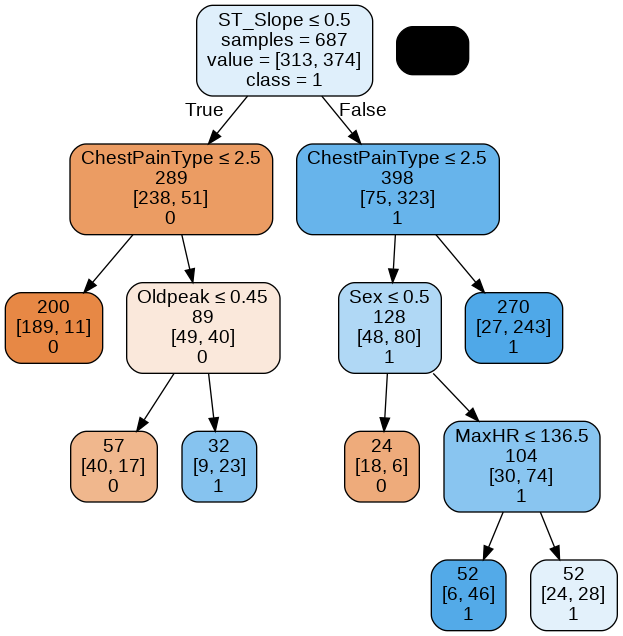

In [149]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



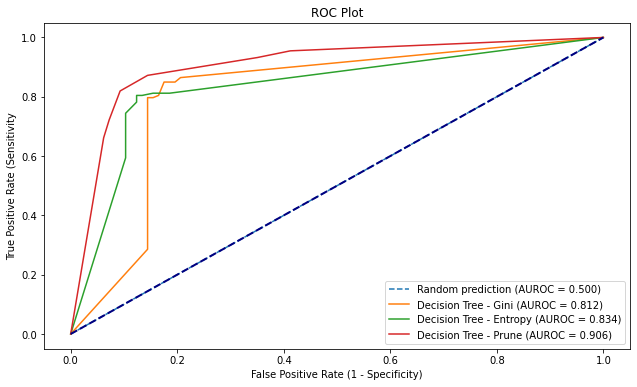

In [150]:
#ROC for best Decision Tree
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

GaussianNB

   Confusion Matrix - ValidationData


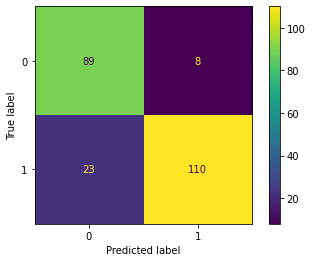

Training Accuracy: 0.84
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.83


In [151]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
naive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [152]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['Cholesterol'] = pd.qcut(df['Cholesterol'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


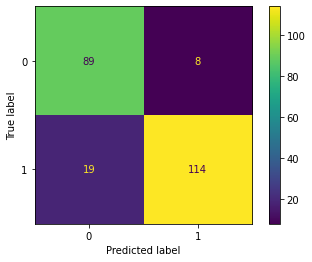

Training Accuracy: 0.84
Validation Accuracy: 0.88
Sensetivity(Class:1): 0.93
Validation Misclassified samples: 27

Cross Validation - 7 Fold: 0.84


In [153]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','Cholesterol','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'Cholesterol': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
#x = pd.get_dummies(x, columns = predictors) better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

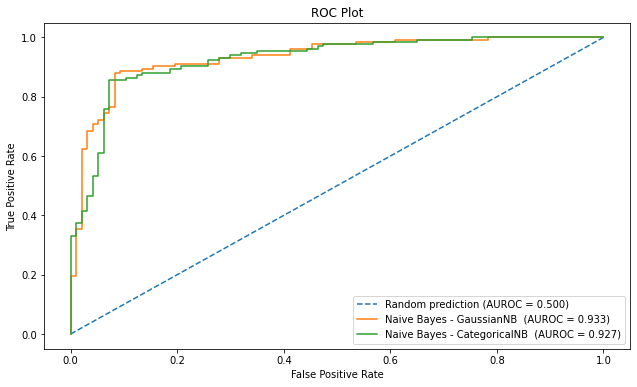

In [154]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim[(0,1)]
#plt.ylim[(0,1.05)]
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(naive_results,2)
best_nv_auc1 = round(gnb_auc,2)
best_nv_sen1 = naive_sen
best_nv_cross1 = round(naive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


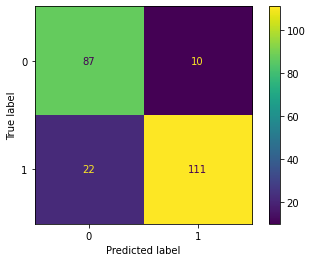

Training Accuracy: 0.84
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.92
Validation Misclassified samples: 32

              precision    recall  f1-score   support

           0       0.80      0.90      0.84        97
           1       0.92      0.83      0.87       133

    accuracy                           0.86       230
   macro avg       0.86      0.87      0.86       230
weighted avg       0.87      0.86      0.86       230

Cross Validation - 7 Fold: 0.85


In [155]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

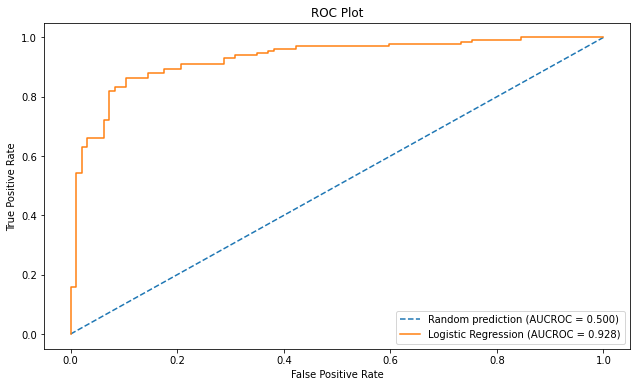

In [156]:
#ROC 
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [157]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.88,0.91,0.88,0.65
1,Best RandomForest,0.89,0.95,0.92,0.85
2,Best Decision Tree,0.87,0.91,0.89,0.81
3,Best Naive Bayes,0.87,0.93,0.93,0.83
4,Best Logistic Regression,0.86,0.93,0.92,0.85


# Scenario 5 - Removing Outliers

In [158]:
df = pd.read_csv("heart.csv") 
df.drop(df.index[df['RestingBP'] == 0], inplace=True)
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
#print('\nThe dataset shape is', df.shape)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,917.0,53.509269,9.437636,28.0,47.0,54.0,60.0,77.0
Sex,917.0,0.789531,0.407864,0.0,1.0,1.0,1.0,1.0
ChestPainType,917.0,2.251908,0.931502,0.0,2.0,3.0,3.0,3.0
RestingBP,917.0,132.540894,17.999749,80.0,120.0,130.0,140.0,200.0
Cholesterol,917.0,199.016358,109.246330,0.0,174.0,223.0,267.0,603.0
FastingBS,917.0,0.233370,0.423206,0.0,0.0,0.0,0.0,1.0
RestingECG,917.0,0.604144,0.806161,0.0,0.0,0.0,1.0,2.0
MaxHR,917.0,136.789531,25.467129,60.0,120.0,138.0,156.0,202.0
ExerciseAngina,917.0,0.404580,0.491078,0.0,0.0,0.0,1.0,1.0
Oldpeak,917.0,0.886696,1.066960,-2.6,0.0,0.6,1.5,6.2


In [159]:
#Removing Outliers and Using the outliers as test data 

cols = ['Oldpeak', 'RestingBP', 'Cholesterol', 'MaxHR'] # one or more

Q1 = df[cols].quantile(0.25)
Q3 = df[cols].quantile(0.75)
IQR = Q3 - Q1

outliersData = df[((df[cols] < (Q1 - 1.5 * IQR)) |(df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
df = df[~((df[cols] < (Q1 - 1.5 * IQR)) |(df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
outliersTarget = outliersData['HeartDisease'] #will be used for testing
outliersData = outliersData.drop(['HeartDisease'], axis = 'columns') #will be used for testing

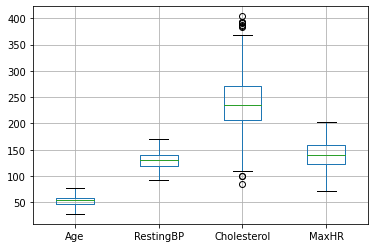

In [160]:
%matplotlib inline
boxplot = df.boxplot(column=['Age','RestingBP','Cholesterol', 'MaxHR']) 

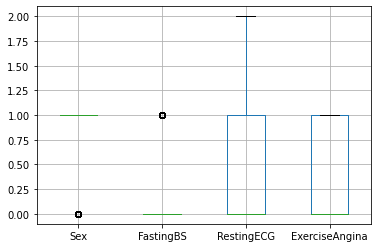

In [161]:
boxplot = df.boxplot(column=['Sex','FastingBS', 'RestingECG', 'ExerciseAngina']) 

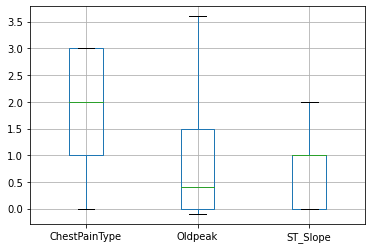

In [162]:
boxplot = df.boxplot(column=['ChestPainType','Oldpeak', 'ST_Slope']) 

RandomForestClassifier(n_estimators=88, random_state=50)

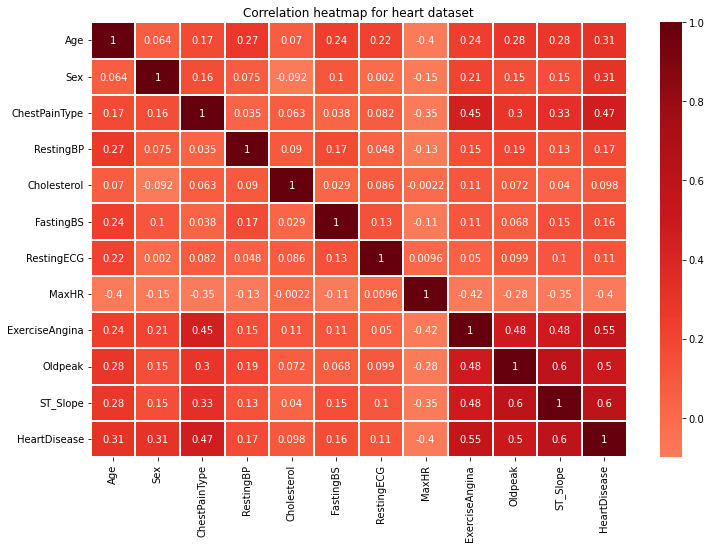

In [163]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 50)
rfa.fit(trainData, trainTarget)

In [164]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(526, 15) (176, 15) (526,) (176,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
541  2.446879    1  -1.777582    -2.521824          0 -0.847084   
164 -0.107864    0   0.565471    -0.278307          0 -0.022038   
159  0.105031    1   1.867166    -0.879249          0 -0.434561   
83  -0.107864    1   1.867166    -0.859218          0  1.009270   
9   -0.533655    0  -0.736225     0.903546          0 -0.847084   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
541               0  2.865814                0                1   
164               0 -0.872557                1                0   
159               0  0.195549                1                0   
83                0 -0.872557                1                0   
9                 0 -0.872557                1                0   

     ChestPainType_3  RestingECG_1  RestingECG_2  ST_Slope_1  ST_Slope_2  
541                0             0             1           0           1  
164       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
609,-0.593060,1,0.110199,1.287908,0,-0.592212,0,-0.853060,0,0,1,0,0,1,0
692,-1.302429,0,-2.467211,-0.818990,0,1.558102,0,-0.853060,0,1,0,0,0,0,0
523,0.724340,1,-0.534154,-1.559251,0,-0.957360,1,0.124405,0,0,1,0,0,1,0
289,-1.606445,1,-0.791895,-1.445364,0,1.598674,0,-0.853060,1,0,0,0,0,0,0
262,-0.593060,1,-0.791895,-0.211596,0,-1.038504,1,-0.853060,0,0,1,0,0,1,0


In [165]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.784091,0.215909
1,2,0.784091,0.215909
2,3,0.801136,0.198864
3,4,0.818182,0.181818
4,5,0.823864,0.176136
5,6,0.846591,0.153409
6,7,0.835227,0.164773
7,8,0.840909,0.159091
8,9,0.863636,0.136364


KNN - StandardScaler

   Confusion Matrix - Validation Data


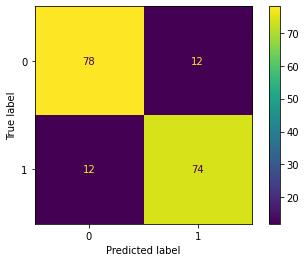

Training Accuracy: 0.85
Validation Accuracy: 0.86
Validation ROC_AUC Score: 0.86
Sensetivity(Class:1): 0.86
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.67


In [166]:
knn1 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Validation ROC_AUC Score: %.2f' % round(knn1_roc_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [167]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(526, 15) (176, 15) (526,) (176,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
541  0.979592    1   0.153846     0.087774          0  0.374046   
164  0.489796    0   0.615385     0.438871          0  0.526718   
159  0.530612    1   0.871795     0.344828          0  0.450382   
83   0.489796    1   0.871795     0.347962          0  0.717557   
9    0.408163    0   0.358974     0.623824          0  0.374046   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
541               0  0.972973                0                1   
164               0  0.027027                1                0   
159               0  0.297297                1                0   
83                0  0.027027                1                0   
9                 0  0.027027                1                0   

     ChestPainType_3  ST_Slope_1  ST_Slope_2  RestingECG_1  RestingECG_2  
541                0           0           1             0             1  
164       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
609,0.377778,1,0.526316,0.714286,0,0.372549,0,0.000000,0,0,1,1,0,0,0
692,0.222222,0,0.000000,0.336735,0,0.892157,0,0.000000,0,1,0,0,0,0,0
523,0.666667,1,0.394737,0.204082,0,0.284314,1,0.277778,0,0,1,1,0,0,0
289,0.155556,1,0.342105,0.224490,0,0.901961,0,0.000000,1,0,0,0,0,0,0
262,0.377778,1,0.342105,0.445578,0,0.264706,1,0.000000,0,0,1,1,0,0,0


In [168]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.784091,0.215909
1,2,0.732955,0.267045
2,3,0.829545,0.170455
3,4,0.801136,0.198864
4,5,0.835227,0.164773
5,6,0.823864,0.176136
6,7,0.840909,0.159091
7,8,0.835227,0.164773
8,9,0.840909,0.159091


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


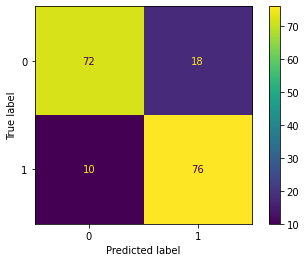

Training Accuracy: 0.89
Validation Accuracy: 0.84
Validation ROC_AUC Score: 0.67
Sensetivity(Class:1): 0.81
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.67


In [169]:
knn2 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Validation ROC_AUC Score: %.2f' % round(knn2_cross_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

In [170]:
#with droping less (below 0.1) corrolated value 
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'Cholesterol'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()

(526, 13) (176, 13) (526,) (176,)
     Age  Sex  RestingBP  FastingBS  RestingECG     MaxHR  ExerciseAngina  \
541   76    1  -1.777582          0           2 -0.847084               0   
164   52    0   0.565471          0           0 -0.022038               0   
159   54    1   1.867166          0           1 -0.434561               0   
83    52    1   1.867166          0           0  1.009270               0   
9     48    0  -0.736225          0           0 -0.847084               0   

      Oldpeak  ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  \
541  2.865814                0                1                0           0   
164 -0.872557                1                0                0           0   
159  0.195549                1                0                0           0   
83  -0.872557                1                0                0           0   
9   -0.872557                1                0                0           0   

     ST_Slope_2  
541 

,Age,Sex,RestingBP,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
609,46,1,0.110199,0,0,-0.592212,0,-0.853060,0,0,1,1,0
692,39,0,-2.467211,0,0,1.558102,0,-0.853060,0,1,0,0,0
523,59,1,-0.534154,0,0,-0.957360,1,0.124405,0,0,1,1,0
289,36,1,-0.791895,0,0,1.598674,0,-0.853060,1,0,0,0,0
262,46,1,-0.791895,0,0,-1.038504,1,-0.853060,0,0,1,1,0


In [171]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.761364,0.238636
1,2,0.727273,0.272727
2,3,0.806818,0.193182
3,4,0.801136,0.198864
4,5,0.812500,0.187500
5,6,0.789773,0.210227
6,7,0.823864,0.176136
7,8,0.818182,0.181818
8,9,0.823864,0.176136


KNN - StandardScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


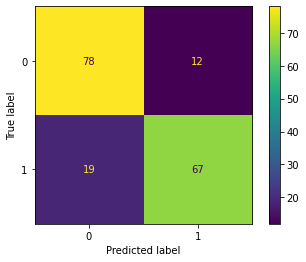

Training Accuracy: 0.86
Validation Accuracy: 0.82
Sensetivity(Class:1): 0.85
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.65


In [172]:
knn3 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn3.predict(validData)
misclassified = (validTarget != predicted).sum()
knn3_result_ssc = accuracy_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn3_cross_ssc = np.mean(cross_val_score(knn3, x,y, cv=7))
predictedp = knn3.predict_proba(validData)
predictedp = predictedp[:, 1]
knn3_auc = roc_auc_score(validTarget, predictedp)
knn3_false, knn3_true, _ = roc_curve(validTarget, predictedp)
print('KNN - StandardScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn3, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn3.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn3_result_ssc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn3_cross_ssc,2))

In [173]:
#with droping less (below 0.1) corrolated value and different scalling method
predictors = ['ChestPainType','ST_Slope' ]
x = df.drop(['HeartDisease','Cholesterol'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = MinMaxScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(526, 13) (176, 13) (526,) (176,)
     Age  Sex  RestingBP  FastingBS  RestingECG     MaxHR  ExerciseAngina  \
541   76    1   0.153846          0           2  0.374046               0   
164   52    0   0.615385          0           0  0.526718               0   
159   54    1   0.871795          0           1  0.450382               0   
83    52    1   0.871795          0           0  0.717557               0   
9     48    0   0.358974          0           0  0.374046               0   

      Oldpeak  ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  \
541  0.972973                0                1                0           0   
164  0.027027                1                0                0           0   
159  0.297297                1                0                0           0   
83   0.027027                1                0                0           0   
9    0.027027                1                0                0           0   

     ST_Slope_2  
541 

,Age,Sex,RestingBP,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
609,46,1,0.526316,0,0,0.372549,0,0.000000,0,0,1,1,0
692,39,0,0.000000,0,0,0.892157,0,0.000000,0,1,0,0,0
523,59,1,0.394737,0,0,0.284314,1,0.277778,0,0,1,1,0
289,36,1,0.342105,0,0,0.901961,0,0.000000,1,0,0,0,0
262,46,1,0.342105,0,0,0.264706,1,0.000000,0,0,1,1,0


In [174]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.784091,0.215909
1,2,0.767045,0.232955
2,3,0.823864,0.176136
3,4,0.818182,0.181818
4,5,0.835227,0.164773
5,6,0.852273,0.147727
6,7,0.812500,0.187500
7,8,0.823864,0.176136
8,9,0.818182,0.181818


KNN - MinMaxScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


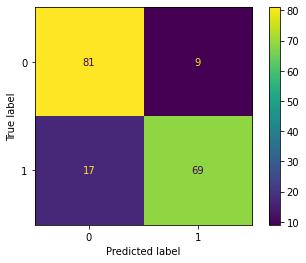

Training Accuracy: 0.88
Validation Accuracy: 0.85
Sensetivity(Class:1): 0.88
Validation Misclassified samples: 26

Cross Validation - 7 Fold: 0.66


In [175]:
knn4 = KNeighborsClassifier(n_neighbors=6).fit(trainData, trainTarget)
predicted = knn4.predict(validData)

#Model Performance

predicted = knn4.predict(validData)
misclassified = (validTarget != predicted).sum()
knn4_result_mmc = accuracy_score(validTarget, predicted)
knn4_roc_mmc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn4_cross_mmc = np.mean(cross_val_score(knn4, x,y, cv=7))
predictedp = knn4.predict_proba(validData)
predictedp = predictedp[:, 1]
knn4_auc = roc_auc_score(validTarget, predictedp)
knn4_false, knn4_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn4, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn4.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn4_result_mmc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn4_cross_mmc,2))

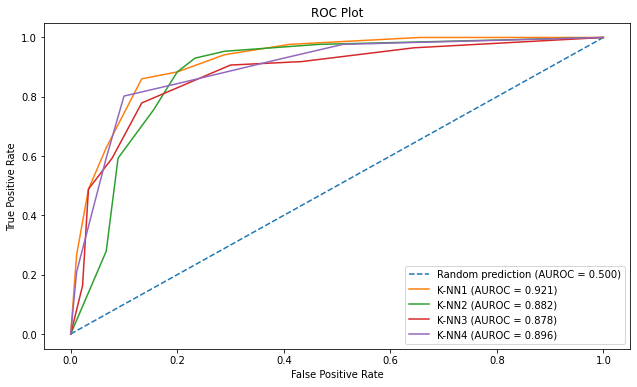

In [176]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN1 (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN2 (AUROC = %0.3f)' % knn2_auc)
plt.plot(knn3_false, knn3_true, label='K-NN3 (AUROC = %0.3f)' % knn3_auc)
plt.plot(knn4_false, knn4_true, label='K-NN4 (AUROC = %0.3f)' % knn4_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn1_result_ss,2)
bestknn_auc1 = knn1_auc
bestknn_cross1 = round(knn1_cross_ss,2)
bestknn_sen1 = knn1_sensetivity



RandomForest

   Confusion Matrix - ValidationData


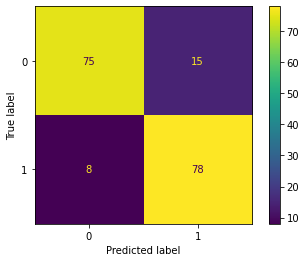

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 23

Cross Validation - 7 Fold: 0.85


In [177]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

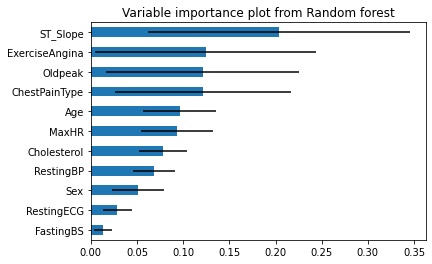

In [178]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest

   Confusion Matrix - ValidationData


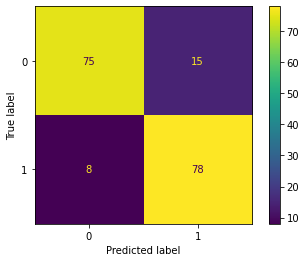

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 23

Cross Validation - 7 Fold: 0.85


In [179]:
#Random Forest

x = df.drop(['HeartDisease', 'FastingBS'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
rf_auc_best5 = roc_auc_score(validTarget, predictedp)
rf_false_best5, rf_true_best5, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


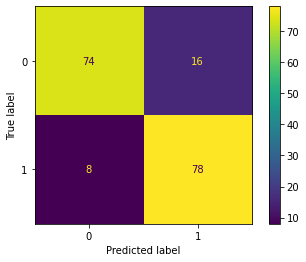

Training Accuracy: 1.00
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.83
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.86


In [180]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest

   Confusion Matrix - ValidationData


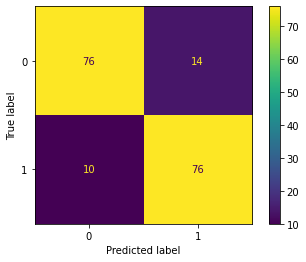

Training Accuracy: 1.00
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 24

Cross Validation - 7 Fold: 0.86


In [181]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease','FastingBS'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



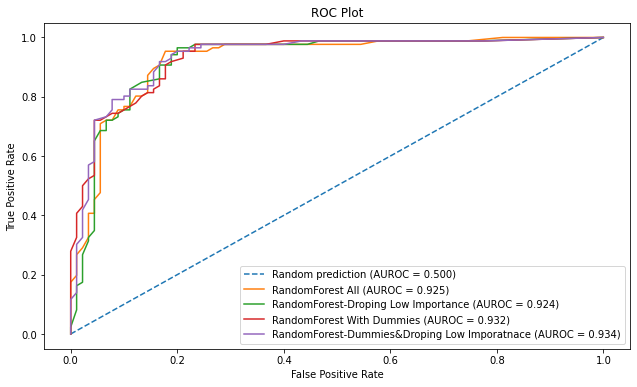

<Figure size 864x720 with 0 Axes>

In [182]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rf_results,2)
best_rf_auc1 = round(rf_auc,2)
best_rf_sen1 = rf_sen
best_rf_cross1 = round(rf_cross,2)


Decision Tree - Gini

   Confusion Matrix - ValidationData


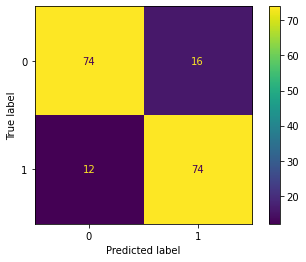

Training Accuracy: 0.98
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.82
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.77


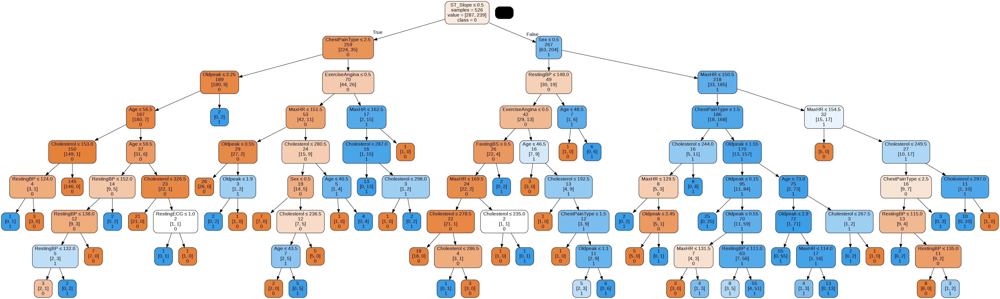

In [183]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


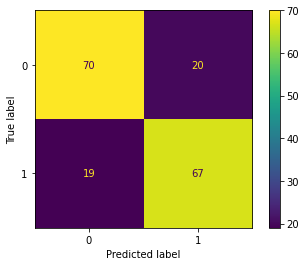

Training Accuracy: 0.97
Validation Accuracy: 0.78
Sensetivity(Class:1): 0.77
Validation Misclassified samples: 39

Cross Validation - 7 Fold: 0.79


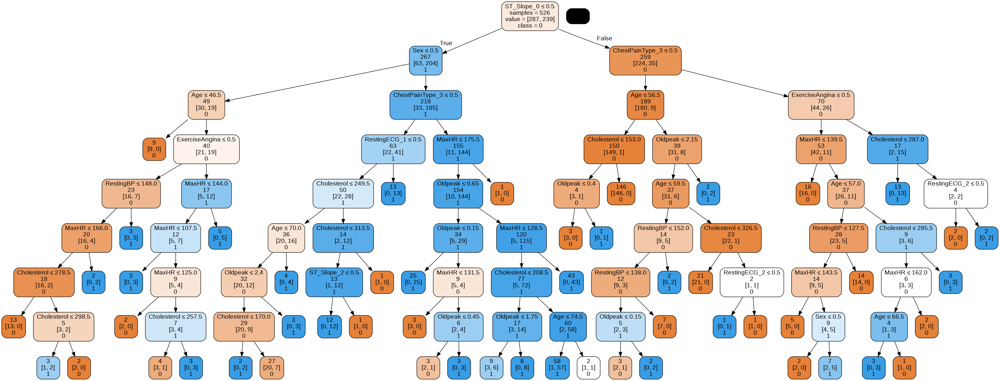

In [184]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

       alpha  mean accuracy
0   0.000000       0.789068
1   0.001250       0.791915
2   0.001743       0.801935
3   0.001782       0.806211
4   0.001818       0.811884
5   0.001826       0.811884
6   0.001845       0.811884
7   0.001888       0.811884
8   0.002281       0.810446
9   0.002535       0.806170
10  0.002535       0.806170
11  0.002603       0.806170
12  0.002632       0.804752
13  0.002852       0.804732
14  0.002852       0.804732
15  0.003042       0.810395
16  0.003074       0.808967
17  0.003145       0.804681
18  0.003169       0.804681
19  0.003259       0.806109
20  0.003411       0.804691
21  0.003457       0.810395
22  0.003687       0.813232
23  0.003961       0.814640
24  0.004307       0.810355
25  0.004442       0.817467
26  0.004442       0.817467
27  0.004519       0.817467
28  0.004545       0.817467
29  0.004587       0.817467
30  0.004676       0.817467
31  0.005512       0.823161
32  0.005898       0.821743
33  0.006289       0.814600
34  0.006359       0

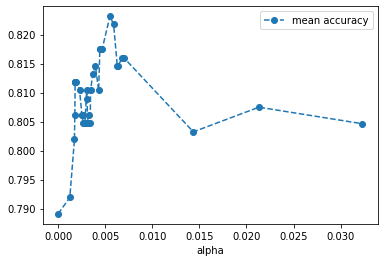

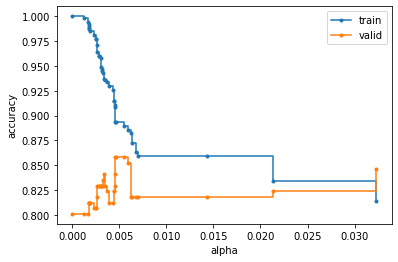

In [185]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])
print(results)
#The best value is 0.021429
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


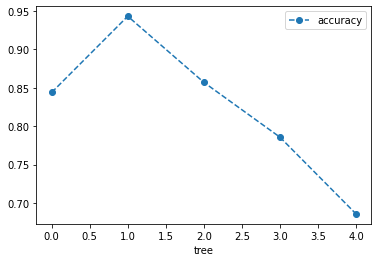

In [186]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =  0.005512)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


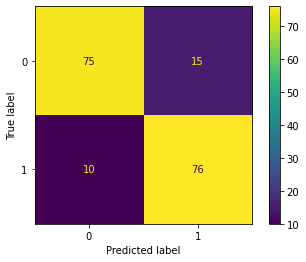

Training Accuracy: 0.89
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 25

Cross Validation - 7 Fold: 0.83


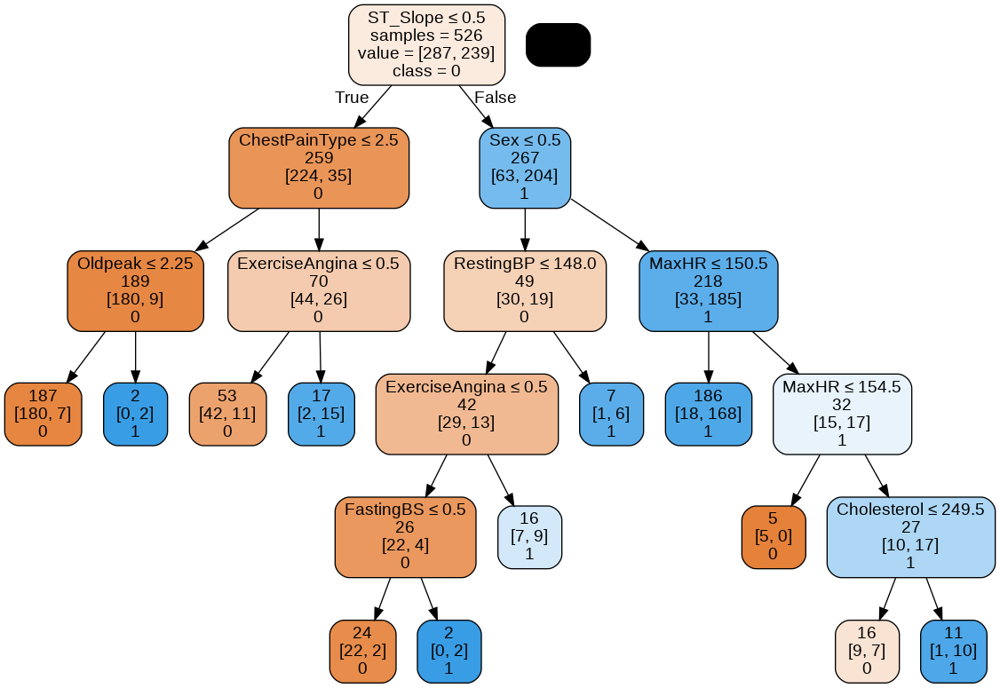

In [187]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



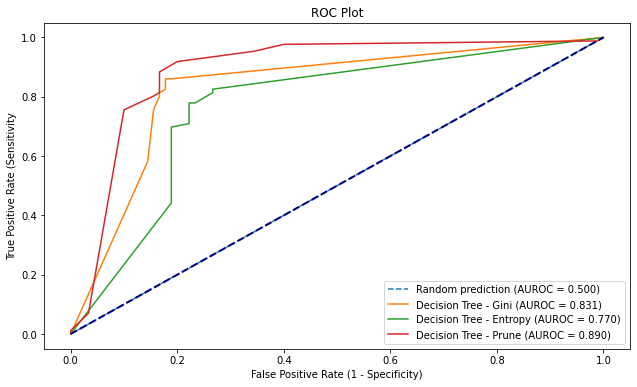

In [188]:
#ROC for best Decision Tree
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

GaussianNB

   Confusion Matrix - ValidationData


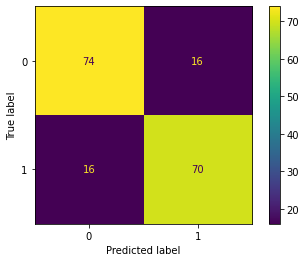

Training Accuracy: 0.85
Validation Accuracy: 0.82
Sensetivity(Class:1): 0.81
Validation Misclassified samples: 32

Cross Validation - 7 Fold: 0.84


In [189]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [190]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['Cholesterol'] = pd.qcut(df['Cholesterol'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


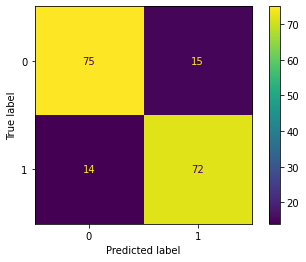

Training Accuracy: 0.84
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.83
Validation Misclassified samples: 29

Cross Validation - 7 Fold: 0.84


In [191]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','Cholesterol','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'Cholesterol': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
#x = pd.get_dummies(x, columns = predictors) better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

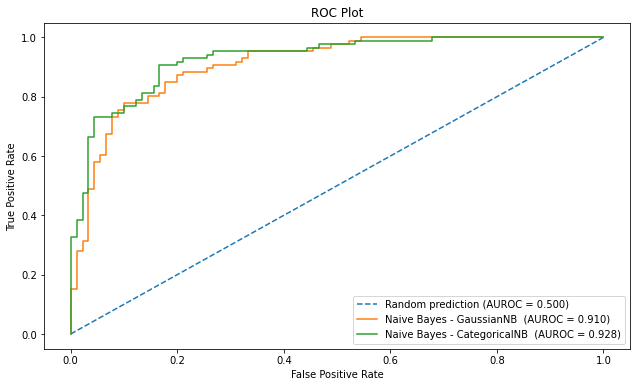

In [192]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim[(0,1)]
#plt.ylim[(0,1.05)]
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(clsnaive_results,2)
best_nv_auc1 = round(cls_auc,2)
best_nv_sen1 = clsnaive_sen
best_nv_cross1 = round(clsnaive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


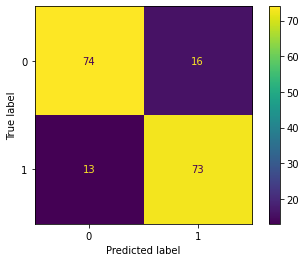

Training Accuracy: 0.86
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.82
Validation Misclassified samples: 29

              precision    recall  f1-score   support

           0       0.85      0.82      0.84        90
           1       0.82      0.85      0.83        86

    accuracy                           0.84       176
   macro avg       0.84      0.84      0.84       176
weighted avg       0.84      0.84      0.84       176

Cross Validation - 7 Fold: 0.85


In [193]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

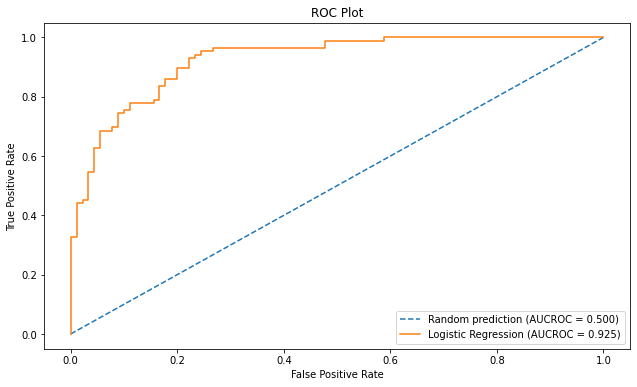

In [194]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [195]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.86,0.92,0.86,0.67
1,Best RandomForest,0.87,0.92,0.90,0.85
2,Best Decision Tree,0.86,0.89,0.84,0.83
3,Best Naive Bayes,0.84,0.93,0.83,0.84
4,Best Logistic Regression,0.84,0.92,0.82,0.85


# Scenario 6 - Replacing Chl 0 with Mean and Removing Outliers

In [196]:
df = pd.read_csv("heart.csv") 
df.drop(df.index[df['RestingBP'] == 0], inplace=True)
df['Cholesterol'].replace(0, df['Cholesterol'].mean (axis = 0), inplace =True )
df['Sex'].replace({'F':0, 'M':1}, inplace=True)
df['ChestPainType'].replace({'TA':0, 'ATA':1, 'NAP':2 ,'ASY':3}, inplace=True)
df['RestingECG'].replace({'Normal':0, 'ST':1, 'LVH':2}, inplace=True)
df['ExerciseAngina'].replace({'N':0, 'Y':1}, inplace=True)
df['ST_Slope'].replace({'Up':0, 'Flat':1, 'Down':2}, inplace=True)
#print('\nThe dataset shape is', df.shape)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,917.0,53.509269,9.437636,28.0,47.000000,54.0,60.0,77.0
Sex,917.0,0.789531,0.407864,0.0,1.000000,1.0,1.0,1.0
ChestPainType,917.0,2.251908,0.931502,0.0,2.000000,3.0,3.0,3.0
RestingBP,917.0,132.540894,17.999749,80.0,120.000000,130.0,140.0,200.0
Cholesterol,917.0,236.128459,56.231401,85.0,199.016358,223.0,267.0,603.0
FastingBS,917.0,0.233370,0.423206,0.0,0.000000,0.0,0.0,1.0
RestingECG,917.0,0.604144,0.806161,0.0,0.000000,0.0,1.0,2.0
MaxHR,917.0,136.789531,25.467129,60.0,120.000000,138.0,156.0,202.0
ExerciseAngina,917.0,0.404580,0.491078,0.0,0.000000,0.0,1.0,1.0
Oldpeak,917.0,0.886696,1.066960,-2.6,0.000000,0.6,1.5,6.2


In [197]:
#Removing Outliers and Using the outliers as test data 

cols = ['Oldpeak', 'RestingBP', 'Cholesterol', 'MaxHR'] # one or more

Q1 = df[cols].quantile(0.25)
Q3 = df[cols].quantile(0.75)
IQR = Q3 - Q1

outliersData = df[((df[cols] < (Q1 - 1.5 * IQR)) |(df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
df = df[~((df[cols] < (Q1 - 1.5 * IQR)) |(df[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
outliersTarget = outliersData['HeartDisease'] #will be used for testing
outliersData = outliersData.drop(['HeartDisease'], axis = 'columns') #will be used for testing

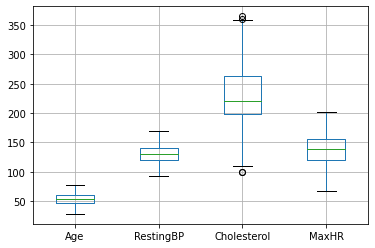

In [198]:
%matplotlib inline
boxplot = df.boxplot(column=['Age','RestingBP','Cholesterol', 'MaxHR']) 

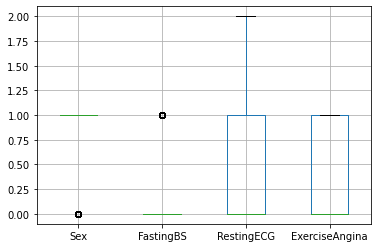

In [199]:
boxplot = df.boxplot(column=['Sex','FastingBS', 'RestingECG', 'ExerciseAngina']) 

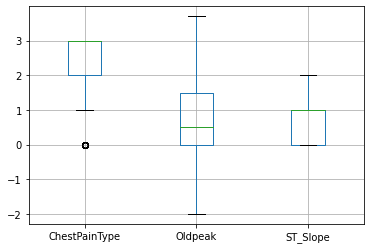

In [200]:
boxplot = df.boxplot(column=['ChestPainType','Oldpeak', 'ST_Slope']) 

RandomForestClassifier(n_estimators=88, random_state=50)

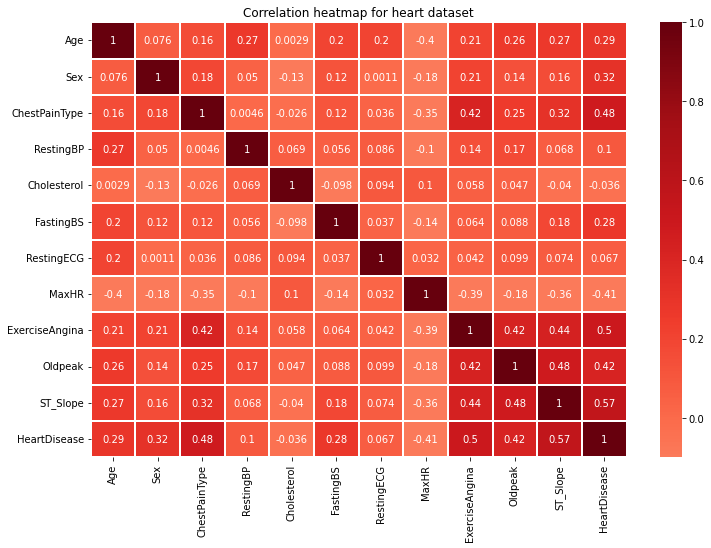

In [201]:
%matplotlib inline
#Checking Variable importance through correlation and randomforest
corr = df.corr()
f, ax=plt.subplots(figsize=(12,8))
ax = sns.heatmap(corr, vmin = -0.1, vmax =1, center =0, annot=True, linewidth=1, cmap="Reds")
ax.set_title('Correlation heatmap for heart dataset')


x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 50)
rfa.fit(trainData, trainTarget)

In [202]:
# exploring knn method

predictors = ['ChestPainType', 'RestingECG', 'ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR', 'Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(640, 15) (214, 15) (640,) (214,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
25  -1.866914    1  -0.063726    -0.491164          0  1.622415   
207 -1.975328    1  -1.324448     0.571179          0  0.110763   
817  0.735010    1  -0.378906     0.593311          0  0.150544   
56  -2.408982    1  -0.694087     0.858897          0  0.627907   
219 -2.625809    1   0.566636     0.703972          0  1.304173   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
25                0 -0.868945                0                1   
207               0 -0.868945                1                0   
817               1  2.024847                0                0   
56                1  0.681301                0                0   
219               0 -0.868945                1                0   

     ChestPainType_3  RestingECG_1  RestingECG_2  ST_Slope_1  ST_Slope_2  
25                 0             0             0           0           0  
207       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,RestingECG_1,RestingECG_2,ST_Slope_1,ST_Slope_2
685,0.714760,1,-0.671752,0.632423,0,0.109658,1,2.848044,0,0,1,0,0,1,0
526,1.104463,1,0.856879,1.718395,0,-0.949876,1,0.911565,0,0,1,0,1,1,0
547,0.714760,1,0.729493,-0.620622,1,-1.460022,0,0.707725,0,0,0,1,0,0,1
145,-1.428609,1,-1.308682,0.903916,0,-0.204278,0,-0.821075,0,0,1,0,0,0,0
405,-1.818313,1,-0.671752,-0.641165,1,-0.282762,1,0.401965,0,0,1,0,0,1,0


In [203]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.775701,0.224299
1,2,0.761682,0.238318
2,3,0.822430,0.177570
3,4,0.827103,0.172897
4,5,0.836449,0.163551
5,6,0.831776,0.168224
6,7,0.822430,0.177570
7,8,0.845794,0.154206
8,9,0.836449,0.163551


KNN - StandardScaler

   Confusion Matrix - Validation Data


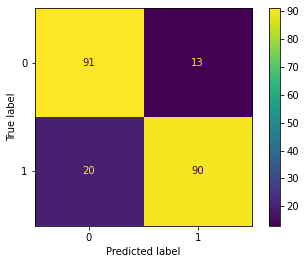

Training Accuracy: 0.88
Validation Accuracy: 0.85
Validation ROC_AUC Score: 0.85
Sensetivity(Class:1): 0.87
Validation Misclassified samples: 33

Cross Validation - 7 Fold: 0.65


In [204]:
knn1 = KNeighborsClassifier(n_neighbors=8).fit(trainData, trainTarget)

#Model Performance

predicted = knn1.predict(validData)
misclassified = (validTarget != predicted).sum()
knn1_result_ss = accuracy_score(validTarget, predicted)
knn1_roc_ss = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
predictedp = knn1.predict_proba(validData)
predictedp = predictedp[:, 1]
knn1_false, knn1_true, _ = roc_curve(validTarget, predictedp)
knn1_auc = roc_auc_score(validTarget, predictedp)
knn1_auc = auc(knn1_false, knn1_true)
knn1_cross_ss = np.mean(cross_val_score(knn1, x,y, cv=7))
knn1_sensetivity = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
print('KNN - StandardScaler\n')
print('   Confusion Matrix - Validation Data')
plot_confusion_matrix(knn1, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn1.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn1_result_ss,2))
print('Validation ROC_AUC Score: %.2f' % round(knn1_roc_ss,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn1_cross_ss,2))




In [205]:
# exploring knn method with different scalling

predictors = ['ChestPainType', 'ST_Slope', 'RestingECG']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)


scaler = MinMaxScaler()
Norms = [['Age', 'RestingBP', 'Cholesterol','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(640, 15) (214, 15) (640,) (214,)
          Age  Sex  RestingBP  Cholesterol  FastingBS     MaxHR  \
25   0.163265    1   0.487179     0.388235          0  0.822222   
207  0.142857    1   0.230769     0.576471          0  0.540741   
817  0.653061    1   0.423077     0.580392          0  0.548148   
56   0.061224    1   0.358974     0.627451          0  0.637037   
219  0.020408    1   0.615385     0.600000          0  0.762963   

     ExerciseAngina   Oldpeak  ChestPainType_1  ChestPainType_2  \
25                0  0.350877                0                1   
207               0  0.350877                1                0   
817               1  0.842105                0                0   
56                1  0.614035                0                0   
219               0  0.350877                1                0   

     ChestPainType_3  ST_Slope_1  ST_Slope_2  RestingECG_1  RestingECG_2  
25                 0           0           0             0             0  
207       

,Age,Sex,RestingBP,Cholesterol,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2,RestingECG_1,RestingECG_2
685,0.666667,1,0.333333,0.627451,0,0.591304,1,1.000000,0,0,1,1,0,0,0
526,0.750000,1,0.653333,0.831373,0,0.356522,1,0.595745,0,0,1,1,0,0,1
547,0.666667,1,0.626667,0.392157,1,0.243478,0,0.553191,0,0,0,0,1,1,0
145,0.208333,1,0.200000,0.678431,0,0.521739,0,0.234043,0,0,1,0,0,0,0
405,0.125000,1,0.333333,0.388299,1,0.504348,1,0.489362,0,0,1,1,0,0,0


In [206]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.794393,0.205607
1,2,0.785047,0.214953
2,3,0.831776,0.168224
3,4,0.808411,0.191589
4,5,0.845794,0.154206
5,6,0.836449,0.163551
6,7,0.855140,0.144860
7,8,0.841121,0.158879
8,9,0.855140,0.144860


KNN - MinMaxScaler

   Confusion Matrix - ValidationData


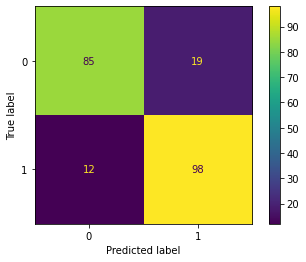

Training Accuracy: 0.88
Validation Accuracy: 0.86
Validation ROC_AUC Score: 0.66
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.66


In [207]:
knn2 = KNeighborsClassifier(n_neighbors=7).fit(trainData, trainTarget)

#Model Performance

predicted = knn2.predict(validData)
misclassified = (validTarget != predicted).sum()
knn2_result_mm = accuracy_score(validTarget, predicted)
knn2_roc_mm = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn2_cross_mm = np.mean(cross_val_score(knn2, x,y, cv=7))
predictedp = knn2.predict_proba(validData)
predictedp = predictedp[:, 1]
knn2_auc = roc_auc_score(validTarget, predictedp)
knn2_false, knn2_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn2, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn2.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn2_result_mm,2))
print('Validation ROC_AUC Score: %.2f' % round(knn2_cross_mm,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn2_cross_mm,2))

In [208]:
#with droping less (below 0.1) corrolated value 
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease', 'Cholesterol', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = StandardScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()

(640, 12) (214, 12) (640,) (214,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
25    36    1  -0.063726          0  1.622415               0 -0.868945   
207   35    1  -1.324448          0  0.110763               0 -0.868945   
817   60    1  -0.378906          0  0.150544               1  2.024847   
56    31    1  -0.694087          0  0.627907               1  0.681301   
219   29    1   0.566636          0  1.304173               0 -0.868945   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  ST_Slope_2  
25                 0                1                0           0           0  
207                1                0                0           1           0  
817                0                0                1           1           0  
56                 0                0                1           1           0  
219                1                0                0           0           0  


,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
685,61,1,-0.671752,0,0.109658,1,2.848044,0,0,1,1,0
526,65,1,0.856879,0,-0.949876,1,0.911565,0,0,1,1,0
547,61,1,0.729493,1,-1.460022,0,0.707725,0,0,0,0,1
145,39,1,-1.308682,0,-0.204278,0,-0.821075,0,0,1,0,0
405,35,1,-0.671752,1,-0.282762,1,0.401965,0,0,1,1,0


In [209]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.733645,0.266355
1,2,0.733645,0.266355
2,3,0.738318,0.261682
3,4,0.761682,0.238318
4,5,0.761682,0.238318
5,6,0.752336,0.247664
6,7,0.761682,0.238318
7,8,0.775701,0.224299
8,9,0.780374,0.219626


KNN - StandardScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


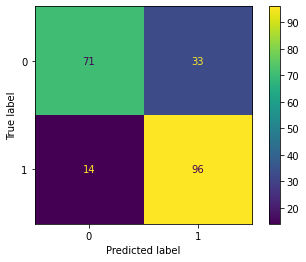

Training Accuracy: 0.87
Validation Accuracy: 0.78
Sensetivity(Class:1): 0.74
Validation Misclassified samples: 47

Cross Validation - 7 Fold: 0.68


In [210]:
knn3 = KNeighborsClassifier(n_neighbors=9).fit(trainData, trainTarget)

#Model Performance

predicted = knn3.predict(validData)
misclassified = (validTarget != predicted).sum()
knn3_result_ssc = accuracy_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn3_cross_ssc = np.mean(cross_val_score(knn3, x,y, cv=7))
predictedp = knn3.predict_proba(validData)
predictedp = predictedp[:, 1]
knn3_auc = roc_auc_score(validTarget, predictedp)
knn3_false, knn3_true, _ = roc_curve(validTarget, predictedp)
print('KNN - StandardScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn3, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn3.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn3_result_ssc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn3_cross_ssc,2))

In [211]:
#with droping less (below 0.1) corrolated value and different scalling method
predictors = ['ChestPainType','ST_Slope' ]
x = df.drop(['HeartDisease','Cholesterol', 'RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=True)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
print(trainData.shape, validData.shape, trainTarget.shape, validTarget.shape)

scaler = MinMaxScaler()
Norms = [['RestingBP','MaxHR','Oldpeak']]

for t in Norms:
    trainData[t] = scaler.fit_transform(trainData[t])

for v in Norms:
    validData[v] = scaler.fit_transform(validData[v])

print(trainData.head())
validData.head()


(640, 12) (214, 12) (640,) (214,)
     Age  Sex  RestingBP  FastingBS     MaxHR  ExerciseAngina   Oldpeak  \
25    36    1   0.487179          0  0.822222               0  0.350877   
207   35    1   0.230769          0  0.540741               0  0.350877   
817   60    1   0.423077          0  0.548148               1  0.842105   
56    31    1   0.358974          0  0.637037               1  0.614035   
219   29    1   0.615385          0  0.762963               0  0.350877   

     ChestPainType_1  ChestPainType_2  ChestPainType_3  ST_Slope_1  ST_Slope_2  
25                 0                1                0           0           0  
207                1                0                0           1           0  
817                0                0                1           1           0  
56                 0                0                1           1           0  
219                1                0                0           0           0  


,Age,Sex,RestingBP,FastingBS,MaxHR,ExerciseAngina,Oldpeak,ChestPainType_1,ChestPainType_2,ChestPainType_3,ST_Slope_1,ST_Slope_2
685,61,1,0.333333,0,0.591304,1,1.000000,0,0,1,1,0
526,65,1,0.653333,0,0.356522,1,0.595745,0,0,1,1,0
547,61,1,0.626667,1,0.243478,0,0.553191,0,0,0,0,1
145,39,1,0.200000,0,0.521739,0,0.234043,0,0,1,0,0
405,35,1,0.333333,1,0.504348,1,0.489362,0,0,1,1,0


In [212]:
bestK = []
for k in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=k).fit(trainData, trainTarget)
    bestK.append({
        'k': k,
        'accuracy': accuracy_score(validTarget, knn.predict(validData)),
        'MSE':mean_squared_error(validTarget, knn.predict(validData))
    })

bestK = pd.DataFrame(bestK)
bestK.head(10)

,k,accuracy,MSE
0,1,0.752336,0.247664
1,2,0.733645,0.266355
2,3,0.761682,0.238318
3,4,0.789720,0.210280
4,5,0.775701,0.224299
5,6,0.794393,0.205607
6,7,0.780374,0.219626
7,8,0.780374,0.219626
8,9,0.771028,0.228972


KNN - MinMaxScaler - High Corrolation Predictors

   Confusion Matrix - ValidationData


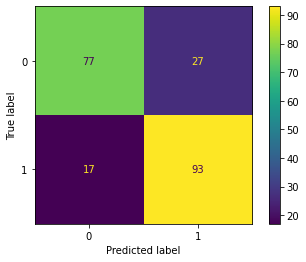

Training Accuracy: 0.89
Validation Accuracy: 0.79
Sensetivity(Class:1): 0.78
Validation Misclassified samples: 44

Cross Validation - 7 Fold: 0.67


In [213]:
knn4 = KNeighborsClassifier(n_neighbors=6).fit(trainData, trainTarget)
predicted = knn4.predict(validData)

#Model Performance

predicted = knn4.predict(validData)
misclassified = (validTarget != predicted).sum()
knn4_result_mmc = accuracy_score(validTarget, predicted)
knn4_roc_mmc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
knn4_cross_mmc = np.mean(cross_val_score(knn4, x,y, cv=7))
predictedp = knn4.predict_proba(validData)
predictedp = predictedp[:, 1]
knn4_auc = roc_auc_score(validTarget, predictedp)
knn4_false, knn4_true, _ = roc_curve(validTarget, predictedp)
print('KNN - MinMaxScaler - High Corrolation Predictors\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(knn4, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % knn4.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(knn4_result_mmc,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(knn4_cross_mmc,2))

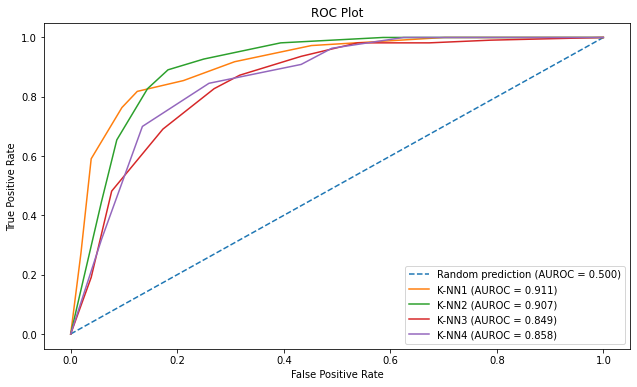

In [214]:
#ROC for best KNN
%matplotlib inline
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(knn1_false, knn1_true, label='K-NN1 (AUROC = %0.3f)' % knn1_auc)
plt.plot(knn2_false, knn2_true, label='K-NN2 (AUROC = %0.3f)' % knn2_auc)
plt.plot(knn3_false, knn3_true, label='K-NN3 (AUROC = %0.3f)' % knn3_auc)
plt.plot(knn4_false, knn4_true, label='K-NN4 (AUROC = %0.3f)' % knn4_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0, 1])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.show()



#best K-NN is K-NN 1 Hence,
bestknn_cm_accuracy1 = round(knn1_result_ss,2)
bestknn_auc1 = knn1_auc
bestknn_cross1 = round(knn1_cross_ss,2)
bestknn_sen1 = knn1_sensetivity



RandomForest

   Confusion Matrix - ValidationData


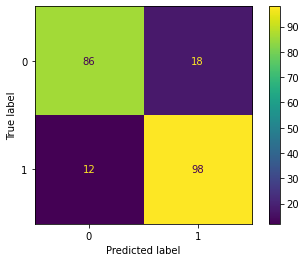

Training Accuracy: 1.00
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 30

Cross Validation - 7 Fold: 0.85


In [215]:
#Random Forest all

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfa = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfa.fit(trainData, trainTarget)

#Model Performance
predicted = rfa.predict(validData)
misclassified = (validTarget != predicted).sum()
rfa_results = accuracy_score(validTarget, predicted)
rfa_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfa_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfa_cross = np.mean(cross_val_score(rfa, x,y, cv=7))
predictedp = rfa.predict_proba(validData)
predictedp = predictedp[:, 1]
rfa_auc = roc_auc_score(validTarget, predictedp)
rfa_false, rfa_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfa, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfa.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfa_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfa_cross,2))

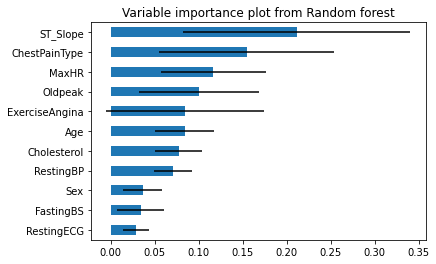

In [216]:
importances = rfa.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfa.estimators_], axis=0)

im = pd.DataFrame({'feature': trainData.columns, 'importance': importances, 'std': std})
im = im.sort_values('importance')


ax = im.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
ax.set_title('Variable importance plot from Random forest')
plt.show()

RandomForest

   Confusion Matrix - ValidationData


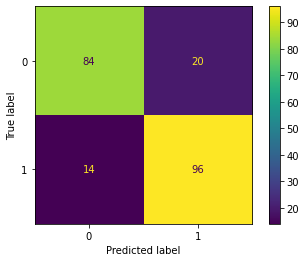

Training Accuracy: 1.00
Validation Accuracy: 0.84
Sensetivity(Class:1): 0.83
Validation Misclassified samples: 34

Cross Validation - 7 Fold: 0.85


In [217]:
#Random Forest

x = df.drop(['HeartDisease', 'RestingECG'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rf = RandomForestClassifier(n_estimators= 88, random_state= 100)
rf.fit(trainData, trainTarget)

#Model Performance
predicted = rf.predict(validData)
misclassified = (validTarget != predicted).sum()
rf_results = accuracy_score(validTarget, predicted)
rf_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rf_cross = np.mean(cross_val_score(rf, x,y, cv=7))
predictedp = rf.predict_proba(validData)
predictedp = predictedp[:, 1]
rf_auc = roc_auc_score(validTarget, predictedp)
rf_false, rf_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rf, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rf.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rf_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rf_cross,2))

RandomForest with dummies

   Confusion Matrix - ValidationData


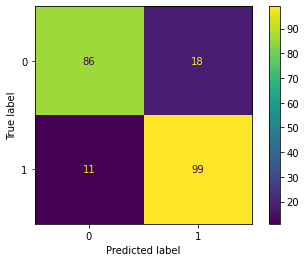

Training Accuracy: 1.00
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.85
Validation Misclassified samples: 29

Cross Validation - 7 Fold: 0.85


In [218]:
#Random Forest Dummies
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfd = RandomForestClassifier(n_estimators= 88, random_state= 100)
rfd.fit(trainData, trainTarget)

#Model Performance
predicted = rfd.predict(validData)
misclassified = (validTarget != predicted).sum()
rfd_results = accuracy_score(validTarget, predicted)
rfd_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfd_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfd_cross = np.mean(cross_val_score(rfd, x,y, cv=7))
predictedp = rfd.predict_proba(validData)
predictedp = predictedp[:, 1]
rfd_auc = roc_auc_score(validTarget, predictedp)
rfd_false, rfd_true, _ = roc_curve(validTarget, predictedp)
print('RandomForest with dummies\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfd, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfd.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfd_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfd_cross,2))


RandomForest

   Confusion Matrix - ValidationData


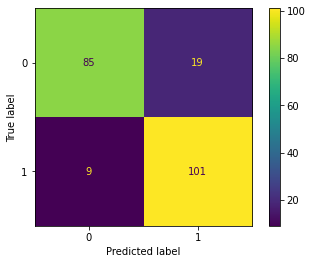

Training Accuracy: 1.00
Validation Accuracy: 0.87
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 28

Cross Validation - 7 Fold: 0.86


In [219]:
#Random Forest
predictors = ['ChestPainType','ST_Slope']
x = df.drop(['HeartDisease','RestingECG'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first=False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)
rfad = RandomForestClassifier(n_estimators = 88, random_state= 100)
rfad.fit(trainData, trainTarget)

#Model Performance
predicted = rfad.predict(validData)
misclassified = (validTarget != predicted).sum()
rfad_results = accuracy_score(validTarget, predicted)
rfad_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
rfad_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
rfad_cross = np.mean(cross_val_score(rfad, x,y, cv=7))
predictedp = rfad.predict_proba(validData)
predictedp = predictedp[:, 1]
rfad_auc = roc_auc_score(validTarget, predictedp)
rfad_false, rfad_true, _ = roc_curve(validTarget, predictedp)
rfad_auc_best6 = roc_auc_score(validTarget, predictedp)
rfad_false_best6, rfad_true_best6, _ = roc_curve(validTarget, predictedp)
print('RandomForest\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(rfad, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % rfad.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(rfad_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(rfad_cross,2))



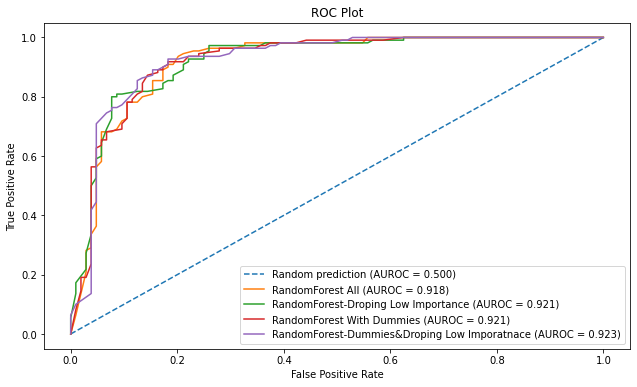

<Figure size 864x720 with 0 Axes>

In [220]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfa_false, rfa_true, label='RandomForest All (AUROC = %0.3f)' % rfa_auc)
plt.plot(rf_false, rf_true, label='RandomForest-Droping Low Importance (AUROC = %0.3f)' % rf_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest With Dummies (AUROC = %0.3f)' % rfd_auc)
plt.plot(rfad_false, rfad_true, label='RandomForest-Dummies&Droping Low Imporatnace (AUROC = %0.3f)' % rfad_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()

#best of RandomForest:
best_rf_cm1 = round(rfad_results,2)
best_rf_auc1 = round(rfad_auc,2)
best_rf_sen1 = rfad_sen
best_rf_cross1 = round(rfad_cross,2)


Decision Tree - Gini

   Confusion Matrix - ValidationData


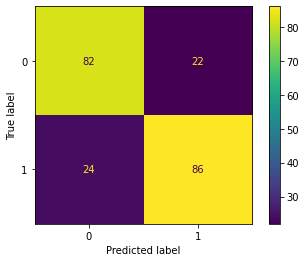

Training Accuracy: 0.97
Validation Accuracy: 0.79
Sensetivity(Class:1): 0.80
Validation Misclassified samples: 46

Cross Validation - 7 Fold: 0.81


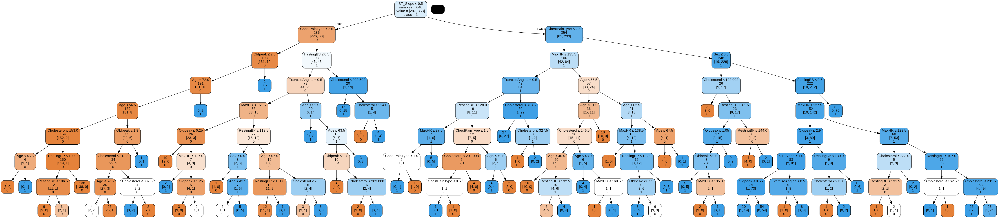

In [221]:
#Decision Tree with gini

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_gini = DecisionTreeClassifier(criterion = "gini",random_state =100,max_depth=8)
dt_gini.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_gini.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_gini_results = accuracy_score(validTarget, predicted)
dt_gini_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_gini_cross = np.mean(cross_val_score(dt_gini, x,y, cv=7))
predictedp = dt_gini.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_gini_auc = roc_auc_score(validTarget, predictedp)
dt_gini_false, dt_gini_true, _ = roc_curve(validTarget, predictedp)
print('Decision Tree - Gini\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_gini, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_gini.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_gini_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_gini_cross,2))

plotDecisionTree(dt_gini, feature_names= x.columns,class_names=dt_gini.classes_)

Decision Tree - Entropy

   Confusion Matrix - ValidationData


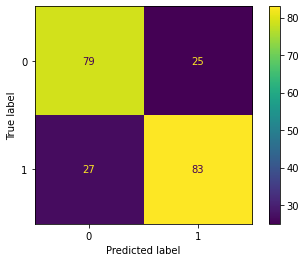

Training Accuracy: 0.97
Validation Accuracy: 0.76
Sensetivity(Class:1): 0.77
Validation Misclassified samples: 52

Cross Validation - 7 Fold: 0.79


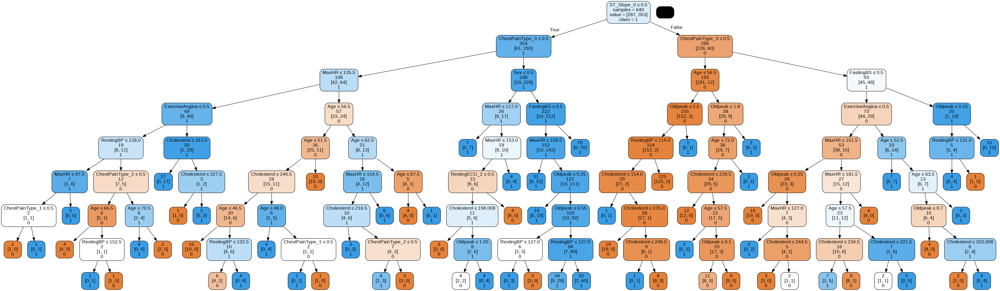

In [222]:
# Decision tree with entropy 
predictors = ['ChestPainType', 'RestingECG','ST_Slope']
x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first = False)
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dt_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,max_depth = 8)
dt_entropy.fit(trainData, trainTarget) 

#Model Performance

predicted = dt_entropy.predict(validData)
misclassified = (validTarget != predicted).sum()
dt_entropy_results = accuracy_score(validTarget, predicted)
dt_entropy_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dt_entropy_cross = np.mean(cross_val_score(dt_entropy, x,y, cv=7))
predictedp = dt_entropy.predict_proba(validData)
predictedp = predictedp[:, 1]
dt_entropy_auc = roc_auc_score(validTarget, predictedp)
dt_entropy_false, dt_entropy_true, cutoff = roc_curve(validTarget, predictedp)
print('Decision Tree - Entropy\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dt_entropy, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dt_entropy.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dt_entropy_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dt_entropy_cross,2))

plotDecisionTree(dt_entropy, feature_names= x.columns,class_names=dt_entropy.classes_)

       alpha  mean accuracy
0   0.000000       0.771510
1   0.000990       0.775026
2   0.001028       0.775026
3   0.001035       0.775026
4   0.001042       0.775026
5   0.001150       0.775026
6   0.001197       0.776195
7   0.001250       0.777365
8   0.001302       0.778535
9   0.001302       0.778535
10  0.001339       0.778535
11  0.001339       0.778535
12  0.001432       0.782043
13  0.001438       0.782043
14  0.001502       0.780867
15  0.001510       0.780867
16  0.001532       0.780867
17  0.001838       0.782036
18  0.001875       0.782036
19  0.001875       0.782036
20  0.002009       0.780867
21  0.002083       0.780867
22  0.002424       0.792583
23  0.002461       0.791407
24  0.002500       0.796099
25  0.002857       0.798431
26  0.002936       0.804279
27  0.003064       0.805449
28  0.003281       0.810169
29  0.003345       0.810169
30  0.003601       0.810182
31  0.003750       0.811352
32  0.004167       0.817200
33  0.004177       0.817200
34  0.004460       0

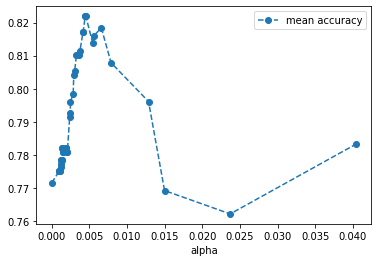

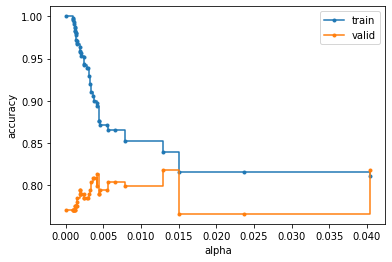

In [223]:
#Prune Tree
x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']
trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

dtp = DecisionTreeClassifier(random_state = 100)
dtp.fit(trainData, trainTarget) 

path = dtp.cost_complexity_pruning_path(trainData, trainTarget)
ccp = path.ccp_alphas
ccp = ccp[:-1]

alpha_values = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  score = cross_val_score(dtp, x, y)
  alpha_values.append([ccp_alpha, np.mean(score)])

results = pd.DataFrame(alpha_values, columns = ['alpha','mean accuracy'])
print(results)
#The best value is 0.021429
results.plot(x='alpha', y='mean accuracy',  marker ='o', linestyle ='--');
dts = []
for ccp_alpha in ccp:
  dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha = ccp_alpha)
  dtp.fit(trainData,trainTarget)
  dts.append(dtp)

train_score = [dtp.score(trainData,trainTarget) for dtp in dts]
valid_score = [dtp.score(validData,validTarget) for dtp in dts]
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.plot(ccp, train_score, marker = '.', label = 'train', drawstyle = "steps-post")
ax.plot(ccp, valid_score, marker = '.', label = 'valid', drawstyle = "steps-post")
ax.legend()
plt.show()


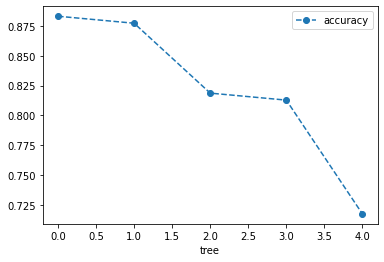

In [224]:
dtp = DecisionTreeClassifier(random_state = 100, ccp_alpha =  0.004460)
dtp.fit(trainData,trainTarget)
score = cross_val_score(dtp, x, y)
alpha_values = pd.DataFrame(data ={'tree':range(5),'accuracy':score})
alpha_values.plot(x = 'tree', y='accuracy', marker ='o', linestyle ='--');

   Confusion Matrix - ValidationData


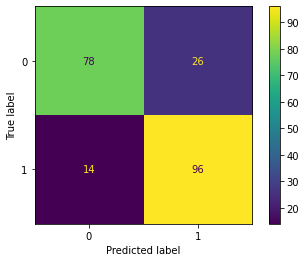

Training Accuracy: 0.89
Validation Accuracy: 0.81
Sensetivity(Class:1): 0.79
Validation Misclassified samples: 40

Cross Validation - 7 Fold: 0.82


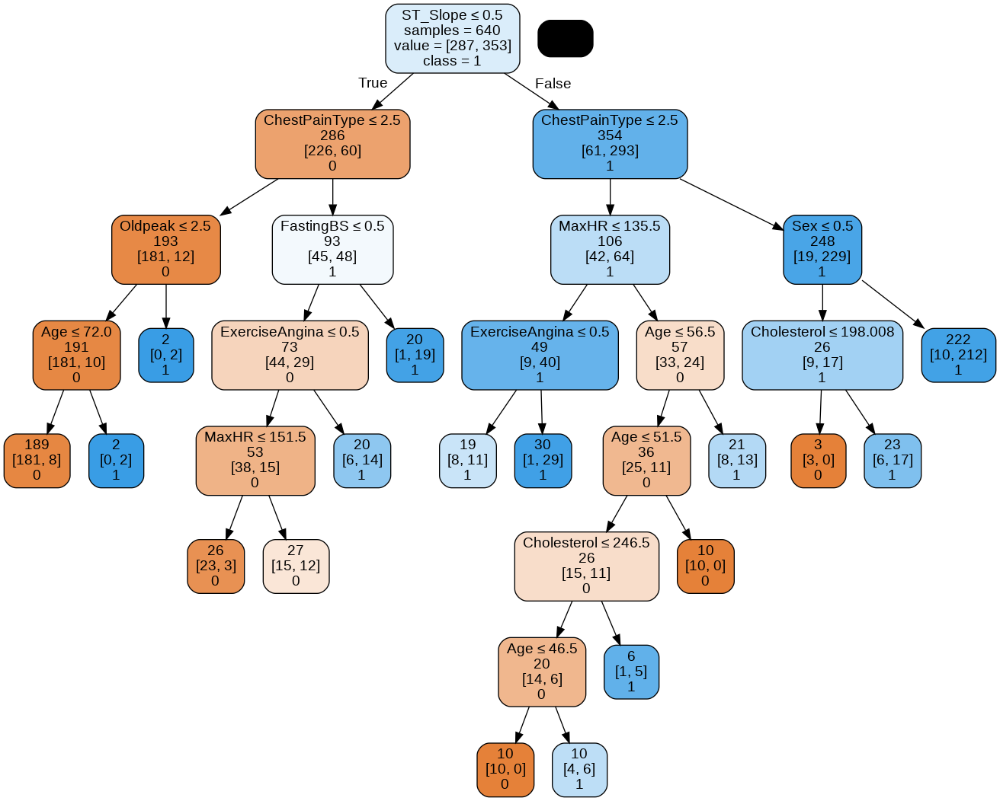

In [225]:
predicted = dtp.predict(validData)
misclassified = (validTarget != predicted).sum()
dtp_results = accuracy_score(validTarget, predicted)
dtp_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
dtp_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
dtp_cross = np.mean(cross_val_score(dtp, x,y, cv=7))
predictedp = dtp.predict_proba(validData)
predictedp = predictedp[:,1]
dtp_auc = roc_auc_score(validTarget,predictedp)
dtp_false, dtp_true, _ = roc_curve(validTarget, predictedp)
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(dtp, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % dtp.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(dtp_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(dtp_cross,2))


plotDecisionTree(dtp, feature_names= x.columns,class_names=dtp.classes_)



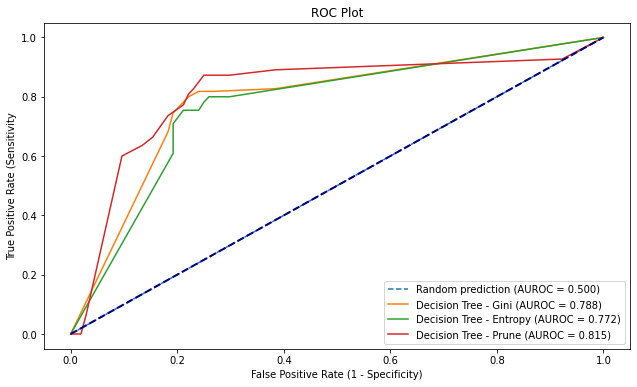

In [226]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(dt_gini_false, dt_gini_true, label='Decision Tree - Gini (AUROC = %0.3f)' % dt_gini_auc)
plt.plot(dt_entropy_false, dt_entropy_true, label='Decision Tree - Entropy (AUROC = %0.3f)' % dt_entropy_auc)
plt.plot(dtp_false, dtp_true, label='Decision Tree - Prune (AUROC = %0.3f)' % dtp_auc)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.legend()
plt.show()

#Best Decision Tree Method
best_dt_cm1 = round(dtp_results,2)
best_dt_auc1 = round(dtp_auc,2)
best_dt_sen1 = dtp_sen
best_dt_cross1 = round(dtp_cross,2)

GaussianNB

   Confusion Matrix - ValidationData


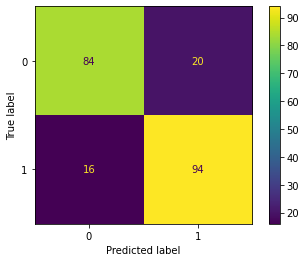

Training Accuracy: 0.85
Validation Accuracy: 0.83
Sensetivity(Class:1): 0.82
Validation Misclassified samples: 36

Cross Validation - 7 Fold: 0.83


In [227]:
#Naive Bayes

x = df.drop(['HeartDisease'], axis = 'columns')
y = df['HeartDisease']

trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

gnb = GaussianNB()
gnb.fit(trainData, trainTarget)

#Model Performance

predicted = gnb.predict(validData)
misclassified = (validTarget != predicted).sum()
naive_results = accuracy_score(validTarget, predicted)
naive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
naive_cross = np.mean(cross_val_score(gnb, x,y, cv=7))
predictedp = gnb.predict_proba(validData)
predictedp = predictedp[:,1]
gnb_auc = roc_auc_score(validTarget,predictedp)
gnb_false, gnb_true, _ = roc_curve(validTarget, predictedp)
print('GaussianNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(gnb, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % gnb.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(naive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(naive_cross,2))

In [228]:
#Naive Bayes Classifier 
#After running this code and before going to the other method you need to rerun the main df in order to bring the values to its normal form

# convert continuous variables into categorical ones through binning
df['Age'] = pd.qcut(df['Age'], 5, labels=[0,1,2,3,4])
df['RestingBP'] = pd.qcut(df['RestingBP'], 5, labels=[0,1,2,3,4])
df['Cholesterol'] = pd.qcut(df['Cholesterol'], 5, labels=[0,1,2,3,4])
df['MaxHR'] = pd.qcut(df['MaxHR'], 5, labels=[0,1,2,3,4])
scaler = MinMaxScaler()
df[['Oldpeak']] = scaler.fit_transform(df[['Oldpeak']])
df['Oldpeak'] = pd.qcut(df['Oldpeak'], 4, labels=[0,1,2,3,])

CategoricalNB

   Confusion Matrix - ValidationData


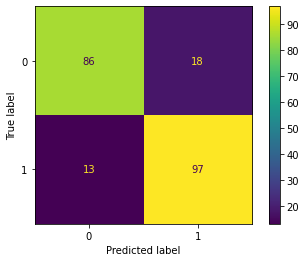

Training Accuracy: 0.85
Validation Accuracy: 0.86
Sensetivity(Class:1): 0.84
Validation Misclassified samples: 31

Cross Validation - 7 Fold: 0.84


In [229]:
#changing all to category type
predictors = ['ChestPainType', 'RestingECG', 'ST_Slope','RestingBP','Cholesterol','MaxHR','Oldpeak']
df = df.astype({'Age': 'category', 'Sex': 'category', 'ChestPainType': 'category', 'RestingBP': 'category', 'Cholesterol': 'category', 'FastingBS': 'category','RestingECG': 'category', 
'MaxHR': 'category', 'ExerciseAngina': 'category', 'ST_Slope': 'category','HeartDisease': 'category', 'Oldpeak':'category'})

x = df.drop(['HeartDisease'], axis = 'columns')
#x = pd.get_dummies(x, columns = predictors) better without dummies
y = df['HeartDisease']


trainData, validData, trainTarget, validTarget = train_test_split(x, y, test_size= 0.25, random_state = 100)

cls = CategoricalNB()
cls.fit(trainData, trainTarget)

#Model Performance

predicted = cls.predict(validData)
misclassified = (validTarget != predicted).sum()
clsnaive_results = accuracy_score(validTarget, predicted)
clsnaive_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
clsnaive_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
clsnaive_cross = np.mean(cross_val_score(cls, x,y, cv=7))
predictedp = cls.predict_proba(validData)
predictedp = predictedp[:,1]
cls_auc = roc_auc_score(validTarget,predictedp)
cls_false, cls_true, _ = roc_curve(validTarget, predictedp)
print('CategoricalNB\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(cls, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % cls.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(clsnaive_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print('Cross Validation - 7 Fold: %.2f' % round(clsnaive_cross,2))

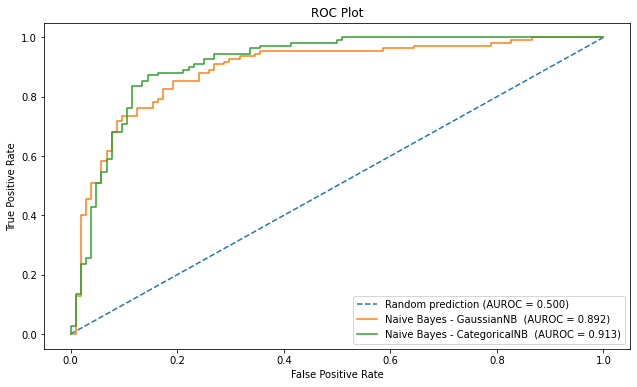

In [230]:
#ROC for best Naive
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(gnb_false, gnb_true, label='Naive Bayes - GaussianNB  (AUROC = %0.3f)' % gnb_auc)
plt.plot(cls_false, cls_true, label='Naive Bayes - CategoricalNB  (AUROC = %0.3f)' % cls_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim[(0,1)]
#plt.ylim[(0,1.05)]
plt.legend()
plt.show()

#best Naive
best_nv_cm1 = round(clsnaive_results,2)
best_nv_auc1 = round(cls_auc,2)
best_nv_sen1 = clsnaive_sen
best_nv_cross1 = round(clsnaive_cross,2)


Logistic Regression

   Confusion Matrix - ValidationData


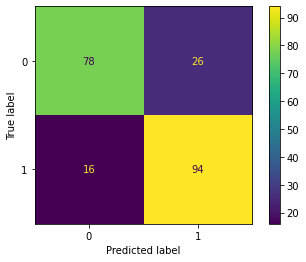

Training Accuracy: 0.85
Validation Accuracy: 0.80
Sensetivity(Class:1): 0.78
Validation Misclassified samples: 42

              precision    recall  f1-score   support

           0       0.83      0.75      0.79       104
           1       0.78      0.85      0.82       110

    accuracy                           0.80       214
   macro avg       0.81      0.80      0.80       214
weighted avg       0.81      0.80      0.80       214

Cross Validation - 7 Fold: 0.85


In [231]:
#Logistic Regression

x = df.drop(['HeartDisease'], axis = 'columns')
x = pd.get_dummies(x, columns = predictors, drop_first= False)
y = df['HeartDisease']

lr = LogisticRegression(C=1, penalty='l2', solver = 'liblinear')
lr.fit(trainData, trainTarget)
#dummies and  0-1

#Model Performance
predicted = lr.predict(validData)
misclassified = (validTarget != predicted).sum()
lr_results = accuracy_score(validTarget, predicted)
lr_roc = roc_auc_score(validTarget, predicted)
c_matrix = confusion_matrix(validTarget, predicted)
lr_sen = round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2)
lr_cross = np.mean(cross_val_score(lr, x,y, cv=7))
predictedp = lr.predict_proba(validData)
predictedp = predictedp[:,1]
lr_auc = roc_auc_score(validTarget,predictedp)
lr_false, lr_true, _ = roc_curve(validTarget, predictedp)
print('Logistic Regression\n')
print('   Confusion Matrix - ValidationData')
plot_confusion_matrix(lr, validData, validTarget)
plt.show()
print('Training Accuracy: %.2f' % lr.score(trainData, trainTarget))
print('Validation Accuracy: %.2f' % round(lr_results,2))
print('Sensetivity(Class:1): %.2f' %round(c_matrix[1][1]/(c_matrix[0][1]+c_matrix[1][1]),2))
print('Validation Misclassified samples: {}\n'.format(misclassified))
print(classification_report(validTarget, predicted))
print('Cross Validation - 7 Fold: %.2f' % round(lr_cross,2))

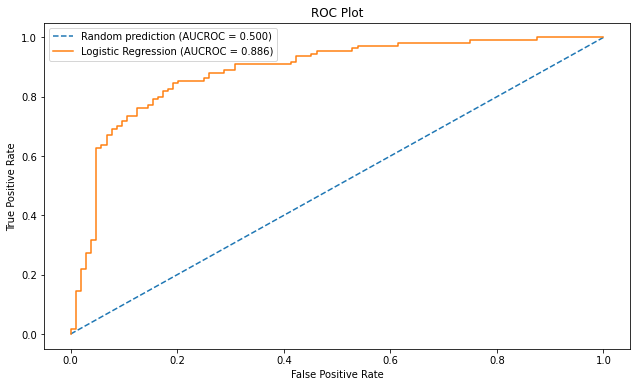

In [232]:
#ROC for best Randomforest
randomp = [0 for _ in range(len(validTarget))]
random_auc = roc_auc_score(validTarget, randomp)
r_fpr, r_tpr, _ = roc_curve(validTarget, randomp)

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUCROC = %0.3f)' % random_auc)
plt.plot(lr_false, lr_true, label='Logistic Regression (AUCROC = %0.3f)' % lr_auc)


fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xlim = [(0,1)]
plt.ylim = [(0,1.01)]
plt.legend()
plt.show()

#best lg
best_lr_cm1 = round(lr_results,2)
best_lr_auc1 = round(lr_auc,2)
best_lr_sen1 = lr_sen
best_lr_cross1 = round(lr_cross,2)


In [233]:
# The best result of each method will be added to the table
FinalResults = [
        {'Model':'Best KNN', 'CM.Accuracy': bestknn_cm_accuracy1,'AUCROC': round(bestknn_auc1,2) ,  'Sensetivity (1)':bestknn_sen1, 
         'Cross Validation': bestknn_cross1},
         {'Model':'Best RandomForest', 'CM.Accuracy': best_rf_cm1,'AUCROC':best_rf_auc1,  'Sensetivity (1)':best_rf_sen1, 
         'Cross Validation': best_rf_cross1},
         {'Model':'Best Decision Tree', 'CM.Accuracy': best_dt_cm1,'AUCROC': best_dt_auc1,  'Sensetivity (1)':best_dt_sen1, 
         'Cross Validation': best_dt_cross1},
         {'Model':'Best Naive Bayes', 'CM.Accuracy': best_nv_cm1,'AUCROC':best_nv_auc1 ,  'Sensetivity (1)':best_nv_sen1, 
         'Cross Validation': best_nv_cross1},
         {'Model':'Best Logistic Regression', 'CM.Accuracy': best_lr_cm1,'AUCROC':best_lr_auc1,  'Sensetivity (1)':best_lr_sen1, 
         'Cross Validation': best_lr_cross1}  
        ]


FinalResults = pd.DataFrame(FinalResults, columns=['Model','CM.Accuracy','AUCROC', 'Sensetivity (1)', 'Cross Validation'])
FinalResults

,Model,CM.Accuracy,AUCROC,Sensetivity (1),Cross Validation
0,Best KNN,0.85,0.91,0.87,0.65
1,Best RandomForest,0.87,0.92,0.84,0.86
2,Best Decision Tree,0.81,0.81,0.79,0.82
3,Best Naive Bayes,0.86,0.91,0.84,0.84
4,Best Logistic Regression,0.80,0.89,0.78,0.85


# Final Graph and table

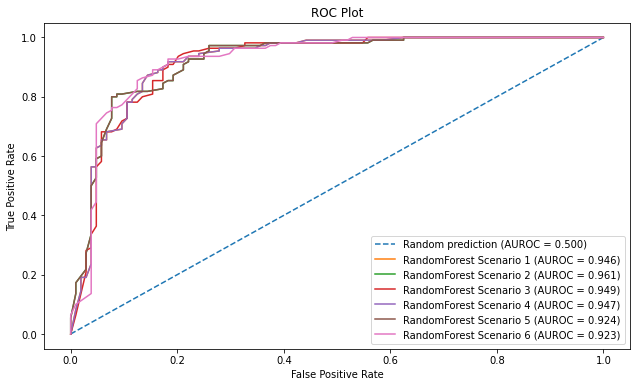

<Figure size 864x720 with 0 Axes>

In [234]:
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % random_auc)
plt.plot(rfd_false, rfd_true, label='RandomForest Scenario 1 (AUROC = %0.3f)' % rfd_auc_best1)
plt.plot(rf_false, rf_true, label='RandomForest Scenario 2 (AUROC = %0.3f)' % rf_auc_best2)
plt.plot(rfa_false, rfa_true, label='RandomForest Scenario 3 (AUROC = %0.3f)' % rfa_auc_best3)
plt.plot(rfd_false, rfd_true, label='RandomForest Scenario 4 (AUROC = %0.3f)' % rfd_auc_best4)
plt.plot(rf_false, rf_true, label='RandomForest Scenario 5 (AUROC = %0.3f)' % rf_auc_best5)
plt.plot(rfad_false, rfad_true, label='RandomForest Scenario 6 (AUROC = %0.3f)' % rfad_auc_best6)

fig = plt.gcf()
fig.set_size_inches(10.5, 6)
plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.xlim([0.0, 1.0])
#plt.ylim([0.0, 1.05])
plt.legend()
plt.figure(figsize=(12,10))
plt.show()